# Phase 1: Cohort Analysis Using RFM Models

## Recency, Frequency, Monetary Value Using BG-NBD, GGF Models

### Beta Geometric - Negative Binomial Distribution, Gamma Gamma Fitter Models

#### Lifetimes Curated Models with Best MAE Penalizer using Scikit-Learn Metrics

##### MAE: Mean Absolute Error, a Regression Hyperparemeter Optimiser

##### CLTV:Customer Lifetime Value 

In [468]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install session_info

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/83.6 kB ? eta -:--:--
   ---------------------------------------- 0.0/83.6 kB ? eta -:--:--
   ----------------------------- ---------- 61.4/83.6 kB ? eta -:--:--
   ---------------------------------------- 83.6/83.6 kB 2.4 MB/s eta 0:00:00
  Created wheel for session_info: filename=session_info-1.0.0-py3-none-any.whl size=8072 sha256=f231a9a6e6cec843d6d1ef3aa468d307fea031585f3ce5f053d813511d15c467
  Stored in directory: c:\users\desk\appdata\local\pip\cache\wheels\23\da\7c\868424f4a5845ab58cd8686e0eb405e9e1e2d4152bf702c39d
Successfully built session_info
Note: you may need to restart the kernel to use updated packages.


In [5]:
import session_info

session_info.show()


In [6]:
import pandas as pd

pd.options.mode.chained_assignment = None


In [9]:
import missingno as msno
import numpy as np
from scipy.cluster import hierarchy


In [8]:
pip install missingno

In [9]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick 
plt.style.use('seaborn-v0_8-pastel')
plt.rcParams.update({'font.size': 10})
#plt.rcParams["axes.facecolor"] = "#C2DFFF"
plt.rcParams["axes.grid"] = 1
mpl.rcParams['lines.linewidth'] = 2
%matplotlib inline

In [10]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.mlab as mlab


In [11]:
import seaborn as sns

sns.set_theme(style="ticks", color_codes=True, font_scale=1.5, palette="pastel")
sns.set_context("poster")
# sns.set_palette("husl")
sns.set(rc={"image.cmap": "coolwarm"})
# sns.set_style("white")
# refer block 104 #or +- around
color = sns.color_palette()
sns.set_style("darkgrid")


In [12]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings("ignore")


def ignore_warn(*args, **kwargs):
    pass


warnings.warn = ignore_warn


In [13]:
from mpl_toolkits.mplot3d import Axes3D


In [14]:
import plotly as py
import plotly.graph_objs as go

py.offline.init_notebook_mode()


In [15]:
from scipy import stats
from scipy.stats import boxcox, norm, probplot, skew


In [16]:
import sklearn.metrics as metrics
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler


In [19]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer


In [18]:
pip install yellowbrick

In [20]:
from itertools import combinations


In [21]:
import datetime as dt

In [22]:
# Assumptions/Drivers
training_end = "2011-06-08"
validation_end = "2011-12-9"
WACC = 0.25  # Weighted average cost of capital
monthly_discount_rate = WACC / 12
profit_margin = 0.26
t_params = [1, 30, 90, 365]


In [25]:
import lifetimes
import lifetimes.fitters
import lifetimes.plotting
import lifetimes.utils


In [24]:
pip install lifetimes

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: pytz>=2020.1 in c:\programdata\anaconda3\lib\site-packages (from pandas>=0.24.0->lifetimes) (2024.1)



In [26]:
# Data Explore
from lifetimes.plotting import *
from lifetimes.utils import *

# from lifetimes.estimation import *


In [27]:
# Frequency/Recency Analysis Using the BG/NBD Model
from lifetimes import BetaGeoFitter, GammaGammaFitter
from lifetimes.datasets import load_transaction_data
from lifetimes.plotting import (
    plot_calibration_purchases_vs_holdout_purchases,
    plot_frequency_recency_matrix,
    plot_history_alive,
    plot_period_transactions,
    plot_probability_alive_matrix,
)
from lifetimes.utils import (
    calibration_and_holdout_data,
    summary_data_from_transaction_data,
)


In [28]:
def merge_dfs(df, lst, key):
    for d in lst:
        df = df.merge(d, on=key)
    return df


In [30]:
retail_2009 = pd.read_csv("online_retail_II.csv", parse_dates=["InvoiceDate"])


In [31]:
retail_2009.rename(
    columns={"Price": "UnitPrice", "Invoice": "InvoiceNo", "Customer ID": "CustomerID"},
    inplace=True,
)


In [32]:
retail_2009.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036427 entries, 0 to 1036426
Data columns (total 17 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Unnamed: 0     1036427 non-null  int64         
 1   CustomerID     1036427 non-null  int64         
 2   CohortYear     1036427 non-null  int64         
 3   Purchases      1036427 non-null  int64         
 4   InvoiceDate    1036427 non-null  datetime64[ns]
 5   Quantity       1036427 non-null  int64         
 6   UnitPrice      1036427 non-null  float64       
 7   Sales          1036427 non-null  float64       
 8   InvoiceType    1036427 non-null  object        
 9   InvoiceNo      1036427 non-null  int64         
 10  StockCode      1036427 non-null  object        
 11  CustomerSince  1036427 non-null  object        
 12  InvoiceYear    1036427 non-null  int64         
 13  InvoiceMonth   1036427 non-null  int64         
 14  Description    1036427 non-null  o

In [33]:
len(retail_2009.index)


1036427

In [34]:
retail_2009.to_csv("retail09.csv")


In [36]:
# Read CSV files from List
#retail_combo = pd.concat(map(pd.read_csv, ["retail09.csv", "retail10.csv"]))
#retail_combo.to_csv("retail_combo.csv")


In [37]:
retail = pd.read_csv("retail_combo.csv", parse_dates=["InvoiceDate"])


In [38]:
retail = retail.sort_values("InvoiceDate")
retail = retail.reset_index()


In [39]:
len(retail.index)


1036427

In [42]:
#retail.drop(["Unnamed: 0.1", "Unnamed: 0", "index"], axis=1, inplace=True)


In [41]:
# raw retail datasheet entries count
retail.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036427 entries, 0 to 1036426
Data columns (total 18 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   index          1036427 non-null  int64         
 1   Unnamed: 0     1036427 non-null  int64         
 2   CustomerID     1036427 non-null  int64         
 3   CohortYear     1036427 non-null  int64         
 4   Purchases      1036427 non-null  int64         
 5   InvoiceDate    1036427 non-null  datetime64[ns]
 6   Quantity       1036427 non-null  int64         
 7   UnitPrice      1036427 non-null  float64       
 8   Sales          1036427 non-null  float64       
 9   InvoiceType    1036427 non-null  object        
 10  InvoiceNo      1036427 non-null  int64         
 11  StockCode      1036427 non-null  object        
 12  CustomerSince  1036427 non-null  object        
 13  InvoiceYear    1036427 non-null  int64         
 14  InvoiceMonth   1036427 non-null  i

In [43]:
# retail data integrity checkpoint
retail["CustomerID"].value_counts()[17850]


2796

In [44]:
# retail data customerid count checkpoint
retail["CustomerID"].value_counts().sum()


1036427

<Axes: >

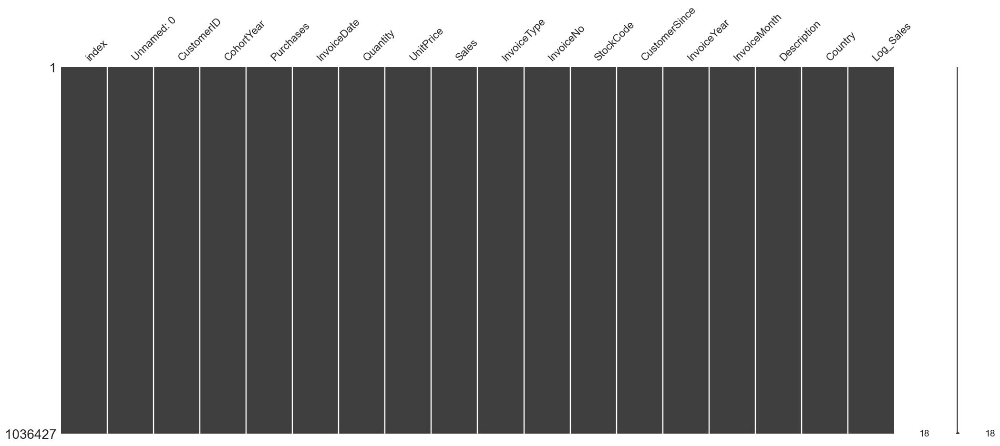

In [45]:
msno.matrix(retail)


In [46]:
retail.isnull().sum()


index            0
Unnamed: 0       0
CustomerID       0
CohortYear       0
Purchases        0
InvoiceDate      0
Quantity         0
UnitPrice        0
Sales            0
InvoiceType      0
InvoiceNo        0
StockCode        0
CustomerSince    0
InvoiceYear      0
InvoiceMonth     0
Description      0
Country          0
Log_Sales        0
dtype: int64

In [47]:
len(retail.index)


1036427

In [48]:
retail[retail.UnitPrice < 0]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [49]:
retail[retail.UnitPrice == 0]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [50]:
retail = retail[retail.UnitPrice > 0]


In [51]:
len(retail.index)


1036427

In [52]:
retail[retail.UnitPrice <= 0]  # 2517 entries dropped


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [53]:
retail[retail.Description == "Adjust bad debt"]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [54]:
retail = retail[retail.Description != "Adjust bad debt"]


In [55]:
len(retail.index)


1036427

In [56]:
retail[
    retail.Description.isnull()
]  # dropped earlier as Quantity == 0 for these entries


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [57]:
retail[retail.CustomerID.isnull()]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


##### RETAIN == 850194 As CustomerID for Retaining Sales Estimates,
##### since 236870  entries are significant number of entries

In [58]:
retail["CustomerID"] = retail["CustomerID"].fillna(850194)


In [59]:
retail.isnull().sum()  # All null entries are fixed
# retail[retail.Description.isnull()].CustomerID.nunique()
# retail[retail.Description.isnull()].UnitPrice.value_counts()


index            0
Unnamed: 0       0
CustomerID       0
CohortYear       0
Purchases        0
InvoiceDate      0
Quantity         0
UnitPrice        0
Sales            0
InvoiceType      0
InvoiceNo        0
StockCode        0
CustomerSince    0
InvoiceYear      0
InvoiceMonth     0
Description      0
Country          0
Log_Sales        0
dtype: int64

In [60]:
print(
    "Check if we had negative quantity and prices at same register:",
    "No"
    if retail[(retail.Quantity < 0) & (retail.UnitPrice < 0)].shape[0] == 0
    else "Yes",
    "\n",
)
print(
    "Check how many register we have where quantity is negative",
    "and prices is 0 or vice-versa:",
    retail[(retail.Quantity <= 0) & (retail.UnitPrice <= 0)].shape[0],
)
print(
    "\nWhat is the customer ID of the registers above:",
    retail.loc[
        (retail.Quantity <= 0) & (retail.UnitPrice <= 0), ["CustomerID"]
    ].CustomerID.unique(),
)
print(
    "\n% Negative Quantity: {:3.2%}".format(
        retail[(retail.Quantity < 0)].shape[0] / retail.shape[0]
    )
)
print(
    "\nAll register with negative quantity has Invoice start with:",
    retail.loc[(retail.Quantity < 0) & ~(retail.CustomerID.isnull()), "InvoiceNo"]
    .apply(lambda x: x[0])
    .unique(),
)


Check if we had negative quantity and prices at same register: No 

Check how many register we have where quantity is negative and prices is 0 or vice-versa: 0

What is the customer ID of the registers above: []

% Negative Quantity: 0.00%

All register with negative quantity has Invoice start with: []


In [61]:
display(retail.apply(lambda x: x.unique().shape[0]).sort_values(ascending=False))


index            1036427
Unnamed: 0       1036427
InvoiceNo          39509
CustomerID          8773
CustomerSince       5740
Sales               5403
Description         5356
Log_Sales           5270
StockCode           4874
UnitPrice            676
InvoiceDate          604
Quantity             498
Purchases             86
Country               43
InvoiceMonth          12
InvoiceYear            3
CohortYear             3
InvoiceType            1
dtype: int64

In [62]:
# retail = retail[pd.notnull(retail["CustomerID"])]
len(retail.index)
# or #format(retail.shape[0])


1036427

In [63]:
retail[retail.Description.str.len() < 5]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [64]:
retail.InvoiceNo.value_counts()


InvoiceNo
537434    1348
538071    1298
537638    1200
537237    1192
536876    1184
          ... 
563934       1
507659       1
507584       1
563902       1
581483       1
Name: count, Length: 39509, dtype: int64

In [66]:
#retail[retail["InvoiceNo"].str.startswith("C")]


In [67]:
retail[(retail["Quantity"] < 1)]


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales


In [68]:
# Alter Code for dealing Order Cancellations,
# since we'll need them for behaviour cohorts later, we save them in separate csv
"""
retail["Cancelled"] = retail["InvoiceNo"].apply(lambda x: 1 if x.startswith("C") else 0)
#Optional Check:
cancelled_invoiceNo = retail[retail.Cancelled == 1].InvoiceNo.tolist()
cancelled_invoiceNo = [x[1:] for x in cancelled_invoiceNo]
cancelled_invoiceNo[:5]
retail[retail["InvoiceNo"].isin(cancelled_invoiceNo)]
"""


'\nretail["Cancelled"] = retail["InvoiceNo"].apply(lambda x: 1 if x.startswith("C") else 0)\n#Optional Check:\ncancelled_invoiceNo = retail[retail.Cancelled == 1].InvoiceNo.tolist()\ncancelled_invoiceNo = [x[1:] for x in cancelled_invoiceNo]\ncancelled_invoiceNo[:5]\nretail[retail["InvoiceNo"].isin(cancelled_invoiceNo)]\n'

In [69]:
order_cancellations = retail[(retail["Quantity"] < 1)]
order_cancellations["InvoiceType"] = "Order Cancellations"
order_cancellations["Quantity"] = order_cancellations["Quantity"] * -1
order_cancellations["UnitPrice"] = order_cancellations["UnitPrice"] * -1
order_cancellations["Sales"] = (
    order_cancellations["Quantity"] * order_cancellations["UnitPrice"]
)
order_cancellations["Sales"] = order_cancellations["Sales"]
order_cancellations_projection = [
    "CustomerID",
    "InvoiceDate",
    "Quantity",
    "UnitPrice",
    "Sales",
    "InvoiceType",
    "InvoiceNo",
    "StockCode",
    # "CustomerSince",
    # "InvoiceYear",
    # "InvoiceMonth",
    "Description",
    "Country",
]
order_cancellations = order_cancellations[order_cancellations_projection]
order_cancellations.Sales.sum()


0.0

In [70]:
order_cancellations.to_csv("order_cancellations.csv")


In [71]:
order_cancellations["CustomerID"].value_counts()
###Mark for behavioural cohort


Series([], Name: count, dtype: int64)

In [72]:
len(retail.index)


1036427

In [73]:
retail.Quantity.value_counts()


Quantity
1        290359
2        159042
12       121662
6         85113
4         72091
          ...  
274           1
585           1
354           1
367           1
80995         1
Name: count, Length: 498, dtype: int64

In [74]:
retail = retail[(retail["Quantity"] >= 1)]


In [75]:
len(retail.index)


1036427

In [76]:
len(order_cancellations.index)


0

In [78]:
#retail[retail.InvoiceNo.str.len() != 6]  # fixed 9288 Cancellation Entries


In [79]:
retail[retail.StockCode.str.contains("^[a-zA-Z]")].StockCode.value_counts()


Series([], Name: count, dtype: int64)

In [80]:
retail[retail.StockCode.str.contains("^[a-zA-Z]")].StockCode.value_counts().sum()


0

In [81]:
retail[retail.StockCode.str.contains("^[a-zA-Z]")].Description.value_counts()


Series([], Name: count, dtype: int64)

In [82]:
retail[retail.StockCode.str.contains("^[a-zA-Z]")].Description.value_counts().sum()


0

In [83]:
retail[retail.StockCode.str.len() > 5].StockCode.value_counts()


StockCode
85123A    5686
85099B    4124
82494L    2063
85099C    1926
85099F    1885
          ... 
72751C       1
35751D       1
71101A       1
72754D       1
85034b       1
Name: count, Length: 1484, dtype: int64

In [84]:
retail = retail[~retail.StockCode.str.contains("^[a-zA-Z]")]


In [85]:
len(retail.index)  # 2378 invalid Stock Code Entries Dropped


1036427

In [86]:
retail["Description"] = retail["Description"].str.lower()


In [87]:
retail.head()


,index,Unnamed: 0,CustomerID,CohortYear,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,CustomerSince,InvoiceYear,InvoiceMonth,Description,Country,Log_Sales
0,0,0,13085,2009,8,2009-12-01,12,6.95,83.40,Invoice,489434,85048,2009-12-01 07:45:00,2009,12,15cm christmas glass ball 20 lights,United Kingdom,4.423648
1,33985,33985,17063,2009,13,2009-12-01,6,3.75,22.50,Invoice,489552,84997D,2009-12-01 12:36:00,2009,12,pink 3 piece mini dots cutlery set,United Kingdom,3.113515
2,33984,33984,17063,2009,13,2009-12-01,3,1.95,5.85,Invoice,489552,21490,2009-12-01 12:36:00,2009,12,set of three 50's gift wraps,United Kingdom,1.766442
3,33983,33983,17063,2009,13,2009-12-01,12,0.65,7.80,Invoice,489552,21902,2009-12-01 12:36:00,2009,12,"key fob , front door",United Kingdom,2.054124
4,33982,33982,17063,2009,13,2009-12-01,2,1.65,3.30,Invoice,489552,22079,2009-12-01 12:36:00,2009,12,ribbon reel hearts design,United Kingdom,1.193922


In [88]:
retail.groupby("StockCode")["Description"].nunique()[
    retail.groupby("StockCode")["Description"].nunique() != 1
]


StockCode
15058A    2
15058B    2
16011     2
16012     2
16151A    2
         ..
85232b    2
90014A    2
90014B    2
90014C    2
90208     2
Name: Description, Length: 646, dtype: int64

In [89]:
retail[retail.StockCode == "17107D"].Description.value_counts()


Description
flower fairy,5 summer b'draw liners    72
flower fairy 5 drawer liners           21
flower fairy 5 summer draw liners       1
Name: count, dtype: int64

In [91]:
cat_des_df = retail.groupby(["StockCode", "Description"]).count().reset_index()
display(
    cat_des_df.StockCode.value_counts()[cat_des_df.StockCode.value_counts() > 1]
    .reset_index()
    .head()
)
retail[
    retail["StockCode"]
    == cat_des_df.StockCode.value_counts()[
        cat_des_df.StockCode.value_counts() > 1
    ].reset_index()["index"][4]
]["Description"].unique()


,StockCode,count
0,22346,4
1,21955,4
2,22345,4
3,23196,4
4,22384,4


KeyError: 'index'

In [92]:
retail.CustomerID.value_counts()


CustomerID
17841     12877
14911     11064
12748      7181
14606      6554
14096      5095
          ...  
523154        1
540476        1
492647        1
540833        1
556033        1
Name: count, Length: 8773, dtype: int64

In [93]:
retail["CustomerID"] = retail["CustomerID"].astype(str).astype(float)


In [94]:
retail["CustomerID"] = retail["CustomerID"].astype(int)


In [95]:
retail["InvoiceYear"] = retail["InvoiceDate"].dt.year
retail["InvoiceMonth"] = retail["InvoiceDate"].dt.month
# retail.head()


In [96]:
customer_keys = pd.DataFrame(retail.groupby("CustomerID")["InvoiceDate"].min())
customer_keys = customer_keys.reset_index()
customer_keys.columns = ["CustomerID", "CustomerSince"]
customer_keys


,CustomerID,CustomerSince
0,12346,2010-03-02
1,12347,2010-10-31
2,12348,2010-09-27
3,12349,2010-04-29
4,12350,2011-02-02
...,...,...
8768,581435,2011-12-08
8769,581439,2011-12-08
8770,581492,2011-12-09
8771,581497,2011-12-09


In [97]:
customer_keys.isnull().sum()


CustomerID       0
CustomerSince    0
dtype: int64

In [98]:
customer_keys.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8773 entries, 0 to 8772
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   CustomerID     8773 non-null   int32         
 1   CustomerSince  8773 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int32(1)
memory usage: 102.9 KB


In [99]:
customer_keys.to_csv("customer_keys.csv")


In [100]:
# Caution Before Re-execution: leads to 'CustomerSince' Redundancy
retail = retail.merge(customer_keys, on="CustomerID")
# retail.head()


In [101]:
retail.shape


(1036427, 19)

In [102]:
np.where(pd.isnull(retail))


(array([], dtype=int64), array([], dtype=int64))

In [103]:
retail.isna().sum()


index              0
Unnamed: 0         0
CustomerID         0
CohortYear         0
Purchases          0
InvoiceDate        0
Quantity           0
UnitPrice          0
Sales              0
InvoiceType        0
InvoiceNo          0
StockCode          0
CustomerSince_x    0
InvoiceYear        0
InvoiceMonth       0
Description        0
Country            0
Log_Sales          0
CustomerSince_y    0
dtype: int64

In [104]:
# retail = retail[(retail["Quantity"] > 0)]
len(retail.index)


1036427

In [105]:
retail["Sales"] = retail["Quantity"] * retail["UnitPrice"]
retail["InvoiceType"] = "Invoice"


In [107]:
retail_projection = [
    "CustomerID",
    "InvoiceDate",
    "Quantity",
    "UnitPrice",
    "Sales",
    "InvoiceType",
    "InvoiceNo",
    "StockCode",
   # "CustomerSince",
    "InvoiceYear",
    "InvoiceMonth",
    "Description",
    "Country",
]
retail = retail[retail_projection]
retail.head()


,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
0,13085,2009-12-01,12,6.95,83.40,Invoice,489434,85048,2009,12,15cm christmas glass ball 20 lights,United Kingdom
1,17063,2009-12-01,6,3.75,22.50,Invoice,489552,84997D,2009,12,pink 3 piece mini dots cutlery set,United Kingdom
2,17063,2009-12-01,3,1.95,5.85,Invoice,489552,21490,2009,12,set of three 50's gift wraps,United Kingdom
3,17063,2009-12-01,12,0.65,7.80,Invoice,489552,21902,2009,12,"key fob , front door",United Kingdom
4,17063,2009-12-01,2,1.65,3.30,Invoice,489552,22079,2009,12,ribbon reel hearts design,United Kingdom


In [108]:
retail.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036427 entries, 0 to 1036426
Data columns (total 12 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   CustomerID    1036427 non-null  int32         
 1   InvoiceDate   1036427 non-null  datetime64[ns]
 2   Quantity      1036427 non-null  int64         
 3   UnitPrice     1036427 non-null  float64       
 4   Sales         1036427 non-null  float64       
 5   InvoiceType   1036427 non-null  object        
 6   InvoiceNo     1036427 non-null  int64         
 7   StockCode     1036427 non-null  object        
 8   InvoiceYear   1036427 non-null  int32         
 9   InvoiceMonth  1036427 non-null  int32         
 10  Description   1036427 non-null  object        
 11  Country       1036427 non-null  object        
dtypes: datetime64[ns](1), float64(2), int32(3), int64(2), object(4)
memory usage: 83.0+ MB


In [109]:
retail_sums = retail[["InvoiceYear", "Sales"]].groupby("InvoiceYear").sum()
retail_sums = retail_sums.reset_index()
retail_sums["InvoiceYear"] = retail_sums["InvoiceYear"].astype(int)
retail_sums


,InvoiceYear,Sales
0,2009,800567.77
1,2010,9793444.40
2,2011,9490818.52


##### RETAIN == 850194 As CustomerID for Retaining Sales Estimates,
##### since 234245 entries are significant number of entries

In [110]:
generic_retail = retail.copy()


In [111]:
generic_retail = generic_retail[generic_retail.CustomerID == 850194]


In [112]:
len(generic_retail.index)


0

In [113]:
generic_retail.InvoiceNo.nunique()


0

In [114]:
generic_retail.drop(["CustomerID"], axis=1, inplace=True)


In [115]:
generic_retail["CustomerID"] = generic_retail["InvoiceNo"]


In [116]:
# generic_retail[["CustomerID"]] = generic_retail[["CustomerID"]].apply(pd.to_numeric) #for int64


In [117]:
generic_retail["CustomerID"] = generic_retail["CustomerID"].astype(int)


In [118]:
genret = generic_retail.to_csv("generic_retail.csv")


In [119]:
retail = retail[retail.CustomerID != 850194]  ###Trace


In [120]:
len(retail.index)


1036427

In [121]:
len(generic_retail.index)


0

In [123]:
#retail = retail.append(
 #   generic_retail, ignore_index=False, verify_integrity=True, sort=None
#)


In [124]:
retail = retail.sort_values("InvoiceDate")


In [125]:
retail = retail.reset_index()


In [126]:
len(retail.index)


1036427

In [127]:
customer_counts = retail.CustomerID.value_counts().sort_values(ascending=False)


In [128]:
retail["CustomerID"].nunique()


8773

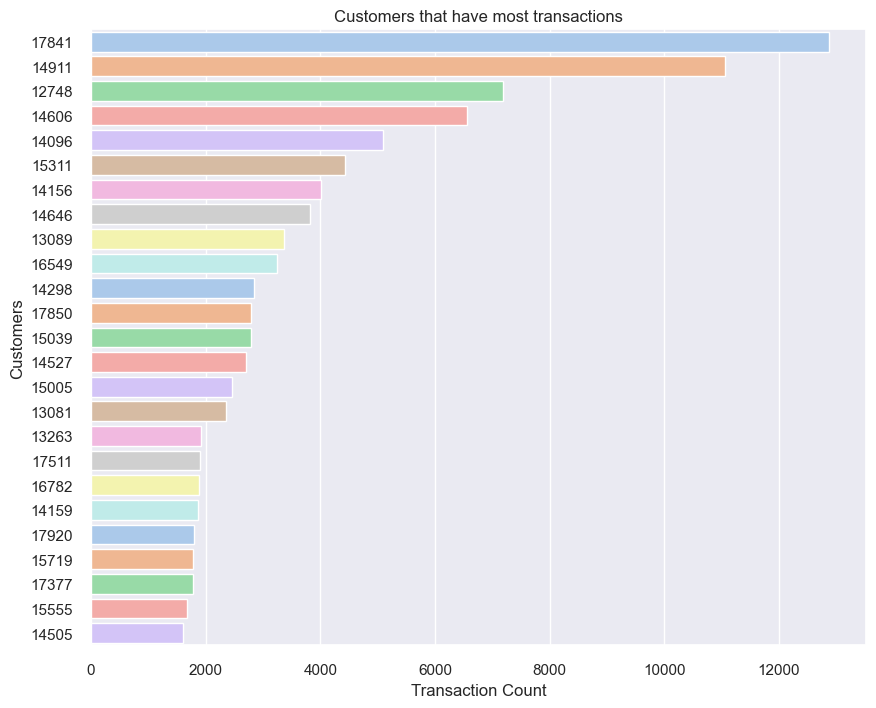

In [129]:
sns.set()
customer_counts = retail.CustomerID.value_counts().sort_values(ascending=False).head(25)
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(
    y=customer_counts.index,
    x=customer_counts.values,
    orient="h",
    ax=ax,
    order=customer_counts.index,
    palette="pastel",
)
plt.title("Customers that have most transactions")
plt.ylabel("Customers")
plt.xlabel("Transaction Count")
plt.show()


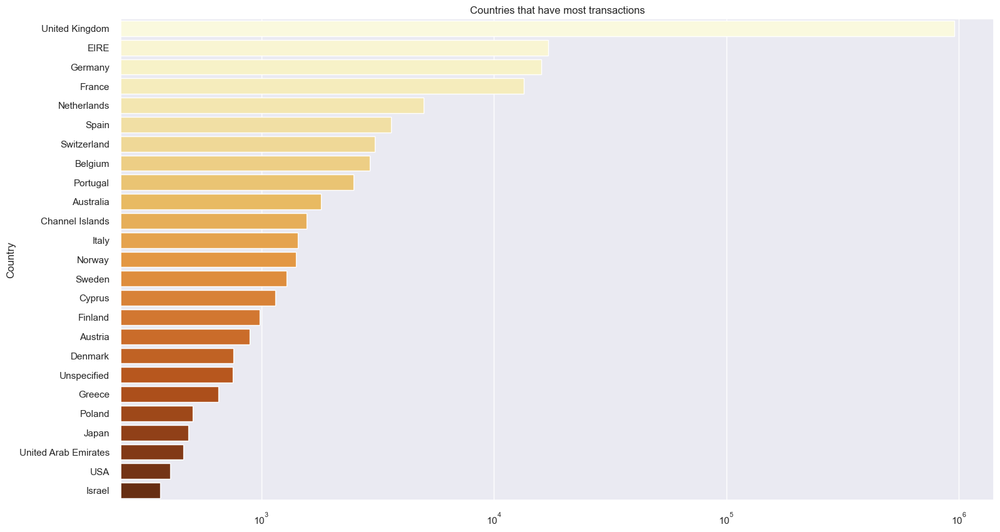

In [130]:
sns.set()
country_counts = retail.Country.value_counts().sort_values(ascending=False).head(25)
fig, ax = plt.subplots(figsize=(18, 10))
sns.barplot(
    x=country_counts.values,
    y=country_counts.index,
    orient="h",
    ax=ax,
    order=country_counts.index,
    palette="YlOrBr",
)
plt.title("Countries that have most transactions")
plt.xscale("log")
plt.show()


In [131]:
print("Lower limit for UnitPrice: " + str(np.exp(-2)))
print("Upper limit for UnitPrice: " + str(np.exp(3)))


Lower limit for UnitPrice: 0.1353352832366127
Upper limit for UnitPrice: 20.085536923187668


In [132]:
np.quantile(retail.UnitPrice, 0.99)


16.95

In [133]:
print("We have {} observations.".format(retail.shape[0]))

retail = retail[(retail.UnitPrice > 0.1)]  # & (retail.UnitPrice < 20)]

print(
    "We have {} observations after removing unit prices smaller than 0.1 and greater than 20.".format(
        retail.shape[0]
    )
)


We have 1036427 observations.
We have 1036427 observations after removing unit prices smaller than 0.1 and greater than 20.


In [134]:
retail.to_csv("online_retail_sales.csv", index=False)

In [135]:
retail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1036427 entries, 0 to 1036426
Data columns (total 13 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   index         1036427 non-null  int64         
 1   CustomerID    1036427 non-null  int32         
 2   InvoiceDate   1036427 non-null  datetime64[ns]
 3   Quantity      1036427 non-null  int64         
 4   UnitPrice     1036427 non-null  float64       
 5   Sales         1036427 non-null  float64       
 6   InvoiceType   1036427 non-null  object        
 7   InvoiceNo     1036427 non-null  int64         
 8   StockCode     1036427 non-null  object        
 9   InvoiceYear   1036427 non-null  int32         
 10  InvoiceMonth  1036427 non-null  int32         
 11  Description   1036427 non-null  object        
 12  Country       1036427 non-null  object        
dtypes: datetime64[ns](1), float64(2), int32(3), int64(3), object(4)
memory usage: 90.9+ MB


In [136]:
chunk_size = 259107
def write_chunk(part, lines):
    with open('retail_cass_'+ str(part) +'.csv', 'w') as f_out:
        f_out.write(header)
        f_out.writelines(lines)
with open("online_retail_sales.csv", "r") as f:
    count = 0
    header = f.readline()
    lines = []
    for line in f:
        count += 1
        lines.append(line)
        if count % chunk_size == 0:
            write_chunk(count // chunk_size, lines)
            lines = []
    # write remainder
    if len(lines) > 0:
        write_chunk((count // chunk_size) + 1, lines)


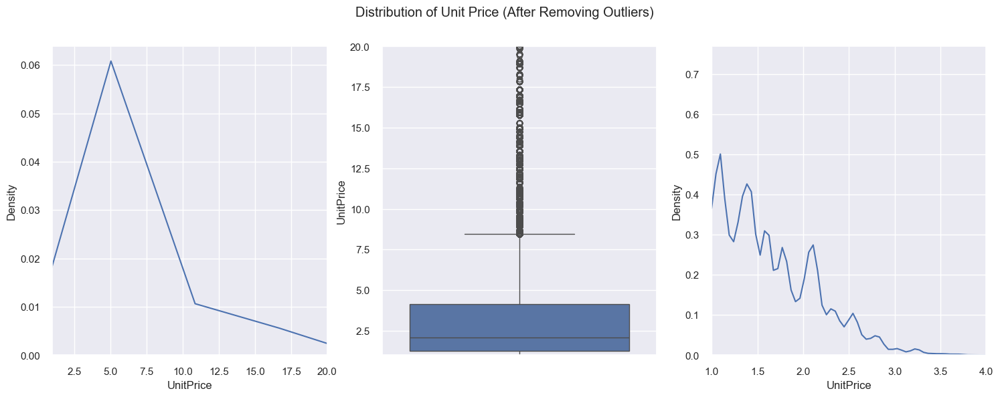

In [137]:
sns.set()
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.kdeplot(retail["UnitPrice"], ax=axes[0]).set_xlim(1, 20)
sns.boxplot(y=retail["UnitPrice"], ax=axes[1]).set_ylim(1, 20)
sns.kdeplot(np.log(retail["UnitPrice"]), ax=axes[2]).set_xlim(1, 4)
fig.suptitle("Distribution of Unit Price (After Removing Outliers)")
plt.show()


(1.0, 20.0)

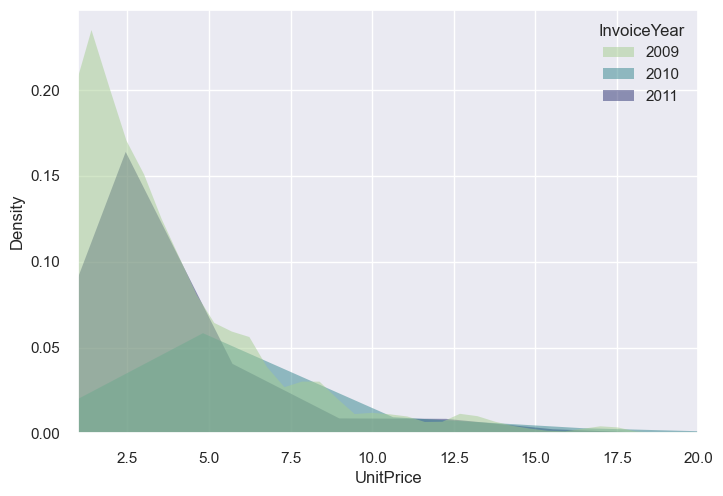

In [138]:
sns.set()
sns.kdeplot(
    data=retail,
    x="UnitPrice",
    hue="InvoiceYear",
    fill=True,
    common_norm=False,
    palette="crest",
    alpha=0.5,
    linewidth=0,
).set_xlim(1, 20)


In [139]:
print("Upper limit for Quantity: " + str(np.exp(5)))


Upper limit for Quantity: 148.4131591025766


In [140]:
np.quantile(retail.Quantity, 0.99)


100.0

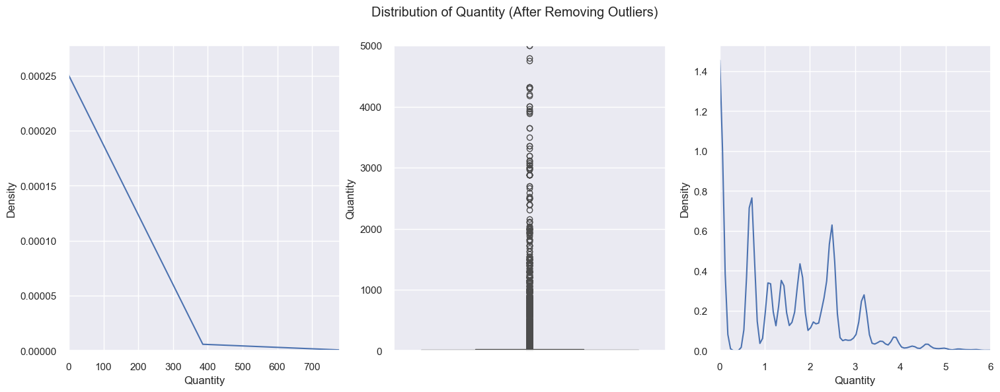

In [141]:
sns.set()
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.kdeplot(retail["Quantity"], ax=axes[0]).set_xlim(0, 780)
sns.boxplot(y=retail["Quantity"], ax=axes[1]).set_ylim(0, 5000)
sns.kdeplot(np.log(retail["Quantity"]), ax=axes[2]).set_xlim(0, 6)
fig.suptitle("Distribution of Quantity (After Removing Outliers)")
plt.show()


In [143]:
#retail.skew()


In [145]:
#retail.kurt()


In [147]:
#retail.corr()


In [148]:
retail.describe()


,index,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceNo,InvoiceYear,InvoiceMonth
count,1.036427e+06,1.036427e+06,1036427,1.036427e+06,1.036427e+06,1.036427e+06,1.036427e+06,1.036427e+06,1.036427e+06
mean,5.182130e+05,1.335877e+05,2011-01-03 03:46:20.302327040,1.073258e+01,3.340607e+00,1.937891e+01,5.376605e+05,2.010427e+03,7.508857e+00
min,0.000000e+00,1.234600e+04,2009-12-01 00:00:00,1.000000e+00,1.100000e-01,1.200000e-01,4.894340e+05,2.009000e+03,1.000000e+00
25%,2.591065e+05,1.439000e+04,2010-07-12 00:00:00,1.000000e+00,1.250000e+00,3.900000e+00,5.153530e+05,2.010000e+03,5.000000e+00
50%,5.182130e+05,1.618400e+04,2010-12-07 00:00:00,3.000000e+00,2.100000e+00,9.960000e+00,5.376420e+05,2.010000e+03,8.000000e+00
75%,7.773195e+05,1.804400e+04,2011-07-24 00:00:00,1.100000e+01,4.130000e+00,1.770000e+01,5.610500e+05,2.011000e+03,1.100000e+01
max,1.036426e+06,5.814980e+05,2011-12-09 00:00:00,8.099500e+04,1.157150e+03,1.684696e+05,5.815870e+05,2.011000e+03,1.200000e+01
std,2.991908e+05,2.192006e+05,NaN,1.196996e+02,4.735689e+00,1.970423e+02,2.666072e+04,5.736898e-01,3.525327e+00


## Buy Till You Die Models (BTYD)

In [149]:
print(
    "Min date: {} \nMax date: {}".format(
        retail.InvoiceDate.min(), retail.InvoiceDate.max()
    )
)
print(
    "Time difference is: {}".format(retail.InvoiceDate.max() - retail.InvoiceDate.min())
)


Min date: 2009-12-01 00:00:00 
Max date: 2011-12-09 00:00:00
Time difference is: 738 days 00:00:00


#### Pareto Principle Implementation

In [150]:
def prepare_pareto_data(retail, col, price):

    retail_price = pd.DataFrame(retail.groupby(col)[price].sum())
    retail_price = retail_price.sort_values(price, ascending=False)

    retail_price["CumulativePercentage"] = (
        retail_price[price].cumsum() / retail_price[price].sum() * 100
    ).round(2)

    return retail_price


In [151]:
def create_pareto_plot(retail, col, price, log=True):

    # plt.rcParams["axes.facecolor"] = "#A2A2A2"
    fig, ax = plt.subplots(figsize=(15, 5), dpi=150)
    # plt.rcParams["axes.grid"] = False

    if log == True:
        sns.barplot(
            x=np.arange(len(retail)), y=np.log(retail[price]), ax=ax, color="#101820"
        )
        ax.set_ylabel("Total Price (Log - Scale)")
    else:
        sns.barplot(x=np.arange(len(retail)), y=retail[price], ax=ax, color="#101820")

    ax2 = ax.twinx()

    sns.lineplot(x=np.arange(len(retail)), y=retail.CumulativePercentage, ax=ax2)
    ax2.axhline(80, linestyle="dashed", alpha=1)
    ax2.axhline(90, linestyle="dashed", alpha=0.75)

    vlines = [int(len(retail) * x / 10) for x in range(1, 10)]
    for vline in vlines:
        ax2.axvline(vline, linestyle="dashed", alpha=0.1)

    interaction_80 = (
        retail.shape[0] - retail[retail.CumulativePercentage >= 80].shape[0]
    )
    ax2.axvline(interaction_80, linestyle="dashed", alpha=1)

    interaction_80_percentage = round((interaction_80 / retail.shape[0]) * 100)
    plt.text(interaction_80 + 25, 95, str(interaction_80_percentage) + "%")

    prop = dict(arrowstyle="-|>", color="#000000", lw=1.5, ls="--")
    plt.annotate(
        "",
        xy=(interaction_80 - 10, 80),
        xytext=(interaction_80 + 120, 73),
        arrowprops=prop,
    )

    interaction_90 = (
        retail.shape[0] - retail[retail.CumulativePercentage >= 90].shape[0]
    )
    ax2.axvline(interaction_90, linestyle="dashed", alpha=0.8)
    interaction_90_percentage = round((interaction_90 / retail.shape[0]) * 100)
    plt.text(interaction_90 + 25, 95, str(interaction_90_percentage) + "%")
    plt.annotate(
        "",
        xy=(interaction_90 - 10, 90),
        xytext=(interaction_90 + 120, 83),
        arrowprops=prop,
    )

    ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
    ax.set_yticks([])
    plt.xticks([])
    ax.set_ylabel("Revenue", fontname="Times New Roman")
    ax2.set_ylabel("Cumulative Percentage", fontname="Times New Roman")
    subject = "Customers" if col == "CustomerID" else "Products"
    plt.title("Pareto Chart for " + subject, fontname="Times New Roman")
    ax.set_xlabel(subject, fontname="Times New Roman")
    sns.despine(left=True, right=True, bottom=True, top=True)
    plt.show()


In [152]:
customer_price = prepare_pareto_data(retail, "CustomerID", "Sales")
customer_price.head(10)


,Sales,CumulativePercentage
CustomerID,,
18102,608821.65,3.03
14646,526751.52,5.65
14156,303574.63,7.17
14911,276614.19,8.54
17450,246973.09,9.77
13694,196119.37,10.75
17511,175286.75,11.62
16446,168472.50,12.46
16684,147142.77,13.19


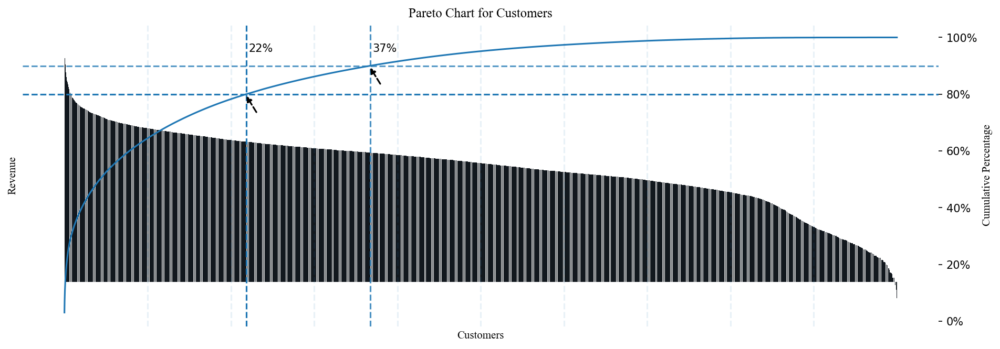

In [153]:
sns.reset_defaults()
create_pareto_plot(customer_price, "CustomerID", "Sales", log=True)


In [154]:
item_price = prepare_pareto_data(retail, "StockCode", "Sales")
item_price.head(10)


,Sales,CumulativePercentage
StockCode,,
22423,344563.25,1.72
85123A,263109.67,3.03
85099B,183454.83,3.94
23843,168469.60,4.78
47566,149187.05,5.52
84879,132187.92,6.18
22086,123141.54,6.79
79321,85489.91,7.22
23166,81700.92,7.62


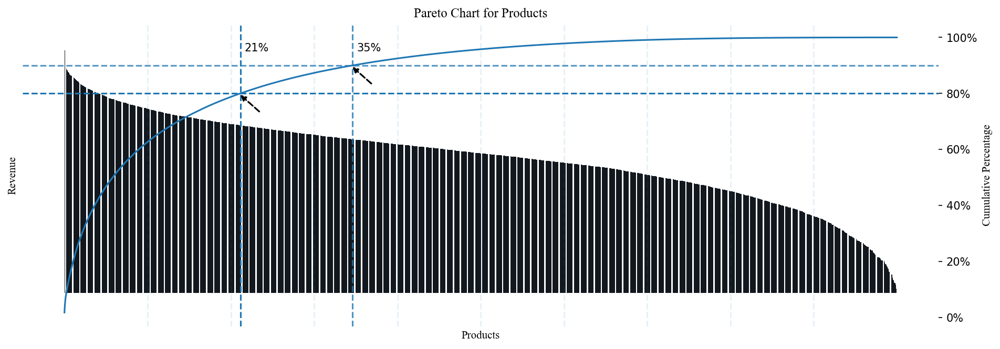

In [155]:
sns.reset_defaults()
create_pareto_plot(item_price, "StockCode", "Sales")


In [156]:
top_customers = customer_price[customer_price.CumulativePercentage <= 80].index.tolist()
products_for_top_customers = (
    retail[retail.CustomerID.isin(top_customers)]
    .Description.drop_duplicates()
    .values.tolist()
)
products_for_other_customers = (
    retail[~retail.CustomerID.isin(top_customers)]
    .Description.drop_duplicates()
    .values.tolist()
)


In [157]:
models_on_retail = retail.copy()


In [158]:
def rfm_process(models_on_retail):
    rfm = lifetimes.utils.summary_data_from_transaction_data(
        models_on_retail,
        customer_id_col="CustomerID",
        datetime_col="InvoiceDate",
        monetary_value_col="Sales",  # repeated_transactions.groupby(customer_id_col)[monetary_value_col].mean().fillna(0)
        observation_period_end=None,
        freq="D",
        freq_multiplier=1,
    )
    mon_val_of_zero = round(
        rfm[rfm["monetary_value"] == 0]["monetary_value"].count(), 2
    )
    percent_of_zero_rfm = round((mon_val_of_zero / len(rfm)) * 100, 2)
    # print(rfm.head(),'\n')

    if percent_of_zero_rfm > 0.05:
        rfm = rfm[rfm["monetary_value"] > 0]
    rfm
    print(rfm.head(), "\n")
    print(len(rfm), " repeat customers")
    print("\nmean\n", rfm.describe())

    return rfm


In [159]:
def mean_median_std(models_on_retail):
    retail_stats = pd.DataFrame(
        {
            "mean": round(rfm["monetary_value"].mean(), 2),
            "median": round(rfm["monetary_value"].median(), 2),
            "std": round(rfm["monetary_value"].std(), 2),
            "min": round(rfm["monetary_value"].min(), 2),
            "max": round(rfm["monetary_value"].max(), 2),
        },
        index=["monetary_value"],
    )
    print(retail_stats)
    return retail_stats


In [160]:
rfm = rfm_process(models_on_retail)
# rfm = pd.merge(rfm,Cohort_yr, on='CustomerID')
# rfm.to_csv('../data/processed/rfm#.csv')
# print('Data Processed')


            frequency  recency      T  monetary_value
CustomerID                                           
12346             2.0    322.0  647.0    38662.955000
12347             7.0    402.0  404.0      717.398571
12348             4.0    363.0  438.0      359.310000
12349             2.0    571.0  589.0     1305.085000
12352             8.0    356.0  392.0      198.223750 

4179  repeat customers

mean
          frequency      recency            T  monetary_value
count  4179.000000  4179.000000  4179.000000     4179.000000
mean      6.466380   383.422111   522.138550      449.762410
std      11.213986   227.259663   202.647019     2721.526636
min       1.000000     1.000000     9.000000        3.900000
25%       2.000000   176.000000   408.000000      190.765000
50%       3.000000   386.000000   589.000000      304.983333
75%       7.000000   590.000000   688.000000      449.782500
max     246.000000   738.000000   738.000000   168469.600000


In [161]:
rfm_stats = mean_median_std(rfm)


                  mean  median      std  min       max
monetary_value  449.76  304.98  2721.53  3.9  168469.6


In [162]:
def split(models_on_retail):
    train_test = lifetimes.utils.calibration_and_holdout_data(
        models_on_retail,
        "CustomerID",
        "InvoiceDate",
        calibration_period_end=training_end,
        observation_period_end=validation_end,
        monetary_value_col="Sales",
    )
    train_test = train_test[train_test["frequency_cal"] > 0]  # filter out negatives
    train_test.head()
    print(train_test.shape)
    return train_test


In [163]:
print("  SPLIT  ")
rfm_train_test = split(models_on_retail)


  SPLIT  
(3326, 7)


##### BGF Model fit # frequency, recency

In [164]:
## baseline model
bgf = lifetimes.BetaGeoFitter(penalizer_coef=0.1)  # <-regression hyperparameter
bgf.fit(
    rfm_train_test["frequency_cal"],
    rfm_train_test["recency_cal"],
    rfm_train_test["T_cal"],
)
# bgf.fit(train) .fit doesn't accept variable TypeError: fit() missing 2 required positional arguments:'recency'&T'
bgf.summary


,coef,se(coef),lower 95% bound,upper 95% bound
r,0.953217,0.020112,0.913798,0.992636
alpha,62.150577,1.859088,58.506764,65.794390
a,0.039959,0.004355,0.031424,0.048494
b,0.290665,0.025423,0.240836,0.340494


In [165]:
# BGF predict frequency
t = 184  # Calculate the expected number of repeat purchases up to time t
predicted_bgf = round(
    bgf.conditional_expected_number_of_purchases_up_to_time(
        t,
        rfm_train_test["frequency_cal"],
        rfm_train_test["recency_cal"],
        rfm_train_test["T_cal"],
    )
)


In [166]:
actual_freq = rfm_train_test["frequency_holdout"]
predicted_freq = predicted_bgf
baseline_penalizer_score = metrics.mean_absolute_error(actual_freq, predicted_freq)
print("MAE = ", round(baseline_penalizer_score, 5))


MAE =  1.24805


In [167]:
print("2011 Actual Average Frequency ", round(actual_freq.mean(), 4))
print("2011 Predicted Average Frequency ", round(predicted_freq.mean(), 4))


2011 Actual Average Frequency  2.1278
2011 Predicted Average Frequency  2.1894


In [168]:
print(
    "Average absolute error, ", metrics.mean_absolute_error(actual_freq, predicted_freq)
)


Average absolute error,  1.2480457005411907


##### Evaluate / tune hyperparameters for frequency

In [169]:
params = [0.0, 0.001, 0.1, 0.3683]
list_of_f = []
case = 0
for p in params:
    bgf = lifetimes.BetaGeoFitter(penalizer_coef=p)
    bgf.fit(
        rfm_train_test["frequency_cal"],
        rfm_train_test["recency_cal"],
        rfm_train_test["T_cal"],
    )
    predicted_bgf = round(
        bgf.conditional_expected_number_of_purchases_up_to_time(
            t,
            rfm_train_test["frequency_cal"],
            rfm_train_test["recency_cal"],
            rfm_train_test["T_cal"],
        )
    )
    predicted_freq = predicted_bgf
    f_df = pd.DataFrame(
        {
            "p": p,
            "2011_Actual_Avg_Frequency": round(actual_freq.mean(), 4),
            "2011_Predicted_Avg_Frequency": round(predicted_freq.mean(), 4),
            "Average absolute error": metrics.mean_absolute_error(
                actual_freq, predicted_freq
            ),
        },
        index=[p],
    )
    list_of_f.append(f_df)
    f_penalizer_df = pd.concat(list_of_f)
f_penalizer_df.transpose()


,0.0000,0.0010,0.1000,0.3683
p,0.00000,0.001000,0.100000,0.368300
2011_Actual_Avg_Frequency,2.12780,2.127800,2.127800,2.127800
2011_Predicted_Avg_Frequency,2.06860,2.077000,2.189400,2.244100
Average absolute error,1.23181,1.236019,1.248046,1.261876


In [170]:
f_best_penalizer_score = f_penalizer_df["Average absolute error"].min()
f_best_penalizer = f_penalizer_df["Average absolute error"].idxmin()
print("\nbest penalizer = ", f_best_penalizer)
print("best score ", f_best_penalizer_score)



best penalizer =  0.0
best score  1.2318099819603128


In [171]:
rfm_train_test["predicted_purchases_test"] = predicted_bgf
print(
    "Predicted purchases for test period ",
    rfm_train_test["predicted_purchases_test"].sum(),
)


Predicted purchases for test period  7464.0


##### Fit frequency Best Model

In [172]:
bgf = lifetimes.BetaGeoFitter(
    penalizer_coef=f_best_penalizer
)  # <-regression hyperparameter
bgf.fit(
    rfm_train_test["frequency_cal"],
    rfm_train_test["recency_cal"],
    rfm_train_test["T_cal"],
)
# bgf.fit(train) .fit doesn't accept variable TypeError: fit() missing 2 required positional arguments: 'recency' and 'T'
bgf.summary


,coef,se(coef),lower 95% bound,upper 95% bound
r,1.725011,0.055419,1.616389,1.833632
alpha,110.853268,3.976709,103.058919,118.647618
a,0.144695,0.017139,0.111103,0.178287
b,1.197161,0.187539,0.829585,1.564737


##### Predict frequency & recency with Best Model

In [173]:
t = 184
rfm_train_test["predicted_purchases"] = round(
    bgf.conditional_expected_number_of_purchases_up_to_time(
        t,
        rfm_train_test["frequency_cal"],
        rfm_train_test["recency_cal"],
        rfm_train_test["T_cal"],
    )
)


rfm_train_test["probability_alive"] = bgf.conditional_probability_alive(
    rfm_train_test["frequency_cal"],
    rfm_train_test["recency_cal"],
    rfm_train_test["T_cal"],
)


In [174]:
# print(rfm_actuals.sort_values(by='predicted_purchases').tail())
print(
    "Hold Out period Predicted Mean probability a customer is alive is ",
    round(rfm_train_test["probability_alive"].mean(), 2) * 100,
    "%",
)
print(
    "Hold Out period Predicted Mean predicted purchases",
    round(rfm_train_test["predicted_purchases"].mean(), 2),
)


Hold Out period Predicted Mean probability a customer is alive is  77.0 %
Hold Out period Predicted Mean predicted purchases 2.07


#### GAMMA-GAMMA MODEL

##### Fit Gamma-Gamma Model for Monetary Value

In [175]:
# confirm no correlation
print(rfm_train_test[["monetary_value_cal", "frequency_cal"]].corr())
# insert unit test
rfm_train_test = rfm_train_test[
    rfm_train_test["monetary_value_cal"] >= 1
]  # filter out negatives


                    monetary_value_cal  frequency_cal
monetary_value_cal            1.000000       0.084777
frequency_cal                 0.084777       1.000000


In [176]:
ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(penalizer_coef=0.0001)
ggf.fit(rfm_train_test["frequency_cal"], rfm_train_test["monetary_value_cal"])
# p: shape parameter of 1st distro, q: shape parameter of 2nd distro, r: rate parameter of distro
# Gamma(p, v) defines the distribution of a customerâ€™s observed average transaction value


<lifetimes.GammaGammaFitter: fitted with 3326 subjects, p: 18.19, q: 1.74, v: 21.64>

In [177]:
ggf.params_


p    18.187126
q     1.736508
v    21.638566
dtype: float64

In [178]:
# print(len(ggf.data),' rows')


##### PREDICT Gamma-Gamma Model for Monetary Value

In [179]:
monetary_pred = ggf.conditional_expected_average_profit(
    rfm_train_test["frequency_holdout"], rfm_train_test["monetary_value_holdout"]
)
test_m = rfm_train_test["monetary_value_holdout"]


In [180]:
test_m.info()


<class 'pandas.core.series.Series'>
Index: 3326 entries, 12346 to 18287
Series name: monetary_value_holdout
Non-Null Count  Dtype  
--------------  -----  
3326 non-null   float64
dtypes: float64(1)
memory usage: 39.0 KB


##### Evaluate & tune parameters for Gamma-Gamma Model prediction

In [181]:
params = [0.0, 0.0001, 0.001, 0.005, 0.01, 0.5, 1]
list_of_m = []
case = 0
for p in params:
    ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(penalizer_coef=p)
    ggf.fit(rfm_train_test["frequency_cal"], rfm_train_test["monetary_value_cal"])

    predicted_m = ggf.conditional_expected_average_profit(
        rfm_train_test["frequency_holdout"], rfm_train_test["monetary_value_holdout"]
    )


In [182]:
    case +=1
    m_df = pd.DataFrame({'p'                               : p,
                        # '2011_Actual_Monetary_Value'   : round(rfm_train_test['monetary_value_holdout'].mean(),4),
                        # '2011_Predicted_Monetary_Value': round(predicted_m,4),
                        'Average absolute error'           : metrics.mean_absolute_error(rfm_train_test['monetary_value_holdout'], predicted_m)
                      },index=[p])

In [183]:
list_of_m.append(m_df)
m_penalizer_df = pd.concat(list_of_m)
print(m_penalizer_df.transpose())
m_best_penalizer_score = m_penalizer_df["Average absolute error"].min()

m_best_penalizer = m_penalizer_df["Average absolute error"].idxmin()

print("\nbest penalizer = ", m_best_penalizer)
print("best score ", m_best_penalizer_score)


                                1
p                        1.000000
Average absolute error  69.660606

best penalizer =  1
best score  69.66060595201719


##### Fit gamma-gamma best model to train_test

In [184]:
ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(
    penalizer_coef=m_best_penalizer
)
ggf.fit(rfm_train_test["frequency_cal"], rfm_train_test["monetary_value_cal"])

best_monetary_pred = ggf.conditional_expected_average_profit(
    rfm_train_test["frequency_holdout"], rfm_train_test["monetary_value_holdout"]
)

rfm_train_test["predicted_avg_order_value"] = best_monetary_pred


##### Evaluate best models against holdout year

In [185]:
rfm_train_test["predicted_test_sales_revenue"] = (
    rfm_train_test["predicted_avg_order_value"]
    * rfm_train_test["predicted_purchases_test"]
) / rfm_train_test["probability_alive"]

print(
    "Predicted avg order value for test period ",
    rfm_train_test["predicted_avg_order_value"].mean(),
)
print(
    "Predicted purchases for test period ",
    rfm_train_test["predicted_purchases_test"].sum(),
)
print(
    "\nPredicted test sales revenue",
    rfm_train_test["predicted_test_sales_revenue"].sum(),
)


Predicted avg order value for test period  35.952245229167644
Predicted purchases for test period  7464.0

Predicted test sales revenue 560018.7587650369


##### Fit monetary_value Best Model

In [186]:
rfm = rfm.loc[rfm["monetary_value"] > 0]

ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(
    penalizer_coef=m_best_penalizer
)
ggf.fit(rfm["frequency"], rfm["monetary_value"])


print("\n")
print(ggf.params_)
print(len(ggf.data), " rows")




p    0.313775
q    0.115794
v    0.240181
dtype: float64
4179  rows


In [187]:
ggf


<lifetimes.GammaGammaFitter: fitted with 4179 subjects, p: 0.31, q: 0.12, v: 0.24>

In [188]:
print(rfm[rfm["monetary_value"] <= 0])


Empty DataFrame
Columns: [frequency, recency, T, monetary_value]
Index: []


In [189]:
# Predict M
returning_customers = rfm[rfm["frequency"] > 0]
print("Number of returning customers ", len(returning_customers))


Number of returning customers  4179


In [190]:
ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(
    penalizer_coef=m_best_penalizer
)
ggf.fit(rfm["frequency"], rfm["monetary_value"])
returning_customers["predicted_m"] = ggf.conditional_expected_average_profit(
    returning_customers["frequency"], returning_customers["monetary_value"]
)
returning_customers.head()


,frequency,recency,T,monetary_value,predicted_m
CustomerID,,,,,
12346,2.0,322.0,647.0,38662.955000,-94534.779301
12347,7.0,402.0,404.0,717.398571,1200.858027
12348,4.0,363.0,438.0,359.310000,1216.106378
12349,2.0,571.0,589.0,1305.085000,-3191.346650
12352,8.0,356.0,392.0,198.223750,306.063199


#### CLV MODEL

In [191]:
clv = ggf.customer_lifetime_value(
    bgf,
    rfm_train_test["frequency_cal"],
    rfm_train_test["recency_cal"],
    rfm_train_test["T_cal"],
    rfm_train_test["monetary_value_cal"],
    time=12.262,  # time in months
    discount_rate=0.01,
)
rfm_train_test["lifetime_sales"] = clv
rfm_train_test.head()


,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,predicted_purchases_test,predicted_purchases,probability_alive,predicted_avg_order_value,predicted_test_sales_revenue,lifetime_sales
CustomerID,,,,,,,,,,,,,
12346,2.0,322.0,463.0,38662.955000,0.0,0.000000,184.0,1.0,1.0,0.841567,-0.085811,-0.101966,-178211.305884
12347,3.0,158.0,220.0,845.073333,4.0,25.373163,184.0,2.0,2.0,0.892344,84.173824,188.657862,59830.157801
12348,3.0,190.0,254.0,389.080000,1.0,135.000000,184.0,2.0,2.0,0.898809,-75.493617,-167.985815,25298.782425
12349,1.0,182.0,405.0,1152.620000,1.0,20.243750,184.0,0.0,1.0,0.638836,-11.434209,-0.000000,-730.444251
12352,5.0,130.0,208.0,168.312000,3.0,16.914318,184.0,4.0,3.0,0.844826,244.407251,1157.195544,2323.336403


In [192]:
print("lifetime Sales ", round(rfm_train_test["lifetime_sales"].sum()))
# need to evalauate CLV


lifetime Sales  13654958


In [193]:
# Retraining The Model - Iteration 2


In [194]:
# RFM
rfm_actuals = rfm
rfm = rfm.loc[rfm.frequency > 0, :]

# print('MONETARY VALUE < 0 \n ',rfm[rfm['monetary_value']<0])
rfm = rfm.loc[
    rfm.monetary_value > 0, :
]  # model is sensitive to negative monetary values

# BG/NBD
bgf = lifetimes.BetaGeoFitter(penalizer_coef=f_best_penalizer)
bgf.fit(rfm["frequency"], rfm["recency"], rfm["T"])
rfm["probability_alive"] = bgf.conditional_probability_alive(
    frequency=rfm["frequency"], recency=rfm["recency"], T=rfm["T"]
)
rfm["predicted_purchases"] = bgf.conditional_expected_number_of_purchases_up_to_time(
    t=184, frequency=rfm["frequency"], recency=rfm["recency"], T=rfm["T"]
)

# GG
ggf = lifetimes.fitters.gamma_gamma_fitter.GammaGammaFitter(
    penalizer_coef=m_best_penalizer
)
ggf.fit(rfm["frequency"], rfm["monetary_value"])

# CLV model
rfm["exp_avg_order_value"] = ggf.conditional_expected_average_profit(
    rfm["frequency"], rfm["monetary_value"]
)
clv = ggf.customer_lifetime_value(
    bgf,  # the model to use to predict the number of future transactions
    rfm["frequency"],
    rfm["recency"],
    rfm["T"],
    rfm["monetary_value"],
    time=1,  # months
    freq="D",
    discount_rate=0.01,  # monthly discount rate ~ 12.7% annually
)

rfm["predicted_next_year_sales"] = (
    rfm["predicted_purchases"] * rfm["exp_avg_order_value"]
)  # /( 1- rfm['prob_alive'] )
rfm["CLTSales"] = clv
rfm["CLTV"] = clv * profit_margin

rfm["CLTSales"].mean()


302.18369131691423

In [195]:
rfm.rename(
    columns={
        "prob_alive": "probability_alive",
        "pred_purchases": "predicted_purchases",
    },
    inplace=True,
)


In [196]:
def grab_cohorts(models_on_retail, column_name):
    cohort = (
        pd.DataFrame(models_on_retail)
        .groupby("CustomerID")[column_name]
        .min()
        .reset_index()
    )
    return cohort


In [197]:
cohort = grab_cohorts(models_on_retail, "InvoiceYear")
cohort.columns = ["CustomerID", "CohortYear"]
Cohort_yr = cohort
rfm = pd.merge(
    rfm, Cohort_yr, on="CustomerID"
)  # toggle between models_on_retail and salescsv


In [198]:
round(rfm.describe(), 2)


,CustomerID,frequency,recency,T,monetary_value,probability_alive,predicted_purchases,exp_avg_order_value,predicted_next_year_sales,CLTSales,CLTV,CohortYear
count,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00
mean,15307.49,6.47,383.42,522.14,449.76,0.81,2.07,834.48,1843.14,302.18,78.57,2009.98
std,1697.82,11.21,227.26,202.65,2721.53,0.25,2.62,3333.39,6052.37,996.39,259.06,0.63
min,12346.00,1.00,1.00,9.00,3.90,0.00,0.00,-94534.78,-122453.86,-20405.13,-5305.33,2009.00
25%,13840.00,2.00,176.00,408.00,190.76,0.77,0.73,-160.11,-95.54,-15.81,-4.11,2010.00
50%,15299.00,3.00,386.00,589.00,304.98,0.93,1.45,372.78,807.14,132.36,34.41,2010.00
75%,16775.50,7.00,590.00,688.00,449.78,0.97,2.59,880.35,2112.01,344.90,89.67,2010.00
max,18287.00,246.00,738.00,738.00,168469.60,1.00,53.43,64418.97,139765.97,22766.51,5919.29,2011.00


In [199]:
rfm["predicted_next_year_sales"].sum()


7702486.039727995

In [200]:
def thresh_prediction(rfm, thresh):
    alive_prediction = pd.DataFrame(
        rfm[rfm["probability_alive"] > thresh]
        .groupby("CohortYear")["probability_alive"]
        .sum()
    )
    purchase_prediction = pd.DataFrame(
        rfm[rfm["probability_alive"] > thresh]
        .groupby("CohortYear")["predicted_purchases"]
        .mean()
    )  # groupby('CohortYear')
    alive_purchasing_prediction = pd.concat(
        [alive_prediction, purchase_prediction], axis=1
    )
    alive_purchasing_prediction.columns = [
        "predicted customer count",
        "predicted avg. number of purchases",
    ]
    return alive_purchasing_prediction


In [201]:
alive_purchasing_prediction = thresh_prediction(rfm, thresh=0.6)
print(alive_purchasing_prediction)
alive_purchasing_prediction.to_csv("alive_purchasing_prediction.csv")


            predicted customer count  predicted avg. number of purchases
CohortYear                                                              
2009                      693.360227                            3.591710
2010                     1780.267326                            1.904795
2011                      669.757881                            2.774996


In [202]:
print("Predicted Purchases ", round(rfm["predicted_purchases"].sum(), 2))
print("Predicted next year sales ", round(rfm["predicted_next_year_sales"].sum(), 2))
cohort_prediction = (
    rfm.groupby("CohortYear")["predicted_next_year_sales"].sum().reset_index()
)
cohort_prediction.columns = ["CohortYear", "P2012"]
cohort_prediction["percent_of_next_year_sales"] = (
    cohort_prediction["P2012"] / rfm["predicted_next_year_sales"].sum()
) * 100
cohort_prediction.to_csv("cohort_predictions.csv")
print(round(cohort_prediction))


Predicted Purchases  8661.72
Predicted next year sales  7702486.04
   CohortYear      P2012  percent_of_next_year_sales
0        2009  2322148.0                        30.0
1        2010  3790896.0                        49.0
2        2011  1589441.0                        21.0


In [203]:
print("CLT Sales 12 months", rfm["CLTSales"].sum())


CLT Sales 12 months 1262825.6460133847


In [204]:
round(rfm[rfm["probability_alive"] > 0.6].count())


CustomerID                   3422
frequency                    3422
recency                      3422
T                            3422
monetary_value               3422
probability_alive            3422
predicted_purchases          3422
exp_avg_order_value          3422
predicted_next_year_sales    3422
CLTSales                     3422
CLTV                         3422
CohortYear                   3422
dtype: int64

In [205]:
print("CLTV ", round(rfm["CLTV"].sum(), 2))


CLTV  328334.67


##### prediction_cohort_analysis

In [206]:
cust_count_pred = rfm.groupby("CohortYear")["probability_alive"].value_counts(bins=3)
# cust_count_pred =  cust_count_pred.reset_index()
cust_count_pred.columns = ["CohortYear", "probability_alive", "CustomerCount"]
# cust_count_pred
cust_count_pred.unstack(level=1)


probability_alive,"(-0.001999, 0.333]","(-0.00199, 0.333]","(0.15, 0.433]","(0.333, 0.665]","(0.333, 0.666]","(0.433, 0.714]","(0.665, 0.998]","(0.666, 0.999]","(0.714, 0.996]"
CohortYear,,,,,,,,,
2009,83.0,NaN,NaN,NaN,69.0,NaN,NaN,714.0,NaN
2010,NaN,299.0,NaN,341.0,NaN,NaN,1876.0,NaN,NaN
2011,NaN,NaN,14.0,NaN,NaN,75.0,NaN,NaN,708.0


In [207]:
cust_prediction_purchases = rfm.groupby("CohortYear")[
    "predicted_purchases"
].value_counts(bins=3)
# cust_prediction_purchases = cust_prediction_purchases.reset_index()
cust_prediction_purchases.columns = [
    "CohortYear",
    "probability_of_purchase",
    "number_of_purchases",
]
# cust_prediction_purchases
cust_prediction_purchases.unstack(level=1)


predicted_purchases,"(-0.054400000000000004, 17.809]","(-0.021400000000000002, 6.799]","(0.268, 5.165]","(5.165, 10.047]","(6.799, 13.597]","(10.047, 14.929]","(13.597, 20.396]","(17.809, 35.617]","(35.617, 53.426]"
CohortYear,,,,,,,,,
2009,852.0,NaN,NaN,NaN,NaN,NaN,NaN,9.0,5.0
2010,NaN,2476.0,NaN,NaN,38.0,NaN,2.0,NaN,NaN
2011,NaN,NaN,739.0,52.0,NaN,6.0,NaN,NaN,NaN


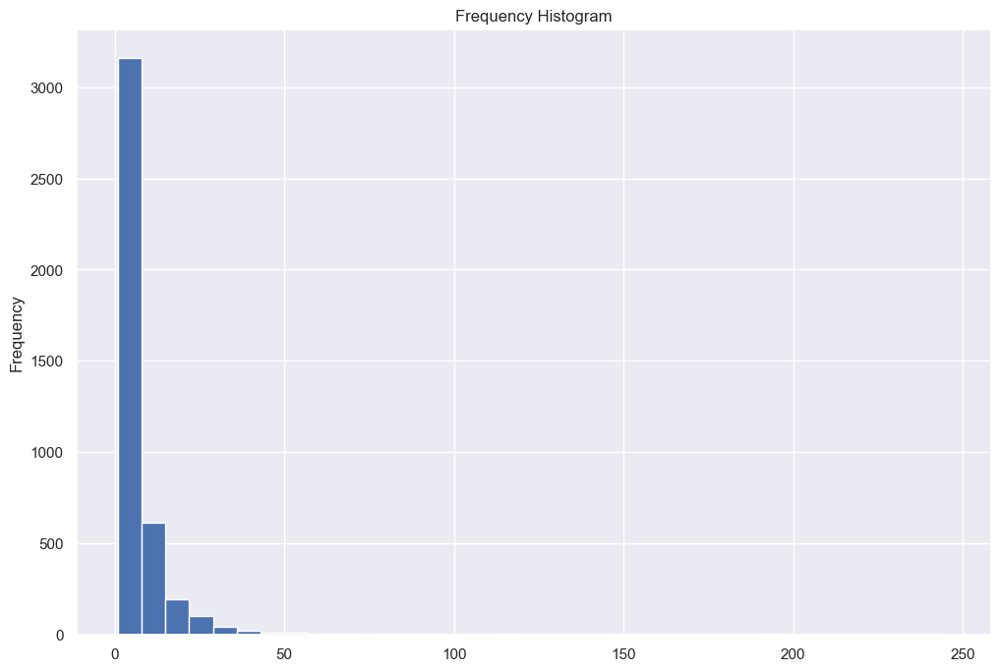

In [208]:
sns.set()
fig = plt.figure(figsize=(12, 8))
rfm["frequency"].plot(
    kind="hist", bins=35, title="Frequency Histogram"
)  # add labels etc.
plt.show()


In [208]:
plt.style.use('seaborn-v0_8-pastel')
plt.rcParams.update({'font.size': 10})
plt.rcParams["axes.grid"] = 1
mpl.rcParams['lines.linewidth'] = 2
%matplotlib inline
sns.set_theme(style="ticks", palette="pastel")
sns.set_context("poster")
sns.set(rc={'image.cmap': 'coolwarm'})

<Axes: title={'center': 'Expected Number of Future Purchases for 1 Unit of Time,\nby Frequency and Recency of a Customer'}, xlabel="Customer's Historical Frequency", ylabel="Customer's Recency">

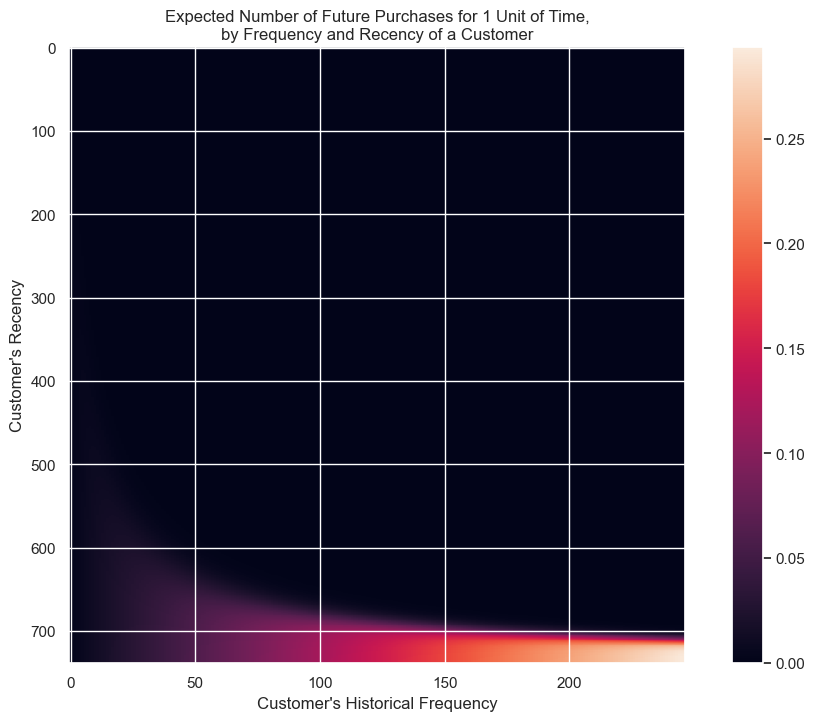

In [209]:
sns.set()
fig = plt.subplots(figsize=(12, 8))
plot_frequency_recency_matrix(bgf)


<Axes: title={'center': 'Probability Customer is Alive,\nby Frequency and Recency of a Customer'}, xlabel="Customer's Historical Frequency", ylabel="Customer's Recency">

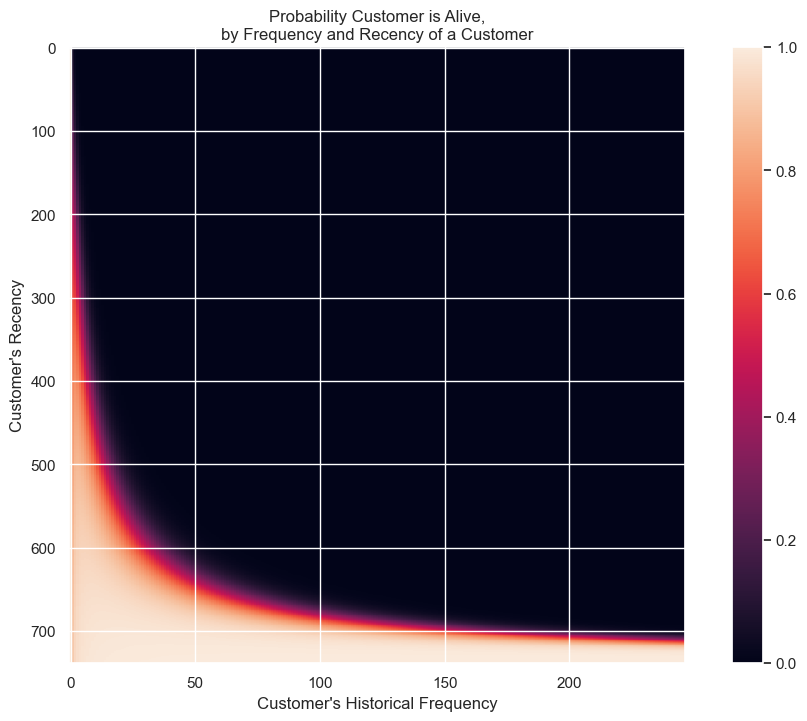

In [210]:
sns.set()
fig = plt.figure(figsize=(12, 8))
plot_probability_alive_matrix(bgf)


In [211]:
n_orders = retail.groupby(["CustomerID"])["InvoiceNo"].nunique()
mult_orders_perc = np.sum(n_orders > 1) / retail["CustomerID"].nunique()
print(n_orders.count(), "count of unique orders \n\n")
print(f"{100* mult_orders_perc:.2f}% of customers ordered more than once \n")


8773 count of unique orders 


48.26% of customers ordered more than once 



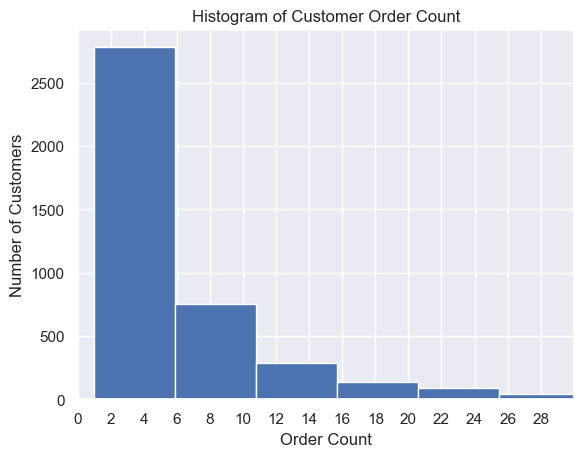

In [212]:
# HISTOGRAM
sns.set()
fig, ax = plt.subplots()
ax.hist(x=rfm["frequency"], bins=50)
ax.set_title("Histogram of Customer Order Count")
ax.set_ylabel("Number of Customers")
ax.set_xlabel("Order Count")
ax.set_xlim([0, 30])
ax.set_xticks(np.arange(0, 30, 2))

# for p in ax.patches:
#     width = p.get_width()
#     height = p.get_height()
#     x, y = p.get_xy()
#     ax.annotate(f'{height:.0%}', (x + width/2, y + height*1.02), ha='center')
plt.show()
#plt.savefig("frequency_histogram_eda.png")


In [213]:
print(rfm["frequency"].quantile([0.35, 0.60, 0.75, 0.90]))


0.35     2.0
0.60     4.0
0.75     7.0
0.90    14.0
Name: frequency, dtype: float64


<Axes: title={'center': 'Frequency of Repeat Transactions'}, xlabel='Number of Calibration Period Transactions', ylabel='Customers'>

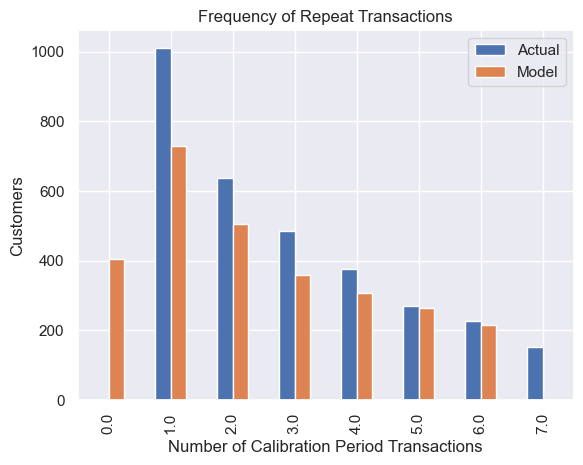

In [214]:
sns.set()
plot_period_transactions(bgf)


####  Model Inference from Calibration Period Transactions:
##### 0th -- 600 customers from training set won't render business
##### 7th -- were used as test set  

In [215]:
evaluation = pd.DataFrame(
    {
        "t": t,
        "2011_Actual_Avg_Frequency": round(actual_freq.mean(), 4),
        "2011_Predicted_Avg_Frequency": round(predicted_freq.mean(), 4),
        "Average absolute error": metrics.mean_absolute_error(
            actual_freq, predicted_freq
        ),
    },
    index=["bgf"],
)
evaluation.transpose()


,bgf
t,184.000000
2011_Actual_Avg_Frequency,2.127800
2011_Predicted_Avg_Frequency,2.244100
Average absolute error,1.261876


In [216]:
rfm_train_test["monetary_value_cal"].describe()


count     3326.000000
mean       423.382804
std        877.176473
min          7.900000
25%        197.005500
50%        307.290000
75%        460.761346
max      38662.955000
Name: monetary_value_cal, dtype: float64

<Axes: title={'center': 'Actual Purchases in Holdout Period vs Predicted Purchases'}, xlabel='Purchases in calibration period', ylabel='Average of Purchases in Holdout Period'>

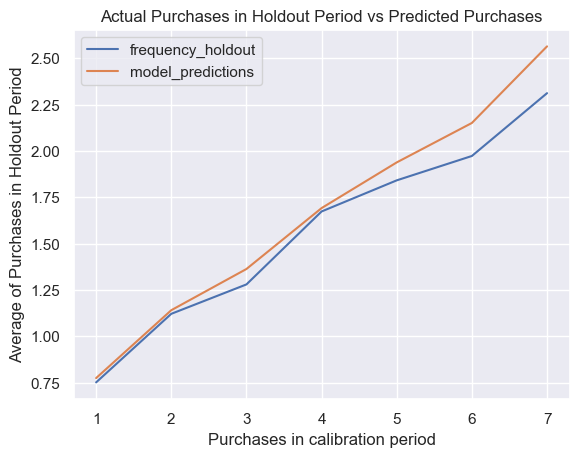

In [217]:
sns.set()
bgf.fit(
    rfm_train_test["frequency_cal"],
    rfm_train_test["recency_cal"],
    rfm_train_test["T_cal"],
)
plot_calibration_purchases_vs_holdout_purchases(bgf, rfm_train_test)


In [218]:
rfm_train_test.loc[18283]


frequency_cal                      9.000000
recency_cal                      458.000000
T_cal                            474.000000
monetary_value_cal               119.280000
frequency_holdout                  9.000000
monetary_value_holdout             2.974818
duration_holdout                 184.000000
predicted_purchases_test           3.000000
predicted_purchases                3.000000
probability_alive                  0.979256
predicted_avg_order_value          4.350886
predicted_test_sales_revenue      13.329162
lifetime_sales                  1087.077878
Name: 18283, dtype: float64

In [219]:
"""
#import seaborn as sns
sns.set_palette("husl")
sns.set(rc={'image.cmap': 'coolwarm'})
%matplotlib inline
"""


'\n#import seaborn as sns\nsns.set_palette("husl")\nsns.set(rc={\'image.cmap\': \'coolwarm\'})\n%matplotlib inline\n'

In [220]:
retail.loc[retail["CustomerID"] == 18283].sort_values(
    by="InvoiceDate", ascending=True
).head()


,index,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
93762,93211,18283,2010-02-19,1,1.25,1.25,Invoice,498547,21875,2010,2,kings choice mug,United Kingdom
93822,93173,18283,2010-02-19,2,1.25,2.50,Invoice,498547,20972,2010,2,pink cream felt craft trinket box,United Kingdom
93823,93199,18283,2010-02-19,2,1.65,3.30,Invoice,498547,22069,2010,2,brown pirate treasure chest,United Kingdom
93824,93174,18283,2010-02-19,1,1.65,1.65,Invoice,498547,20727,2010,2,lunch bag black skull.,United Kingdom
93826,93197,18283,2010-02-19,1,2.10,2.10,Invoice,498547,21175,2010,2,gin + tonic diet metal sign,United Kingdom


TypeError: datetime64 type does not support sum operations

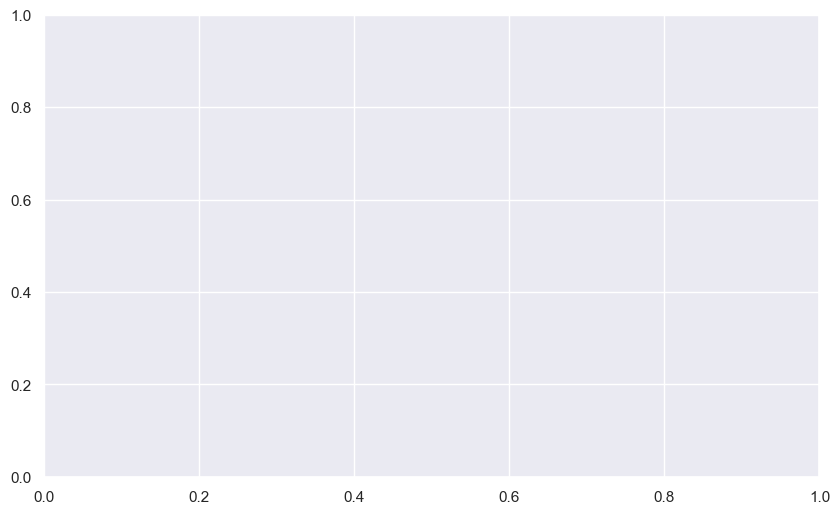

In [386]:
from lifetimes.plotting import plot_history_alive
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Set the style for seaborn
sns.set()

# Define customer ID and days since birth
customer_id = 18283
days_since_birth = 334

# Assuming 'retail' is your DataFrame
# Ensure InvoiceDate is in datetime format
retail['InvoiceDate'] = pd.to_datetime(retail['InvoiceDate'])

# Filter the retail DataFrame for the specific customer
sp_trans = retail.loc[retail["CustomerID"] == customer_id]

# Check if there's any transaction for the specified customer
if sp_trans.empty:
    raise ValueError(f"No transactions found for Customer ID: {customer_id}")

# Add a transactions column to count occurrences
sp_trans['transactions'] = 1

# Setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Use 'InvoiceDate' and resample for 'transactions'
# Ensure to group by the 'InvoiceDate' to get the right format
sp_trans.set_index('InvoiceDate', inplace=True)
sp_trans_resampled = sp_trans['transactions'].resample('D').sum().reset_index()

# Plot the history alive for the filtered transaction data
plot_history_alive(bgf, days_since_birth, sp_trans_resampled, "InvoiceDate", ax=ax)

# Show the plot
plt.show()


In [223]:
returning_customers_summary = rfm_train_test[rfm_train_test["frequency_cal"] > 0]
returning_customers_summary.head(10)


,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,predicted_purchases_test,predicted_purchases,probability_alive,predicted_avg_order_value,predicted_test_sales_revenue,lifetime_sales
CustomerID,,,,,,,,,,,,,
12346,2.0,322.0,463.0,38662.955000,0.0,0.000000,184.0,1.0,1.0,0.841567,-0.085811,-0.101966,-178211.305884
12347,3.0,158.0,220.0,845.073333,4.0,25.373163,184.0,2.0,2.0,0.892344,84.173824,188.657862,59830.157801
12348,3.0,190.0,254.0,389.080000,1.0,135.000000,184.0,2.0,2.0,0.898809,-75.493617,-167.985815,25298.782425
12349,1.0,182.0,405.0,1152.620000,1.0,20.243750,184.0,0.0,1.0,0.638836,-11.434209,-0.000000,-730.444251
12352,5.0,130.0,208.0,168.312000,3.0,16.914318,184.0,4.0,3.0,0.844826,244.407251,1157.195544,2323.336403
12353,1.0,204.0,224.0,89.000000,0.0,0.000000,184.0,1.0,1.0,0.874929,-0.085811,-0.098078,-116.411024
12355,1.0,353.0,383.0,459.400000,0.0,0.000000,184.0,1.0,1.0,0.874605,-0.085811,-0.098114,-415.546985
12356,4.0,179.0,240.0,1189.222500,1.0,29.175000,184.0,3.0,3.0,0.906709,-16.419825,-54.327771,20190.170373
12358,2.0,356.0,547.0,544.590000,2.0,54.591765,184.0,1.0,1.0,0.808878,-138.264561,-170.933702,-2116.917794


In [224]:
print(len(returning_customers_summary))


3326


In [225]:
print(returning_customers_summary["predicted_purchases"].mean())


2.0685508117859293


In [226]:
returning_customers_summary[["monetary_value_cal", "frequency_cal"]].corr()


,monetary_value_cal,frequency_cal
monetary_value_cal,1.000000,0.084777
frequency_cal,0.084777,1.000000


In [227]:
est_avg_val = ggf.conditional_expected_average_profit(
    rfm_train_test["frequency_holdout"], rfm_train_test["monetary_value_holdout"]
)
est_avg_val.head(18)


CustomerID
12346     -0.085232
12347     86.065847
12348    -74.390967
12349    -11.267505
12352    280.073413
12353     -0.085232
12355     -0.085232
12356    -16.180278
12358   -133.775525
12359    -15.203126
12360    -41.397420
12361     -0.085232
12362     29.492253
12369     -0.085232
12370    -14.655418
12371    -13.688215
12372    -16.318711
12373     -0.085232
dtype: float64

In [228]:
est_avg_val.describe()


count    3326.000000
mean       42.117097
std       302.809655
min     -3943.738165
25%        -9.978218
50%        -0.085232
75%        17.725435
max      8713.659738
dtype: float64

In [229]:
actual_m = rfm_train_test["monetary_value_holdout"]
predicted_m = est_avg_val
print("2011 Actual Average Frequency ", round(actual_m.mean(), 4))
print("2011 Predicted Average Frequency ", round(predicted_m.mean(), 4))
print("Average absolute error, ", metrics.mean_absolute_error(actual_m, predicted_m))


2011 Actual Average Frequency  21.2091
2011 Predicted Average Frequency  42.1171
Average absolute error,  74.93381426937236


In [230]:
evaluation = pd.DataFrame(
    {
        "Model": ["bgf"],
        "t": t,
        "2011_Actual_Avg_Frequency": round(actual_freq.mean(), 4),
        "2011_Predicted_Avg_Frequency": round(predicted_freq.mean(), 4),
        "Average absolute error": metrics.mean_absolute_error(
            actual_freq, predicted_freq
        ),
    },
    index=["1"],
)
evaluation


,Model,t,2011_Actual_Avg_Frequency,2011_Predicted_Avg_Frequency,Average absolute error
1,bgf,184,2.1278,2.2441,1.261876


In [231]:
print(
    "Expected conditional average profit: %s, Average profit: %s"
    % (
        ggf.conditional_expected_average_profit(
            rfm_train_test["frequency_holdout"],
            rfm_train_test["monetary_value_holdout"],
        ).mean(),
        rfm_train_test[rfm_train_test["frequency_holdout"] > 0][
            "monetary_value_holdout"
        ].mean(),
    )
)


Expected conditional average profit: 42.11709651208826, Average profit: 32.94788274985525


In [232]:
clv.mean()


302.18369131691423

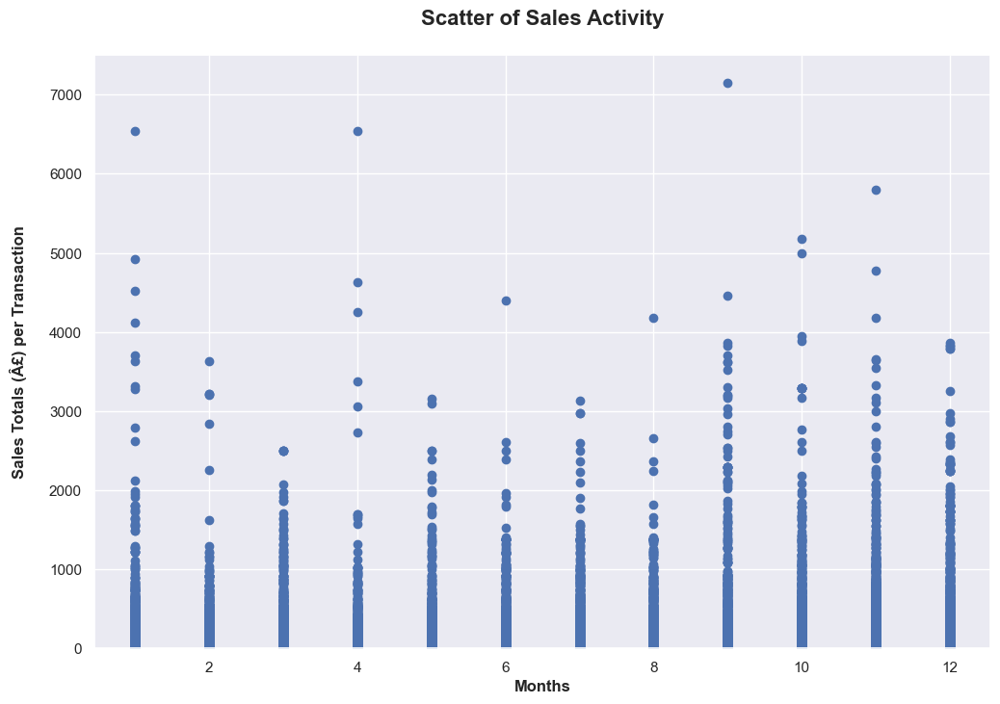

In [233]:
# Scatter plot of Activity by Month
sns.set()
fig, ax = plt.subplots(figsize=(12, 8))
plt.scatter(
    x=retail["InvoiceMonth"], y=retail["Sales"]
)  # need to show months chronologically
ax.set_xlabel("Months", fontsize=12, fontweight="bold")
ax.set_ylabel("Sales Totals (Â£) per Transaction\n", fontsize=12, fontweight="bold")
ax.set_title("Scatter of Sales Activity\n", fontsize=16, fontweight="bold")
ax.set_ylim(0, 7500)
plt.show()
#plt.savefig("seasonality_eda.png")


In [234]:

    #Cohort
    df_retail = retail[['CustomerID', 'InvoiceNo', 'InvoiceYear']].drop_duplicates()
    # df['order_month'] = df['Date'].to_period('')
    df_retail['cohort'] = df_retail.groupby('CustomerID')['InvoiceYear'].transform('min')

    df_cohort = df_retail.groupby(['cohort', 'InvoiceYear']).agg(n_customers=('CustomerID', 'nunique')).reset_index(drop=False)
    df_cohort['period_number'] = (df_cohort.InvoiceYear - df_cohort.cohort)

    cohort_pivot = df_cohort.pivot_table(index = 'cohort',
                                        columns = 'period_number',
                                        values = 'n_customers')

    cohort_size = cohort_pivot.iloc[:,0]
    cohort_size.columns = ['CohortYear','unique customers per cohort']

    retention_matrix = cohort_pivot.divide(cohort_size, axis=0) 
    print('cohort_size', cohort_size,'\n\n')

cohort_size cohort
2009    1120.0
2010    4902.0
2011    2751.0
Name: 0, dtype: float64 




In [235]:
print("retention_matrix\n", retention_matrix, "\n\n")


retention_matrix
 period_number    0         1         2
cohort                                
2009           1.0  0.750893  0.628571
2010           1.0  0.402489       NaN
2011           1.0       NaN       NaN 




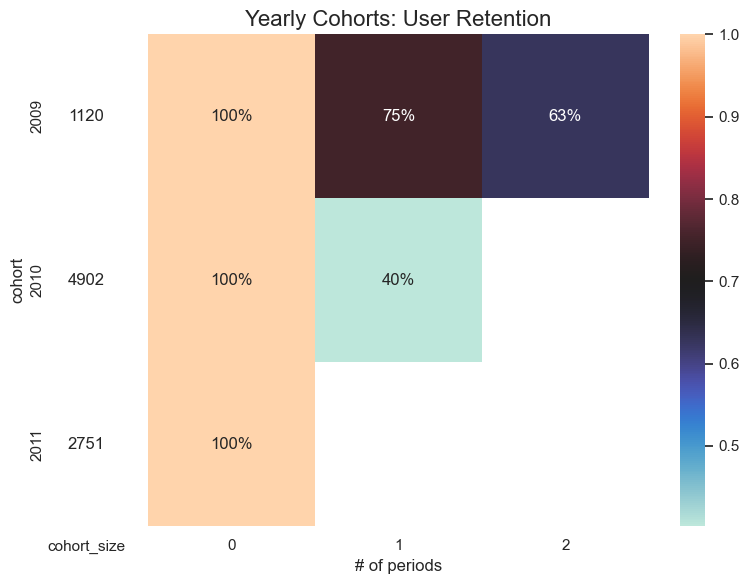

In [237]:
sns.set()
with sns.axes_style("white"):
    fig, ax = plt.subplots(
        1, 2, figsize=(8, 6), sharey=True, gridspec_kw={"width_ratios": [1, 11]}
    )

    # retention matrix
    sns.heatmap(
        retention_matrix,
        mask=retention_matrix.isnull(),
        annot=True,
        fmt=".0%",
        cmap="icefire",
        ax=ax[1],
    )
    ax[1].set_title("Yearly Cohorts: User Retention", fontsize=16)
    ax[1].set(xlabel="# of periods", ylabel="")

    # cohort size
    cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: "cohort_size"})
    white_cmap = mcolors.ListedColormap(["White"])
    sns.heatmap(
        cohort_size_df, annot=True, cbar=False, fmt="g", cmap=white_cmap, ax=ax[0]
    )
    fig.tight_layout()
    plt.show()
    #plt.savefig("cohort_retention.png")


In [238]:
print("\n 10 Best Customers\n")
rfm_train_test.sort_values(by="predicted_purchases", ascending=False).head(
    10
).reset_index()



 10 Best Customers



,CustomerID,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,predicted_purchases_test,predicted_purchases,probability_alive,predicted_avg_order_value,predicted_test_sales_revenue,lifetime_sales
0,14911,164.0,554.0,554.0,1080.331768,82.0,24.976253,184.0,51.0,45.0,0.999120,25.859469,1319.995107,96193.485631
1,15311,149.0,553.0,554.0,594.707047,46.0,24.427995,184.0,46.0,41.0,0.998785,26.011659,1197.992281,48227.867091
2,14606,134.0,551.0,552.0,188.832239,42.0,3.965319,184.0,42.0,37.0,0.998678,4.253733,178.893244,13857.858321
3,12748,126.0,551.0,551.0,231.657619,69.0,7.198370,184.0,39.0,35.0,0.998855,7.505476,293.049191,16046.450126
4,17841,126.0,553.0,553.0,330.723175,66.0,5.118678,184.0,39.0,35.0,0.998855,5.348517,208.831338,22841.532741
5,13089,101.0,552.0,553.0,862.127228,30.0,33.672310,184.0,31.0,28.0,0.998333,37.135647,1153.126794,48132.212726
6,14527,91.0,553.0,553.0,240.288681,28.0,9.211285,184.0,28.0,25.0,0.998416,10.240773,287.196590,12148.167619
7,14156,88.0,552.0,554.0,2619.290341,28.0,86.968937,184.0,27.0,24.0,0.997855,96.608702,2614.042526,128015.406945
8,13798,74.0,545.0,547.0,824.334324,24.0,96.323020,184.0,23.0,21.0,0.997550,109.012024,2513.434025,34555.904448
9,16422,67.0,511.0,512.0,709.692090,22.0,93.850915,184.0,22.0,20.0,0.997601,107.501850,2370.727909,28586.641888


In [239]:
print("\n\nTop 5 customers that the model expects to make a purchase in next month\n")
print("Predicted Purchase mean :", rfm_train_test["predicted_purchases"].mean())
rfm_train_test.sort_values(by="predicted_purchases").tail(5)




Top 5 customers that the model expects to make a purchase in next month

Predicted Purchase mean : 2.0685508117859293


,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,predicted_purchases_test,predicted_purchases,probability_alive,predicted_avg_order_value,predicted_test_sales_revenue,lifetime_sales
CustomerID,,,,,,,,,,,,,
12748,126.0,551.0,551.0,231.657619,69.0,7.198370,184.0,39.0,35.0,0.998855,7.505476,293.049191,16046.450126
17841,126.0,553.0,553.0,330.723175,66.0,5.118678,184.0,39.0,35.0,0.998855,5.348517,208.831338,22841.532741
14606,134.0,551.0,552.0,188.832239,42.0,3.965319,184.0,42.0,37.0,0.998678,4.253733,178.893244,13857.858321
15311,149.0,553.0,554.0,594.707047,46.0,24.427995,184.0,46.0,41.0,0.998785,26.011659,1197.992281,48227.867091
14911,164.0,554.0,554.0,1080.331768,82.0,24.976253,184.0,51.0,45.0,0.999120,25.859469,1319.995107,96193.485631


In [240]:
product_list = pd.DataFrame(retail.groupby("Description")["InvoiceDate"].min())
product_list = product_list.reset_index()
product_list.columns = ["Description", "ActiveSince"]
product_list


,Description,ActiveSince
0,doormat union jack guns and roses,2010-01-05
1,3 stripey mice feltcraft,2009-12-01
2,4 purple flock dinner candles,2010-08-04
3,50's christmas gift bag large,2011-08-22
4,animal stickers,2009-12-04
...,...,...
5351,zinc t-light holder stars small,2011-04-21
5352,zinc top 2 door wooden shelf,2009-12-08
5353,zinc willie winkie candle stick,2009-12-01
5354,zinc wire kitchen organiser,2011-05-04


In [241]:
invoice_count = pd.DataFrame(retail.groupby("CustomerID")["InvoiceNo"].count())
invoice_count = invoice_count.reset_index()
invoice_count.columns = ["CustomerID", "InvoiceNo"]
invoice_count.sort_values("InvoiceNo", ascending=False)


,CustomerID,InvoiceNo
5408,17841,12877
2520,14911,11064
393,12748,7181
2222,14606,6554
1720,14096,5095
...,...,...
7699,543753,1
7701,543796,1
7706,543920,1
7707,543922,1


In [242]:
stock_count = pd.DataFrame(retail.groupby("InvoiceNo")["StockCode"].count())
stock_count = stock_count.reset_index()
stock_count.columns = ["InvoiceNo", "StockCode"]
stock_count.sort_values("StockCode", ascending=False)


,InvoiceNo,StockCode
20261,537434,1348
20526,538071,1298
20329,537638,1200
20173,537237,1192
20025,536876,1184
...,...,...
5957,504335,1
16034,527472,1
16050,527497,1
16072,527602,1


In [243]:
country_sales = pd.DataFrame(retail.groupby("Country")["Sales"].sum())
country_sales = country_sales.reset_index()
country_sales.columns = ["Country", "Sales"]
country_sales.sort_values("Sales", ascending=False)


,Country,Sales
40,United Kingdom,17225941.54
11,EIRE,628884.21
26,Netherlands,549952.66
15,Germany,388769.99
14,France,313765.92
0,Australia,168484.66
34,Spain,98595.51
36,Switzerland,94257.33
35,Sweden,85834.64
3,Belgium,57322.77


In [244]:
print(retail.shape)
print(customer_keys.shape)
print(retail.shape[0] / customer_keys.shape[0])


(1036427, 13)
(8773, 2)
118.13826513165394


In [245]:
retail.to_csv("sales.csv")


In [246]:
salescsv = pd.read_csv("sales.csv", parse_dates=["InvoiceDate"], index_col=0)


In [247]:
salescsv


,index,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
0,0,13085,2009-12-01,12,6.95,83.40,Invoice,489434,85048,2009,12,15cm christmas glass ball 20 lights,United Kingdom
1,2050,15485,2009-12-01,2,8.50,17.00,Invoice,489658,22192,2009,12,blue diner wall clock,United Kingdom
2,2051,15485,2009-12-01,50,0.42,21.00,Invoice,489658,21498,2009,12,red spots wrap,United Kingdom
3,2052,17246,2009-12-01,7,0.65,4.55,Invoice,489661,15036,2009,12,assorted colours silk fan,United Kingdom
4,2053,12758,2009-12-01,16,1.25,20.00,Invoice,489599,20979,2009,12,36 pencils tube red spotty,Portugal
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1036422,1035342,581492,2011-12-09,1,13.29,13.29,Invoice,581492,21906,2011,12,pharmacie first aid tin,United Kingdom
1036423,1035341,581492,2011-12-09,1,1.63,1.63,Invoice,581492,21905,2011,12,more butter metal sign,United Kingdom
1036424,1035340,581492,2011-12-09,1,1.63,1.63,Invoice,581492,21902,2011,12,"key fob , front door",United Kingdom
1036425,1035350,581492,2011-12-09,4,1.63,6.52,Invoice,581492,21900,2011,12,"key fob , shed",United Kingdom


In [248]:
salescsv["UnitPrice"].describe()


count    1.036427e+06
mean     3.340607e+00
std      4.735689e+00
min      1.100000e-01
25%      1.250000e+00
50%      2.100000e+00
75%      4.130000e+00
max      1.157150e+03
Name: UnitPrice, dtype: float64

In [249]:
salescsv.groupby("Country")["CustomerID"].count()


Country
Australia                 1806
Austria                    888
Bahrain                    124
Belgium                   2923
Bermuda                     34
Brazil                      94
Canada                     226
Channel Islands           1561
Cyprus                    1151
Czech Republic              24
Denmark                    757
EIRE                     17094
European Community          57
Finland                    985
France                   13430
Germany                  16020
Greece                     653
Hong Kong                  351
Iceland                    253
Israel                     368
Italy                     1436
Japan                      485
Korea                       53
Lebanon                     57
Lithuania                  189
Malta                      277
Netherlands               4983
Nigeria                     29
Norway                    1408
Poland                     506
Portugal                  2497
RSA                        166


In [250]:
count_quant = ["CustomerID", "Quantity", "UnitPrice", "Sales", "Country"]
count_quant_sales = salescsv.copy()
count_quant_sales = count_quant_sales[count_quant]
count_quant_sales.groupby(["CustomerID", "Country"]).sum().sort_values(
    by="Quantity", ascending=False
)


,,Quantity,UnitPrice,Sales
CustomerID,Country,,,
14646,Netherlands,367072,8977.08,526751.52
18102,United Kingdom,188340,4130.36,608821.65
13694,United Kingdom,184089,2539.20,196119.37
14156,EIRE,165848,13685.77,303574.63
14911,EIRE,149103,38434.42,276614.19
...,...,...,...,...
514372,United Kingdom,1,1.65,1.65
514357,United Kingdom,1,29.95,29.95
554967,United Kingdom,1,5.95,5.95


In [251]:
count_quant_sales.groupby(["CustomerID", "Country"]).sum().sort_values(
    by="Sales", ascending=False
)


,,Quantity,UnitPrice,Sales
CustomerID,Country,,,
18102,United Kingdom,188340,4130.36,608821.65
14646,Netherlands,367072,8977.08,526751.52
14156,EIRE,165848,13685.77,303574.63
14911,EIRE,149103,38434.42,276614.19
17450,United Kingdom,84720,1415.17,246973.09
...,...,...,...,...
507293,United Kingdom,1,0.42,0.42
529767,United Kingdom,2,0.21,0.42
518991,United Kingdom,1,0.42,0.42


In [252]:
sales_by_country_2010 = pd.pivot_table(
    salescsv[salescsv["InvoiceYear"] == 2010],
    index="Country",
    values="Sales",
    aggfunc=np.sum,
)
sales_by_country_2010 = sales_by_country_2010.reset_index()
sales_by_country_2010


,Country,Sales
0,Australia,31075.10
1,Austria,9793.19
2,Bahrain,2561.39
3,Belgium,21707.74
4,Bermuda,1253.14
5,Brazil,268.27
6,Canada,1216.66
7,Channel Islands,23670.67
8,Cyprus,9393.59
9,Denmark,36584.09


In [253]:
sales_by_country_2011 = pd.pivot_table(
    salescsv[salescsv["InvoiceYear"] == 2011],
    index="Country",
    values="Sales",
    aggfunc=np.sum,
)
sales_by_country_2011 = sales_by_country_2011.reset_index()
sales_by_country_2011


,Country,Sales
0,Australia,137138.46
1,Austria,8585.48
2,Bahrain,548.40
3,Belgium,35327.43
4,Brazil,1143.60
5,Canada,3112.94
6,Channel Islands,19693.91
7,Cyprus,11663.87
8,Czech Republic,786.74
9,Denmark,17073.84


In [254]:
sales_by_year = pd.pivot_table(
    salescsv, index="InvoiceYear", values="Sales", aggfunc=np.sum
)
sales_by_year = sales_by_year.reset_index()
sales_by_year = pd.DataFrame(
    np.array([sales_by_year["Sales"]]),
    columns=sales_by_year["InvoiceYear"].astype(int),
    index=["Sales"],
)
sales_by_year


InvoiceYear,2009,2010,2011
Sales,800567.77,9793444.4,9490818.52


In [255]:
min_year = salescsv.groupby(["CustomerID"])["InvoiceYear"].min()
salescsv["CohortYear"] = salescsv.apply(
    lambda row: min_year.loc[row["CustomerID"]], axis=1
)
# sales['New Customer'] = salescsv['Cohort Year'] <=sales['First_Purchase']
min_year


CustomerID
12346     2010
12347     2010
12348     2010
12349     2010
12350     2011
          ... 
581435    2011
581439    2011
581492    2011
581497    2011
581498    2011
Name: InvoiceYear, Length: 8773, dtype: int64

In [256]:
cohorts = salescsv.groupby(salescsv["CohortYear"])["CustomerID"].nunique()
print(cohorts.head(6))
cohorts.sum()


CohortYear
2009    1120
2010    4902
2011    2751
Name: CustomerID, dtype: int64


8773

<Axes: xlabel='CohortYear'>

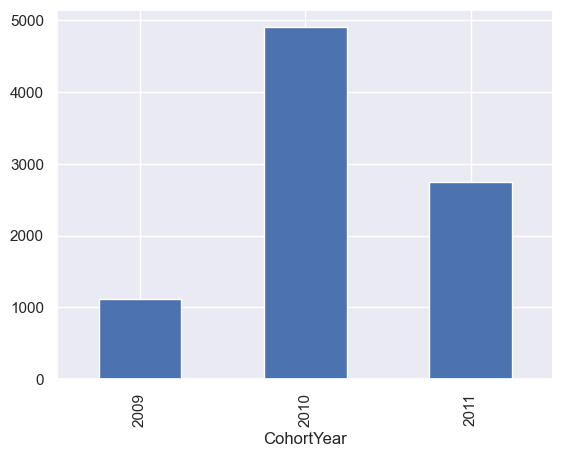

In [257]:
sns.set()
cohorts.plot.bar()


In [258]:
salescsv[["CustomerID", "Country", "InvoiceYear", "Quantity", "Sales"]].sort_values(
    by="Sales", ascending=False
)


,CustomerID,Country,InvoiceYear,Quantity,Sales
1035338,16446,United Kingdom,2011,80995,168469.60
570205,12346,United Kingdom,2011,74215,77183.60
725055,15098,United Kingdom,2011,60,38970.00
417788,15838,United Kingdom,2010,9360,15818.40
219740,18008,United Kingdom,2010,3500,8925.00
...,...,...,...,...,...
769839,14159,United Kingdom,2011,1,0.12
959384,17920,United Kingdom,2011,1,0.12
662434,17346,United Kingdom,2011,1,0.12
825029,12851,United Kingdom,2011,1,0.12


In [259]:
print(salescsv.loc[319296])


index                                318907
CustomerID                            14911
InvoiceDate             2010-09-07 00:00:00
Quantity                                 12
UnitPrice                              0.85
Sales                                  10.2
InvoiceType                         Invoice
InvoiceNo                            521642
StockCode                            84534B
InvoiceYear                            2010
InvoiceMonth                              9
Description     fairy cake notebook a5 size
Country                                EIRE
CohortYear                             2009
Name: 319296, dtype: object


In [260]:
cohort_group = salescsv.groupby(["CustomerID"])
cohort_data = cohort_group.agg(CohortIY=("InvoiceYear", np.min))
cohort_data["Cohort_Size"] = cohort_group["CustomerID"].nunique()
cohort_data


,CohortIY,Cohort_Size
CustomerID,,
12346,2010,1
12347,2010,1
12348,2010,1
12349,2010,1
12350,2011,1
...,...,...
581435,2011,1
581439,2011,1
581492,2011,1


In [261]:
year_group = pd.DataFrame(salescsv.groupby("InvoiceYear")["Sales"].sum())
year_group


,Sales
InvoiceYear,
2009,800567.77
2010,9793444.40
2011,9490818.52


In [262]:
customers_per_yr = pd.DataFrame(salescsv.groupby("InvoiceYear")["CustomerID"].nunique())
customers_per_yr


,CustomerID
InvoiceYear,
2009,1120
2010,5743
2011,5428


In [263]:
orders_per_yr = pd.DataFrame(salescsv.groupby("InvoiceYear")["InvoiceNo"].nunique())
orders_per_yr


,InvoiceNo
InvoiceYear,
2009,1666
2010,19624
2011,18219


In [264]:
year_group = year_group.merge(customers_per_yr, on="InvoiceYear")
year_group = year_group.merge(orders_per_yr, on="InvoiceYear")
year_group.columns = ["Sales_yr", "Customers_yr", "Orders_yr"]
year_group = year_group.reset_index()
year_group


,InvoiceYear,Sales_yr,Customers_yr,Orders_yr
0,2009,800567.77,1120,1666
1,2010,9793444.40,5743,19624
2,2011,9490818.52,5428,18219


In [265]:
year_group["avg_order_value"] = round(
    year_group["Sales_yr"] / year_group["Orders_yr"], 2
)
year_group["avg_sales_cust"] = round(
    year_group["Sales_yr"] / year_group["Customers_yr"], 2
)
year_group.sort_values(by="InvoiceYear", ascending=False)


,InvoiceYear,Sales_yr,Customers_yr,Orders_yr,avg_order_value,avg_sales_cust
2,2011,9490818.52,5428,18219,520.93,1748.49
1,2010,9793444.40,5743,19624,499.05,1705.28
0,2009,800567.77,1120,1666,480.53,714.79


In [266]:
first_invoice = pd.DataFrame(salescsv.groupby("CustomerID")["InvoiceDate"].min())
first_invoice = first_invoice.reset_index()
first_invoice.columns = ["CustomerID", "first_invoice_date"]

last_invoice = pd.DataFrame(salescsv.groupby("CustomerID")["InvoiceDate"].max())
last_invoice = last_invoice.reset_index()
last_invoice.columns = ["CustomerID", "last_invoice_date"]

invoice_dates = first_invoice.merge(last_invoice, on="CustomerID")
invoice_dates["cohort"] = invoice_dates["first_invoice_date"].dt.year
invoice_dates


,CustomerID,first_invoice_date,last_invoice_date,cohort
0,12346,2010-03-02,2011-01-18,2010
1,12347,2010-10-31,2011-12-07,2010
2,12348,2010-09-27,2011-09-25,2010
3,12349,2010-04-29,2011-11-21,2010
4,12350,2011-02-02,2011-02-02,2011
...,...,...,...,...
8768,581435,2011-12-08,2011-12-08,2011
8769,581439,2011-12-08,2011-12-08,2011
8770,581492,2011-12-09,2011-12-09,2011
8771,581497,2011-12-09,2011-12-09,2011


In [267]:
rfm.mean()


CustomerID                   15307.489112
frequency                        6.466380
recency                        383.422111
T                              522.138550
monetary_value                 449.762410
probability_alive                0.810756
predicted_purchases              2.072677
exp_avg_order_value            834.477322
predicted_next_year_sales     1843.140952
CLTSales                       302.183691
CLTV                            78.567760
CohortYear                    2009.983489
dtype: float64

In [268]:
rfm_actuals = rfm.copy()
rfm_actuals = rfm_actuals.merge(invoice_dates, on="CustomerID")
rfm_actuals = rfm_actuals[
    [
        "CustomerID",
        "cohort",
        "frequency",
        "recency",
        "T",
        "monetary_value",
        "first_invoice_date",
        "last_invoice_date",
    ]
]
rfm_actuals


,CustomerID,cohort,frequency,recency,T,monetary_value,first_invoice_date,last_invoice_date
0,12346,2010,2.0,322.0,647.0,38662.955000,2010-03-02,2011-01-18
1,12347,2010,7.0,402.0,404.0,717.398571,2010-10-31,2011-12-07
2,12348,2010,4.0,363.0,438.0,359.310000,2010-09-27,2011-09-25
3,12349,2010,2.0,571.0,589.0,1305.085000,2010-04-29,2011-11-21
4,12352,2010,8.0,356.0,392.0,198.223750,2010-11-12,2011-11-03
...,...,...,...,...,...,...,...,...
4174,18281,2010,1.0,397.0,577.0,80.820000,2010-05-11,2011-06-12
4175,18282,2011,1.0,119.0,126.0,77.840000,2011-08-05,2011-12-02
4176,18283,2010,18.0,655.0,658.0,146.075000,2010-02-19,2011-12-06
4177,18286,2009,1.0,247.0,723.0,833.480000,2009-12-16,2010-08-20


In [269]:
cohort_means = rfm_actuals.groupby("cohort").mean()
cohort_means.reset_index()


,cohort,CustomerID,frequency,recency,T,monetary_value,first_invoice_date,last_invoice_date
0,2009,15400.790993,13.872979,592.957275,731.092379,476.128416,2009-12-07 21:46:58.475750656,2011-07-23 20:45:27.020785408
1,2010,15312.482114,5.080684,393.945151,560.570747,406.520031,2010-05-27 10:18:07.440381440,2011-06-25 08:59:08.489666048
2,2011,15190.347553,2.792974,122.526976,173.770389,557.622968,2011-06-18 05:30:38.393977344,2011-10-18 18:09:29.134253568


In [270]:
rfm_actuals[rfm_actuals["CustomerID"] == 16446]


,CustomerID,cohort,frequency,recency,T,monetary_value,first_invoice_date,last_invoice_date
2895,16446,2011,1.0,205.0,205.0,168469.6,2011-05-18,2011-12-09


In [271]:
rfm_actuals.describe().round(2)


,CustomerID,cohort,frequency,recency,T,monetary_value,first_invoice_date,last_invoice_date
count,4179.00,4179.00,4179.00,4179.00,4179.00,4179.00,4179,4179
mean,15307.49,2009.98,6.47,383.42,522.14,449.76,2010-07-04 20:40:29.289303808,2011-07-23 06:48:19.641062400
min,12346.00,2009.00,1.00,1.00,9.00,3.90,2009-12-01 00:00:00,2009-12-03 00:00:00
25%,13840.00,2010.00,2.00,176.00,408.00,190.76,2010-01-20 00:00:00,2011-05-06 00:00:00
50%,15299.00,2010.00,3.00,386.00,589.00,304.98,2010-04-29 00:00:00,2011-10-12 00:00:00
75%,16775.50,2010.00,7.00,590.00,688.00,449.78,2010-10-27 00:00:00,2011-11-21 00:00:00
max,18287.00,2011.00,246.00,738.00,738.00,168469.60,2011-11-30 00:00:00,2011-12-09 00:00:00
std,1697.82,0.63,11.21,227.26,202.65,2721.53,NaN,NaN


In [272]:
frequency_mean_actuals = rfm_actuals["frequency"].mean()
recency_mean_actuals = rfm_actuals["recency"].mean()

print(
    "Avg customer makes ",
    round(frequency_mean_actuals, 2),
    "purchases in their customer lifetime",
)
print(
    "Avg customer makes a purchase once every ",
    round(recency_mean_actuals / 90, 1),
    "quarters or ",
    round(recency_mean_actuals / 30, 1),
    "months",
)


Avg customer makes  6.47 purchases in their customer lifetime
Avg customer makes a purchase once every  4.3 quarters or  12.8 months


In [273]:
rfm.to_csv("rfm.csv")


### Customer Segmentation Based Analysis using RFM

In [274]:
last_day = models_on_retail.InvoiceDate.max() + dt.timedelta(days=1)
last_day


Timestamp('2011-12-10 00:00:00')

In [275]:
rfm_table = models_on_retail.groupby("CustomerID").agg(
    {
        "InvoiceDate": lambda x: (last_day - x.max()).days,
        "InvoiceNo": "nunique",
        "Sales": "sum",
    }
)
rfm_table.rename(
    columns={"InvoiceDate": "Recency", "InvoiceNo": "Frequency", "Sales": "Monetary"},
    inplace=True,
)


In [276]:
r_labels = range(5, 0, -1)
fm_labels = range(1, 6)
rfm_table["R"] = pd.qcut(rfm_table["Recency"], 5, labels=r_labels)
rfm_table["F"] = pd.qcut(
    rfm_table["Frequency"].rank(method="first"), 5, labels=fm_labels
)
rfm_table["M"] = pd.qcut(rfm_table["Monetary"], 5, labels=fm_labels)


In [277]:
rfm_table["RFM_Segment"] = (
    rfm_table["R"].astype(str) + rfm_table["F"].astype(str) + rfm_table["M"].astype(str)
)
rfm_table["RFM_Score"] = rfm_table[["R", "F", "M"]].sum(axis=1)
rfm_table.head()


,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score
CustomerID,,,,,,,,
12346,326,3,77352.96,2,4,5,245,11
12347,3,8,5633.32,5,5,5,555,15
12348,76,5,1658.40,4,4,4,444,12
12349,19,3,3678.69,5,4,5,545,14
12350,311,1,294.40,3,1,2,312,6


**Champions**: Bought recently, buy often and spend the most

**Loyal customers**: Buy on a regular basis. Responsive to promotions.

**Potential loyalist**: Recent customers with average frequency.

**Recent customers**: Bought most recently, but not often.

**Promising**: Recent shoppers, but havenâ€™t spent much.

**Needs attention**: Above average recency, frequency and monetary values. May not have bought very recently though.

**About to sleep**: Below average recency and frequency. Will lose them if not reactivated.

**At risk**: Some time since theyâ€™ve purchased. Need to bring them back!

**Canâ€™t lose them**: Used to purchase frequently but havenâ€™t returned for a long time.

**Hibernating**: Last purchase was long back and low number of orders. May be lost.

In [278]:
segt_map = {
    r"[1-2][1-2]": "Hibernating",
    r"[1-2][3-4]": "At-Risk",
    r"[1-2]5": "Cannot lose them",
    r"3[1-2]": "About To Sleep",
    r"33": "Need Attention",
    r"[3-4][4-5]": "Loyal Customers",
    r"41": "Promising",
    r"51": "New Customers",
    r"[4-5][2-3]": "Potential Loyalists",
    r"5[4-5]": "Champions",
}
rfm_table["Segment"] = rfm_table["R"].astype(str) + rfm_table["F"].astype(str)
rfm_table["Segment"] = rfm_table["Segment"].replace(segt_map, regex=True)
rfm_table.head()


,Recency,Frequency,Monetary,R,F,M,RFM_Segment,RFM_Score,Segment
CustomerID,,,,,,,,,
12346,326,3,77352.96,2,4,5,245,11,At-Risk
12347,3,8,5633.32,5,5,5,555,15,Champions
12348,76,5,1658.40,4,4,4,444,12,Loyal Customers
12349,19,3,3678.69,5,4,5,545,14,Champions
12350,311,1,294.40,3,1,2,312,6,About To Sleep


In [279]:
rfm_coordinates = {
    "Champions": [3, 5, 0.8, 1],
    "Loyal Customers": [3, 5, 0.4, 0.8],
    "Cannot lose them": [4, 5, 0, 0.4],
    "At-Risk": [2, 4, 0, 0.4],
    "Hibernating": [0, 2, 0, 0.4],
    "About To Sleep": [0, 2, 0.4, 0.6],
    "Promising": [0, 1, 0.6, 0.8],
    "New Customers": [0, 1, 0.8, 1],
    "Potential Loyalists": [1, 3, 0.6, 1],
    "Need Attention": [2, 3, 0.4, 0.6],
}


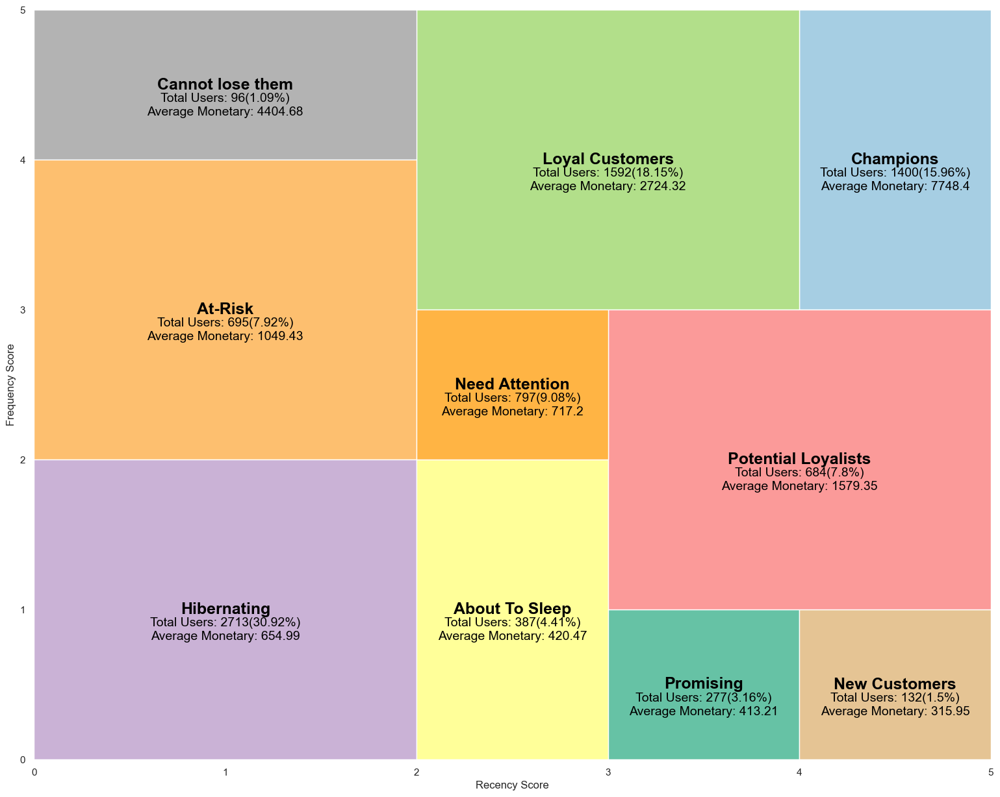

In [280]:
sns.set()
fig, ax = plt.subplots(figsize=(19, 15))

ax.set_xlim([0, 5])
ax.set_ylim([0, 5])

# plt.rcParams["axes.facecolor"] = "white"
palette = [
    "#a6cee3",
    "#b2df8a",
    "#b3b3b3",
    "#fdbf6f",
    "#cab2d6",
    "#ffff99",
    "#66c2a5",
    "#e5c494",
    "#fb9a99",
    "#ffb444",
]

for key, color in zip(rfm_coordinates.keys(), palette[:10]):

    coordinates = rfm_coordinates[key]
    ymin, ymax, xmin, xmax = (
        coordinates[0],
        coordinates[1],
        coordinates[2],
        coordinates[3],
    )

    ax.axhspan(ymin=ymin, ymax=ymax, xmin=xmin, xmax=xmax, facecolor=color)

    users = rfm_table[rfm_table.Segment == key].shape[0]
    users_percentage = (
        rfm_table[rfm_table.Segment == key].shape[0] / rfm_table.shape[0]
    ) * 100
    avg_monetary = rfm_table[rfm_table.Segment == key]["Monetary"].mean()

    user_txt = (
        "\n\nTotal Users: " + str(users) + "(" + str(round(users_percentage, 2)) + "%)"
    )
    monetary_txt = "\n\n\n\nAverage Monetary: " + str(round(avg_monetary, 2))

    x = 5 * (xmin + xmax) / 2
    y = (ymin + ymax) / 2

    plt.text(
        x=x,
        y=y,
        s=key,
        ha="center",
        va="center",
        fontsize=18,
        color="black",
        fontweight="bold",
    )
    plt.text(x=x, y=y, s=user_txt, ha="center", va="center", fontsize=14, color="black")
    plt.text(
        x=x, y=y, s=monetary_txt, ha="center", va="center", fontsize=14, color="black"
    )

    ax.set_xlabel("Recency Score")
    ax.set_ylabel("Frequency Score")

sns.despine(left=True, bottom=True)
plt.show()


In [281]:
rfm_table2 = rfm_table.reset_index()
rfm_monetary_size = rfm_table2.groupby("Segment").agg(
    {"Monetary": "mean", "CustomerID": "nunique"}
)
rfm_monetary_size.rename(
    columns={"Monetary": "MeanMonetary", "CustomerID": "CustomerCount"}, inplace=True
)
rfm_monetary_size = rfm_monetary_size.sort_values("MeanMonetary", ascending=False)


In [283]:
#rfmt2 = rfm_table2.groupby("Segment").agg(
#    {
#        "CustomerID": "nunique",
#        "Recency": "mean",
#        "Frequency": "mean",
#        "Monetary": "mean",
#    }
#)
#rfmt2.rename(columns={"CustomerID": "Segment Size"}, inplace=True)
#cm = sns.light_palette("#b2df8a", as_cmap=True)
#rfmt2.T.style.background_gradient(cmap=cm, axis=1).set_precision(2).highlight_min(
#    axis=1, color="#66c2a5"
#).highlight_max(axis=1, color="#a6d854")


## RFM Segment Relational Monetary Value Plot

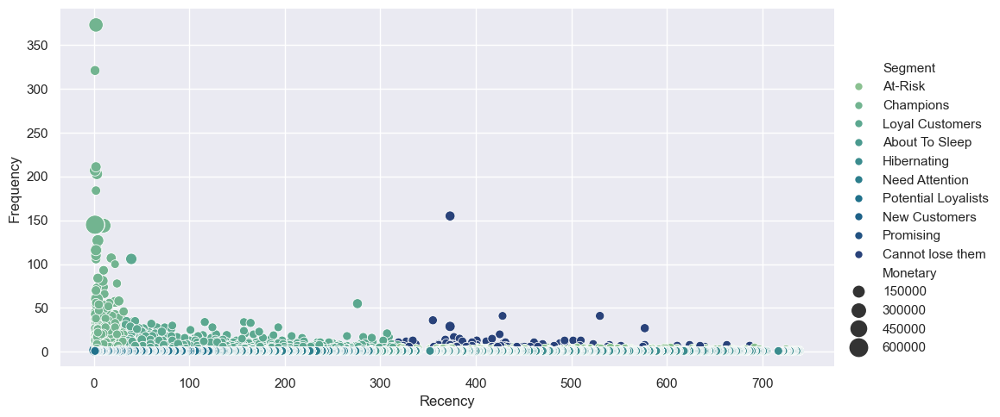

In [284]:
sns.set()
sns.relplot(
    x="Recency",
    y="Frequency",
    hue="Segment",
    size="Monetary",
    data=rfm_table2,
    palette="crest",
    height=5,
    aspect=2,
    sizes=(50, 250),
)
plt.show()


In [285]:
monetary_per_segment = (
    rfm_table2.groupby("Segment")["Monetary"].sum()
    / rfm_table2.groupby("Segment")["Monetary"].sum().sum()
).sort_values(ascending=False)


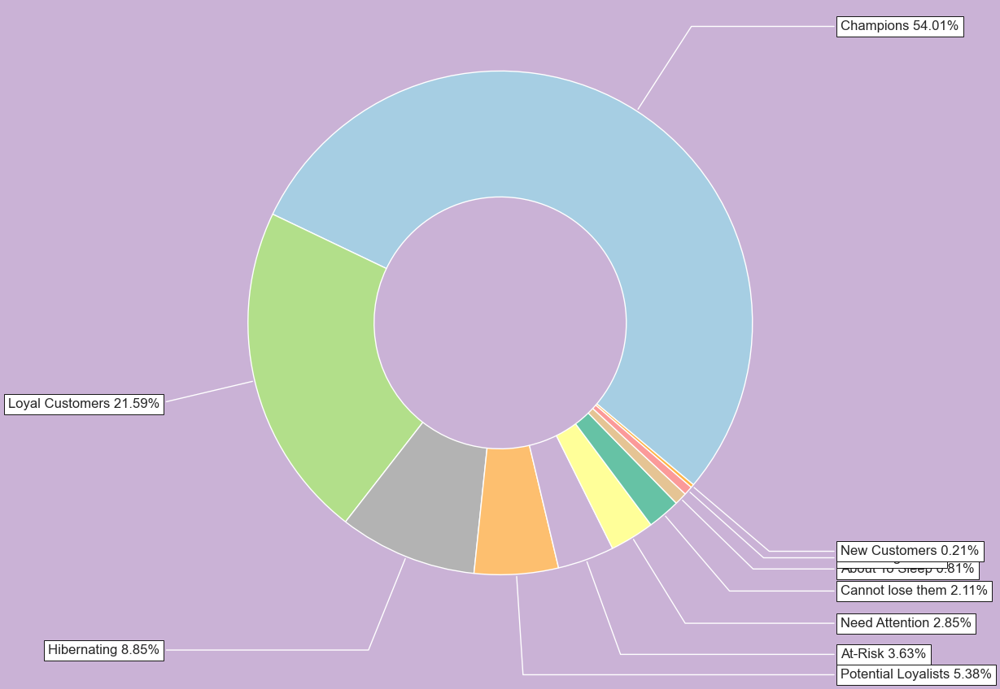

In [286]:
fig, ax = plt.subplots(figsize=(10, 20), facecolor="#cab2d6")

wedges, texts = ax.pie(
    monetary_per_segment.values,
    wedgeprops=dict(width=0.5),
    startangle=-40,
    normalize=False,
    colors=palette,
)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"), bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1) / 2.0 + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(
        monetary_per_segment.index[i]
        + " "
        + str(round(monetary_per_segment[i] * 100, 2))
        + "%",
        xy=(x, y),
        xytext=(1.35 * np.sign(x), 1.4 * y),
        horizontalalignment=horizontalalignment,
        **kw
    )
plt.show()


In [287]:
rfm_clustering = rfm_table2[["Recency", "Frequency", "Monetary", "Segment"]]
for col in ["Recency", "Frequency", "Monetary"]:
    scaler = StandardScaler()
    rfm_clustering[col] = np.log(rfm_clustering[col])
    rfm_clustering[col] = scaler.fit_transform(
        rfm_clustering[col].values.reshape(-1, 1)
    )
rfm_melted = pd.melt(
    rfm_clustering,
    id_vars="Segment",
    value_vars=["Recency", "Frequency", "Monetary"],
    var_name="RFM",
    value_name="Value",
)


In [288]:
rfm_melted


,Segment,RFM,Value
0,At-Risk,Recency,0.616488
1,Champions,Recency,-2.438977
2,Loyal Customers,Recency,-0.332528
3,Champions,Recency,-1.236009
4,About To Sleep,Recency,0.585789
...,...,...,...
26314,Potential Loyalists,Monetary,-2.474799
26315,Potential Loyalists,Monetary,1.233594
26316,Potential Loyalists,Monetary,1.318414
26317,Potential Loyalists,Monetary,0.948562


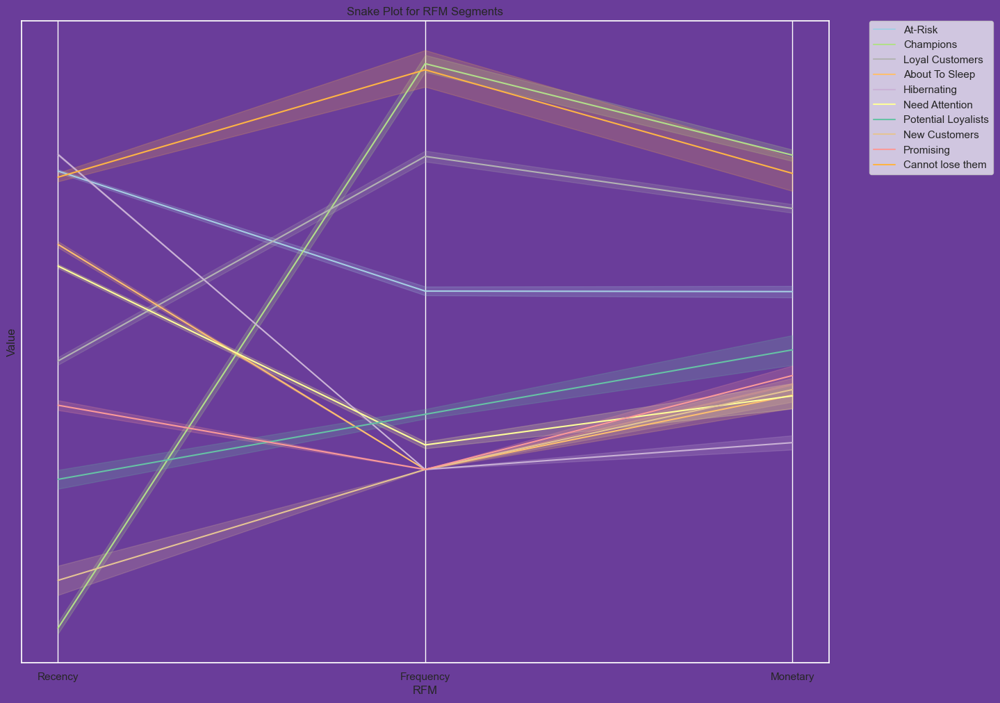

In [289]:
fig, ax = plt.subplots(figsize=(15, 12), facecolor="#6a3d9a")
ax.set_facecolor("#6a3d9a")
sns.lineplot(x="RFM", y="Value", hue="Segment", data=rfm_melted, palette=palette)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
ax.set_yticks([])
ax.set_title("Snake Plot for RFM Segments")
ax.grid(True)
plt.show()


#### Customer Segmentation using RFM Metrics

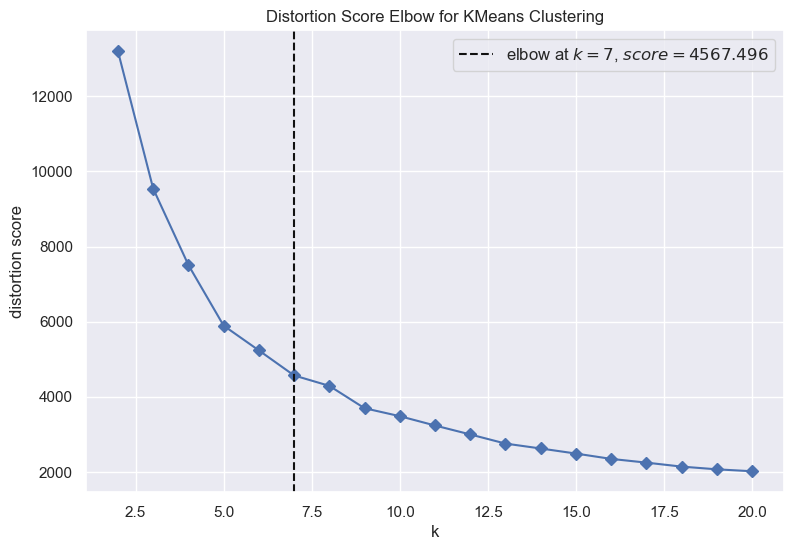

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [290]:
sns.set()
features = ["Recency", "Frequency", "Monetary"]
kmeans_ = KMeans(init="k-means++", random_state=42)
fig, ax = plt.subplots(figsize=(9, 6))
ax.grid(True)
visualizer = KElbowVisualizer(kmeans_, k=(2, 21), timings=False)
visualizer.fit(rfm_clustering[features])
visualizer.show()


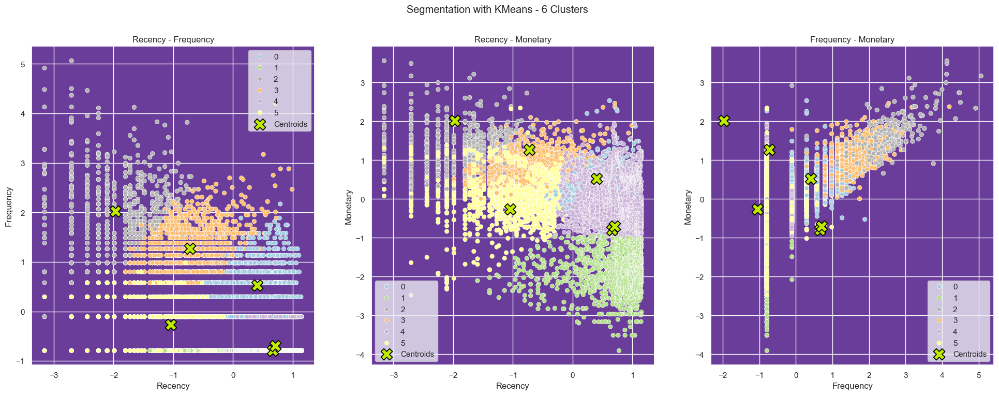

In [291]:
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(rfm_clustering[features])
cluster = kmeans.labels_
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
for i, feature in list(
    enumerate(combinations(["Recency", "Frequency", "Monetary"], 2))
):
    sns.scatterplot(
        x=rfm_clustering[feature[0]],
        y=rfm_clustering[feature[1]],
        hue=cluster,
        palette=palette[: len(set(cluster))],
        ax=axes[i],
    ).set_title(feature[0] + " - " + feature[1])
    sns.scatterplot(
        x=kmeans.cluster_centers_[:, 0],
        y=kmeans.cluster_centers_[:, 1],
        s=250,
        color="#C0EB00",
        label="Centroids",
        marker="X",
        ax=axes[i],
        edgecolor="black",
    )
plt.suptitle("Segmentation with KMeans - 6 Clusters")
for ax in axes:
    ax.set_facecolor("#6a3d9a")
    # ax.grid(False)
plt.show()


### Transaction Analysis

In [292]:
aov = (
    salescsv.groupby("InvoiceYear")["Sales"].sum()
    / salescsv.groupby("InvoiceYear")["InvoiceNo"].nunique()
)
print("Average Order Value by Year ", aov, "\n")


Average Order Value by Year  InvoiceYear
2009    480.532875
2010    499.054444
2011    520.929717
dtype: float64 



In [293]:
print("Sales mean by year \n", salescsv.groupby("InvoiceYear")["Sales"].mean(), "\n")


Sales mean by year 
 InvoiceYear
2009    18.287406
2010    19.334840
2011    19.523131
Name: Sales, dtype: float64 



In [294]:
salescsv["Log_Sales"] = np.log(salescsv["Sales"])


In [295]:
purchases = salescsv.groupby("CustomerID")["InvoiceNo"].nunique()
purchases.columns = ["CustomerID", "Purchases"]
salescsv = merge_dfs(salescsv, [purchases], "CustomerID")
salescsv.rename(
    {"InvoiceNo_x": "InvoiceNo", "InvoiceNo_y": "Purchases"}, axis=1, inplace=True
)


In [296]:
aov_data = pd.DataFrame(
    {
        "Annual Sales": salescsv.groupby("InvoiceYear")["Sales"].sum(),
        "AOV": aov,
        "Sales mean": salescsv.groupby("InvoiceYear")["Sales"].mean(),
        "log_sales avg": salescsv.groupby("InvoiceYear")["Log_Sales"].mean(),
    }
)

print(aov_data)


             Annual Sales         AOV  Sales mean  log_sales avg
InvoiceYear                                                     
2009            800567.77  480.532875   18.287406       2.156186
2010           9793444.40  499.054444   19.334840       2.185480
2011           9490818.52  520.929717   19.523131       2.142880


In [297]:
histsaleslog = salescsv.copy()


In [298]:
def remove_nans(df):
    df.dropna(axis=1, how="all", inplace=True)
    df.dropna(axis=0, how="all", inplace=True)
    df.reset_index(drop=True)
    return df


In [299]:
# histsaleslog = remove_nans(histsaleslog)


In [300]:
# Replace infinite updated data with nan
histsaleslog.replace([np.inf, -np.inf], np.nan, inplace=True)
# Drop rows with NaN
histsaleslog.dropna(inplace=True)


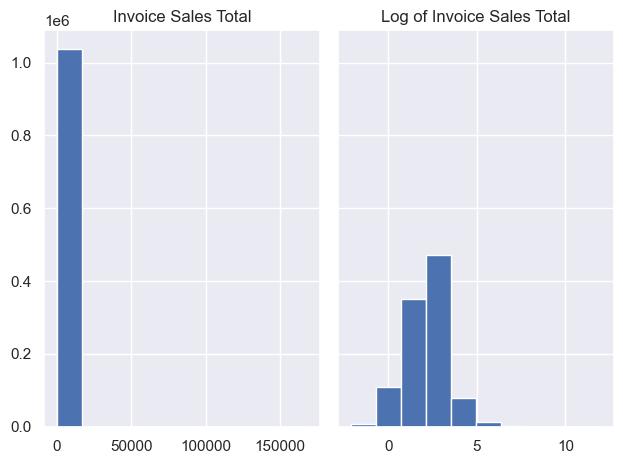

In [301]:
    sns.set()
    fig, axs =plt.subplots(1,2, sharey=True, tight_layout=True)
    axs[0].hist(histsaleslog['Sales'])
    axs[0].set_title('Invoice Sales Total')


    axs[1].hist(histsaleslog['Log_Sales'])
    axs[1].set_title('Log of Invoice Sales Total')

    plt.show();

In [303]:
salescsv_reframe = [
    "CustomerID",
    "CohortYear",
    "Purchases",
    "InvoiceDate",
    "Quantity",
    "UnitPrice",
    "Sales",
    "InvoiceType",
    "InvoiceNo",
    "StockCode",
   # "CustomerSince",
    "InvoiceYear",
    "InvoiceMonth",
    "Description",
    "Country",
    "Log_Sales",
]
salescsv = salescsv[salescsv_reframe]


In [304]:
salescsv.to_csv("sales.csv")


In [305]:
# sales_per_year_plt(annual_sales);


In [306]:
# Cohort Analysis
# cohort_transactions = salescsv


In [307]:
def cohort_size(salescsv):
    cohort_by_customers = pd.DataFrame(
        salescsv.groupby("CohortYear")["CustomerID"].nunique()
    )
    return cohort_by_customers


In [308]:
cohort_by_customers = cohort_size(salescsv)
cohort_by_customers


,CustomerID
CohortYear,
2009,1120
2010,4902
2011,2751


In [309]:
def cohort_sales_by_year(salescsv):
    sales_yr_cohort = pd.DataFrame(
        salescsv.groupby(["InvoiceYear", "CohortYear"])["Sales"].sum()
    )
    return sales_yr_cohort


In [310]:
sales_yr_cohort = cohort_sales_by_year(salescsv)
sales_yr_cohort


Sales
InvoiceYear CohortYear            
2009        2009         800567.77
2010        2009        4500355.00
            2010        5293089.40
2011        2009        3318000.85
            2010        3215901.01
            2011        2956916.66

In [311]:
quad_sales = salescsv.groupby("InvoiceYear")["Sales"].sum()
quad_sales.to_string()
quad_sales = quad_sales.round(decimals=0).astype(int)
quad_sales = pd.DataFrame(salescsv.groupby("InvoiceYear")["Sales"].sum()).reset_index()
quad_sales["Sales"] = quad_sales["Sales"].apply(lambda x: "Â£{:,.0f}".format(x))
quad_sales_text = quad_sales.set_index("InvoiceYear")
quad_sales_text


,Sales
InvoiceYear,
2009,"Â£800,568"
2010,"Â£9,793,444"
2011,"Â£9,490,819"


In [312]:
def customer_cohort_data(salescsv):
    sales_yr_cohort = cohort_sales_by_year(salescsv)
    sales_yr_cohort = sales_yr_cohort.reset_index()
    sales_yr_cohort = sales_yr_cohort.rename({"CohortYear": "CohortYearSales"}, axis=1)
    sales_cohort_data = pd.pivot_table(
        sales_yr_cohort,
        index="CohortYearSales",
        values="Sales",
        columns="InvoiceYear",
        fill_value=0,
    )
    return sales_cohort_data


In [313]:
def customer_cohort_chart(salescsv):
    sales_cohort_data = customer_cohort_data(salescsv)
    years = sales_cohort_data.columns.to_list()

    y = {}
    for yr in sales_cohort_data.index.to_list():
        y[yr] = sales_cohort_data.loc[yr].to_list()

    fig, ax = plt.subplots(figsize=(12, 10))
    x = years
    ax.plot(x, quad_sales["Sales"], color="blue", linewidth=2)
    for i, j in zip(x, quad_sales_text["Sales"]):
        ax.annotate(str(j), xy=(i, j))

    ax.stackplot(years, y.values(), labels=y.keys())
    ax.legend(loc="upper left", fontsize=16)
    ax.set_title("Annual Sales by Customer Cohort Year", fontsize=16)
    ax.set_xlabel("Years", fontsize=16)
    ax.set_ylabel("Sales (Â£)", fontsize=16)
    plt.yticks(
        np.arange(0, 15000000, 2000000),
        labels=["0", "2m", "4m", "6m", "8m", "10m", "12m", "14m"],
        fontsize=16,
    )
    plt.xticks(fontsize=16)
    #plt.savefig("c3.png")
    plt.show()
    return plt


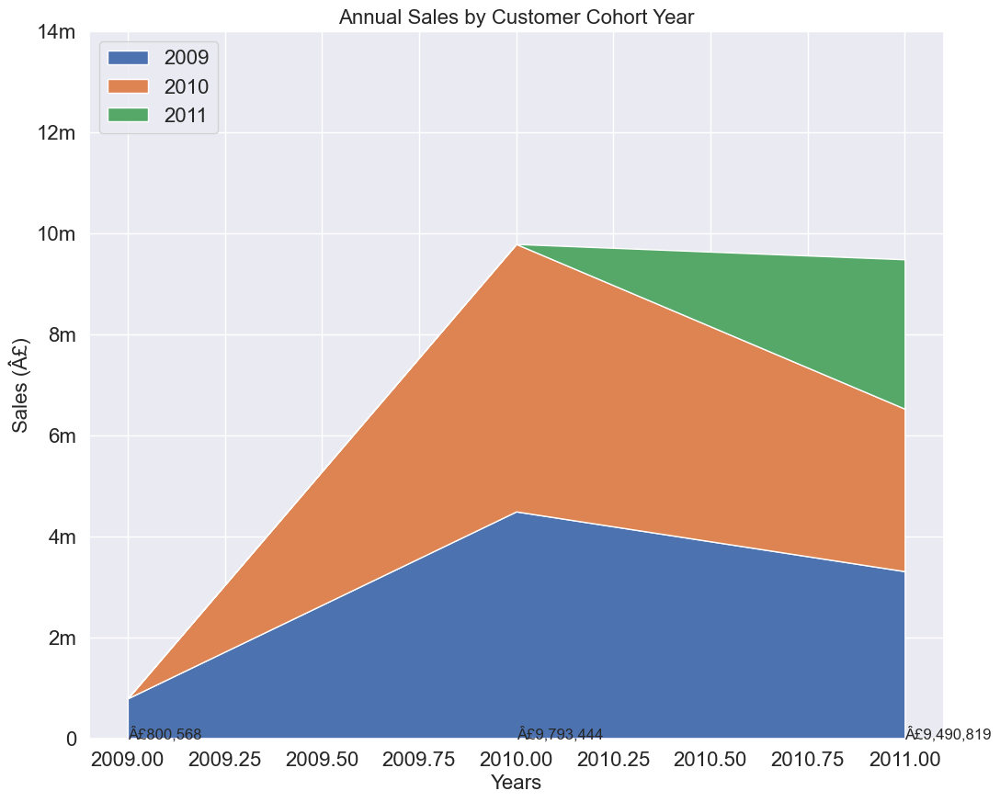

In [314]:
sns.set()
c3 = customer_cohort_chart(salescsv)
#c3.savefig("customer_cohort_chart.png")


In [315]:
def customer_serviced_yr(salescsv):  # use transactions
    customers_serviced = pd.DataFrame(
        salescsv.groupby("InvoiceYear")["CustomerID"].nunique()
    ).reset_index()
    customers_serviced.columns = ["InvoiceYear", "CustomerCount"]
    return customers_serviced


In [316]:
def new_customers_yr(salescsv):
    new_customers = pd.DataFrame(
        salescsv.groupby("CohortYear")["CustomerID"].nunique()
    ).reset_index()
    new_customers.columns = ["InvoiceYear", "NewCustomers"]
    return new_customers


In [317]:
def new_customers_invoices(salescsv):
    new_customers_orders = pd.DataFrame(
        salescsv.groupby(["InvoiceYear", "CohortYear"])["InvoiceNo"].nunique()
    ).reset_index()
    new_customers_orders.columns = [
        "InvoiceYear",
        "CohortYear",
        "Orders-from-new-customers",
    ]
    new_customers_orders = new_customers_orders[
        new_customers_orders["CohortYear"] == new_customers_orders["InvoiceYear"]
    ]
    new_customers_orders = new_customers_orders[
        ["InvoiceYear", "Orders-from-new-customers"]
    ]
    return new_customers_orders


In [318]:
def new_customers_sales(salescsv):
    sales_new_customers = pd.DataFrame(
        salescsv.groupby(["InvoiceYear", "CohortYear"])["Sales"].sum()
    ).reset_index()
    sales_new_customers.columns = [
        "InvoiceYear",
        "CohortYear",
        "Sales-from-new-customers",
    ]
    sales_new_customers = sales_new_customers[
        sales_new_customers["CohortYear"] == sales_new_customers["InvoiceYear"]
    ]
    sales_new_customers = sales_new_customers[
        ["InvoiceYear", "Sales-from-new-customers"]
    ]
    return sales_new_customers


In [319]:
def orders_per_year(salescsv):
    orders = pd.DataFrame(
        salescsv.groupby("InvoiceYear")["InvoiceNo"].nunique()
    ).reset_index()
    orders.columns = ["InvoiceYear", "OrderCount"]
    return orders


In [320]:
def transaction_data(salescsv):
    trans_data_table = merge_dfs(
        annual_sales,
        [
            customers_serviced,
            sales_new_customers,
            new_customers,
            orders,
            new_customers_orders,
        ],
        key="InvoiceYear",
    )
    trans_data_table["InvoiceYear"] = trans_data_table["InvoiceYear"].astype("int")
    trans_data_table["Percent-of-Sales-from-new-Customers"] = (
        trans_data_table["Sales-from-new-customers"] / trans_data_table["Sales"]
    ) * 100
    trans_data_table["Avg-Sales-per-Order"] = (
        trans_data_table["Sales"] / trans_data_table["OrderCount"]
    )
    trans_data_table["Avg-num-orders-per-Customer"] = (
        trans_data_table["OrderCount"] / trans_data_table["CustomerCount"]
    )
    trans_data_table["Avg-num-orders-per-New-Customer"] = (
        trans_data_table["Orders-from-new-customers"] / trans_data_table["NewCustomers"]
    )
    trans_data_table["Percent-of-order-from-New-Customers"] = (
        trans_data_table["Orders-from-new-customers"] / trans_data_table["OrderCount"]
    ) * 100
    trans_data_table["Average-sales-per-new-customer-order"] = (
        trans_data_table["Sales-from-new-customers"]
        / trans_data_table["Orders-from-new-customers"]
    )
    trans_data_table = trans_data_table.astype("int")
    return trans_data_table


In [321]:
def sales_per_year(salescsv):
    annual_sales = pd.DataFrame(salescsv.groupby("InvoiceYear")["Sales"].sum())
    return annual_sales


In [322]:
    annual_sales = sales_per_year(salescsv)
    customers_serviced = customer_serviced_yr(salescsv)
    orders = orders_per_year(salescsv)
    new_customers = new_customers_yr(salescsv)
    new_customers_orders = new_customers_invoices(salescsv)
    print('\n',new_customers_orders.transpose())
    sales_new_customers = new_customers_sales(salescsv)
    print('\n',sales_new_customers.transpose())

    trans_data_table = transaction_data(salescsv)
    trans_data_table.transpose().to_csv('transaction_analysis_pivot.csv')
    print(trans_data_table.transpose())
    


                               0      2     5
InvoiceYear                2009   2010  2011
Orders-from-new-customers  1666  11717  5167

                                   0          2           5
InvoiceYear                 2009.00     2010.0     2011.00
Sales-from-new-customers  800567.77  5293089.4  2956916.66
                                           0        1        2
InvoiceYear                             2009     2010     2011
Sales                                 800567  9793444  9490818
CustomerCount                           1120     5743     5428
Sales-from-new-customers              800567  5293089  2956916
NewCustomers                            1120     4902     2751
OrderCount                              1666    19624    18219
Orders-from-new-customers               1666    11717     5167
Percent-of-Sales-from-new-Customers      100       54       31
Avg-Sales-per-Order                      480      499      520
Avg-num-orders-per-Customer                1        3 

In [323]:
def retention_matrix_data(salescsv):
    df_cohort = (
        salescsv.groupby(["CohortYear", "InvoiceYear"])
        .agg(n_customers=("CustomerID", "nunique"))
        .reset_index(drop=False)
    )
    df_cohort["period_number"] = df_cohort["InvoiceYear"] - df_cohort["CohortYear"]

    cohort_pivot = df_cohort.pivot_table(
        index="CohortYear", columns="period_number", values="n_customers"
    )
    print("Cohort Customer count per year \n", cohort_pivot)
    cohort_size = cohort_pivot.iloc[:, 0]
    cohort_size.columns = ["CohortYear", "unique customers per cohort"]
    retention_matrix = cohort_pivot.divide(cohort_size, axis=0)
    print("Customer Retention \n", retention_matrix)
    return retention_matrix


In [324]:
retention_matrix_data(salescsv)


Cohort Customer count per year 
 period_number       0       1      2
CohortYear                          
2009           1120.0   841.0  704.0
2010           4902.0  1973.0    NaN
2011           2751.0     NaN    NaN
Customer Retention 
 period_number    0         1         2
CohortYear                            
2009           1.0  0.750893  0.628571
2010           1.0  0.402489       NaN
2011           1.0       NaN       NaN


period_number,0,1,2
CohortYear,,,
2009,1.0,0.750893,0.628571
2010,1.0,0.402489,NaN
2011,1.0,NaN,NaN


In [325]:
def retention_curve(salescsv):
    # retention_matrix = retention_matrix_data(salescsv)
    curve = retention_matrix.mean(axis=0).reset_index()
    curve.columns = ["periods", "retention"]
    curve["churn"] = 1 - curve["retention"]
    return curve


curve = retention_curve(salescsv)
curve


,periods,retention,churn
0,0,1.000000,0.000000
1,1,0.576691,0.423309
2,2,0.628571,0.371429


In [326]:
cohort_prediction = pd.read_csv("cohort_predictions.csv")
cohort_prediction = cohort_prediction.reset_index(drop=True)
round(cohort_prediction, 2)


,Unnamed: 0,CohortYear,P2012,percent_of_next_year_sales
0,0,2009,2322148.37,30.15
1,1,2010,3790896.20,49.22
2,2,2011,1589441.46,20.64


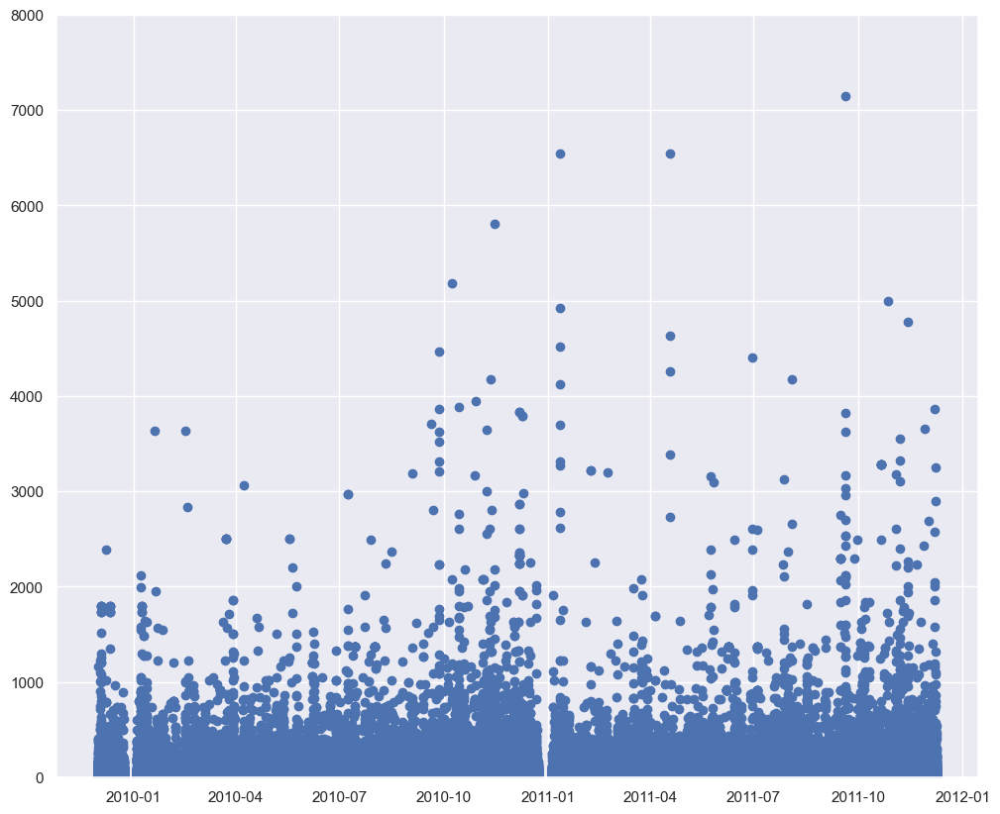

In [327]:
sns.set()
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_ylim(0, 8000)
plt.scatter(salescsv["InvoiceDate"], salescsv["Sales"])
plt.show()


In [328]:
salescsv["year_month"] = pd.to_datetime(salescsv["InvoiceDate"]).dt.to_period("M")
monthly = pd.DataFrame(salescsv.groupby("year_month")["Sales"].sum())  # .reset_index()
# series.columns = ['year_month', 'Sales']
monthly


,Sales
year_month,
2009-12,800567.77
2010-01,608587.93
2010-02,537165.31
2010-03,758172.47
2010-04,648604.37
2010-05,645214.30
2010-06,699104.30
2010-07,634860.36
2010-08,672855.27


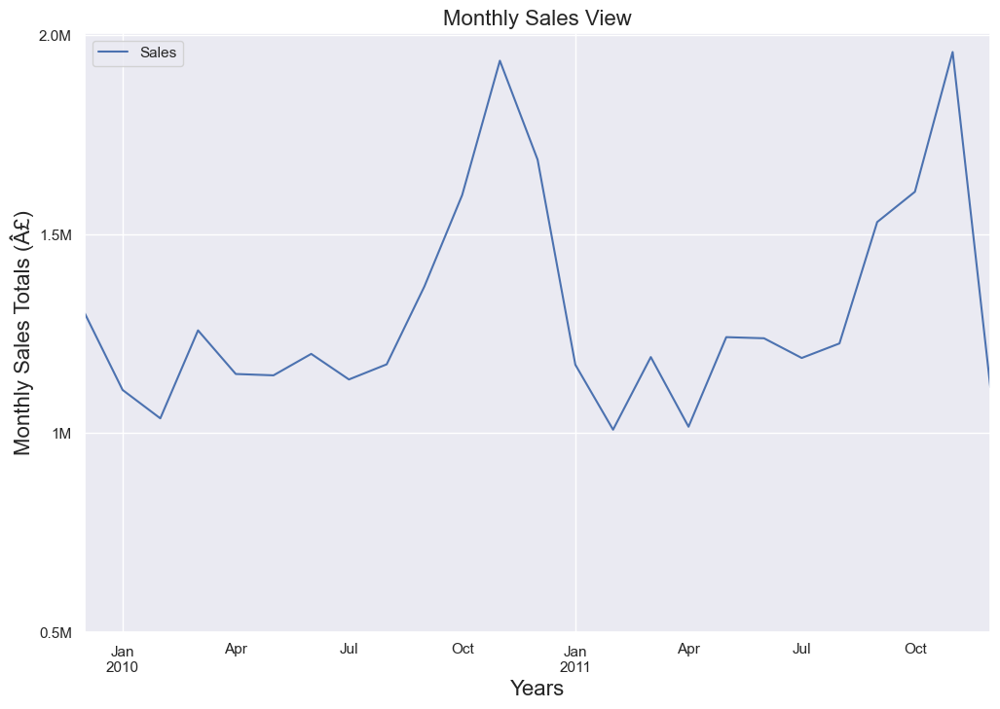

In [329]:
sns.set()
ax = monthly.plot(figsize=(12, 8))
yvalues = np.arange(0, 2000000, 500000)
ylabels = ["0.5M", "1M", "1.5M", "2.0M"]
plt.title(label="Monthly Sales View", fontsize=16)
ax.set_xlabel("Years", fontsize=16)
plt.yticks(ticks=yvalues, labels=ylabels)
ax.set_ylabel("Monthly Sales Totals (Â£)", fontsize=16)
fig = ax.get_figure()
ax.grid(True)
#fig.savefig("monthly.png")


In [330]:
salescsv["quarters"] = pd.to_datetime(salescsv["InvoiceDate"]).dt.to_period("Q")
df_quarters = pd.DataFrame(
    salescsv.groupby("quarters")["Sales"].sum()
)  # .reset_index()
# series.columns = ['year_month', 'Sales']
df_quarters


,Sales
quarters,
2009Q4,800567.77
2010Q1,1903925.71
2010Q2,1992922.97
2010Q3,2176335.85
2010Q4,3720259.87
2011Q1,1871732.06
2011Q2,1995597.48
2011Q3,2444426.20
2011Q4,3179062.78


In [331]:
def retention_matrix_data(salescsv):
    df_cohort = (
        salescsv.groupby(["CohortYear", "InvoiceYear"])
        .agg(n_customers=("CustomerID", "nunique"))
        .reset_index(drop=False)
    )
    df_cohort["period_number"] = df_cohort["InvoiceYear"] - df_cohort["CohortYear"]

    cohort_pivot = df_cohort.pivot_table(
        index="CohortYear", columns="period_number", values="n_customers"
    )
    print("Cohort Customer count per year \n", cohort_pivot)
    cohort_size = cohort_pivot.iloc[:, 0]
    cohort_size.columns = ["CohortYear", "unique customers per cohort"]
    retention_matrix = cohort_pivot.divide(cohort_size, axis=0)
    print("Customer Retention \n", retention_matrix)
    return retention_matrix


In [332]:
retention_matrix_data(salescsv)


Cohort Customer count per year 
 period_number       0       1      2
CohortYear                          
2009           1120.0   841.0  704.0
2010           4902.0  1973.0    NaN
2011           2751.0     NaN    NaN
Customer Retention 
 period_number    0         1         2
CohortYear                            
2009           1.0  0.750893  0.628571
2010           1.0  0.402489       NaN
2011           1.0       NaN       NaN


period_number,0,1,2
CohortYear,,,
2009,1.0,0.750893,0.628571
2010,1.0,0.402489,NaN
2011,1.0,NaN,NaN


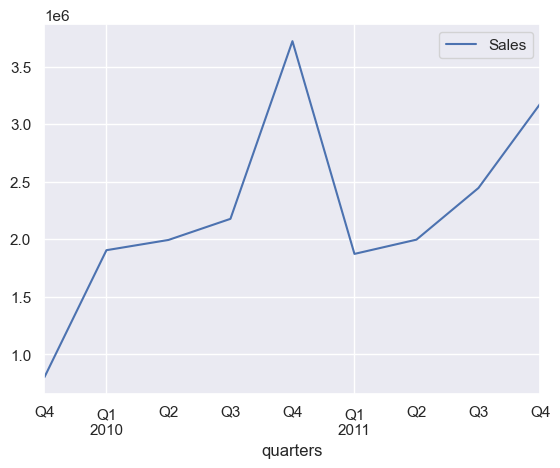

In [333]:
ax = df_quarters.plot()
ax.grid(True)
sns.set()


#### Toggle Monthly - Quarterly Cohorts

In [334]:
quartmonret = salescsv.copy()
quartmonret["OrderPeriod"] = quartmonret.InvoiceDate.apply(
    lambda x: str(x.year) + "q" + str(x.quarter)
)  # Toggle
quartmonret.set_index("CustomerID", inplace=True)


In [335]:
quartmonret["CohortGroup"] = (
    quartmonret.groupby(level=0)["InvoiceDate"]
    .min()
    .apply(lambda x: x.strftime("%Y-%m"))
)
quartmonret.reset_index(inplace=True)


In [336]:
quart_group = quartmonret.groupby(["CohortGroup", "OrderPeriod"])
# count the unique users, orders, and total revenue per Group + Period
quart_cohorts = quart_group.agg(
    {"CustomerID": pd.Series.nunique, "InvoiceNo": pd.Series.nunique, "Sales": np.sum}
)
# make the column names more meaningful
quart_cohorts.rename(
    columns={"CustomerID": "TotalCustomers", "InvoiceNo": "TotalOrders"}, inplace=True
)


In [337]:
quart_cohorts.Sales.sum()


20084830.69

In [338]:
def cohort_period(quartmonret):
    quartmonret["CohortPeriod"] = np.arange(len(quartmonret)) + 1
    return quartmonret


In [339]:
quart_cohorts = quart_cohorts.groupby(level=0, group_keys=False).apply(cohort_period)
# reindex the DataFrame
quart_cohorts.reset_index(inplace=True)
quart_cohorts.set_index(["CohortGroup", "CohortPeriod"], inplace=True)
quart_cohorts


OrderPeriod  TotalCustomers  TotalOrders       Sales
CohortGroup CohortPeriod                                                     
2009-12     1                 2009q4            1120         1666   800567.77
            2                 2010q1             599         1800  1032727.44
            3                 2010q2             616         1853   907481.14
            4                 2010q3             562         1794  1012442.09
            5                 2010q4             662         2460  1547704.33
...                              ...             ...          ...         ...
2011-09     1                 2011q3             267          297   182803.87
            2                 2011q4              95          206    60482.31
2011-10     1                 2011q4             323          513   243994.22
2011-11     1                 2011q4             300          382   408759.62
2011-12     1                 2011q4              68           70   125756.64

[117 rows x 4 columns]

In [340]:
# create a Series holding the total size of each CohortGroup
cohort_group_size = quart_cohorts["TotalCustomers"].groupby(level=0).first()
cohort_group_size.head()


CohortGroup
2009-12    1120
2010-01     458
2010-02     471
2010-03     579
2010-04     414
Name: TotalCustomers, dtype: int64

In [341]:
user_retention = (
    quart_cohorts["TotalCustomers"].unstack(0).divide(cohort_group_size, axis=1)
)
user_retention.head()


CohortGroup,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,...,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12
CohortPeriod,,,,,,,,,,,,,,,,,,,,,
1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.0
2,0.534821,0.478166,0.411890,0.336788,0.292271,0.254011,0.255,0.272727,0.266436,0.273713,...,0.254072,0.217822,0.187234,0.209877,0.225108,0.301676,0.355805,NaN,NaN,NaN
3,0.550000,0.447598,0.373673,0.350604,0.328502,0.278075,0.290,0.151515,0.134948,0.159892,...,0.218241,0.198020,0.195745,0.168724,NaN,NaN,NaN,NaN,NaN,NaN
4,0.501786,0.449782,0.373673,0.379965,0.178744,0.133690,0.135,0.148485,0.155709,0.159892,...,0.221498,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.591071,0.338428,0.276008,0.265976,0.231884,0.216578,0.185,0.190909,0.190311,0.192412,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


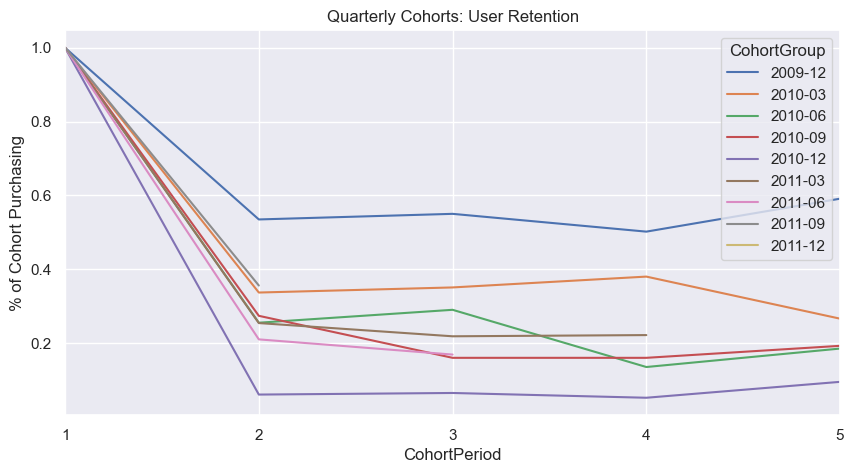

In [342]:
# user_retention[['2010-12', '2011-01', '2011-02', '2011-03', '2011-04', '2011-05', '2011-06', '2011-07', '2011-08','2011-09', '2011-10', '2011-11', '2011-12']].plot(figsize=(10,5))
user_retention[
    [
        "2009-12",
        "2010-03",
        "2010-06",
        "2010-09",
        "2010-12",
        "2011-03",
        "2011-06",
        "2011-09",
        "2011-12",
    ]
].plot(figsize=(10, 5))
plt.title("Quarterly Cohorts: User Retention")
plt.xticks(np.arange(1, 12.1, 1))
plt.xlim(1, 5)
plt.ylabel("% of Cohort Purchasing")
sns.set()


In [343]:
monret = salescsv.copy()
monret["OrderPeriod"] = monret.InvoiceDate.apply(
    lambda x: str(x.month) + "q" + str(x.quarter)
)  # Toggle
monret.set_index("CustomerID", inplace=True)


In [344]:
monret["CohortGroup"] = (
    monret.groupby(level=0)["InvoiceDate"].min().apply(lambda x: x.strftime("%Y-%m"))
)
monret.reset_index(inplace=True)


In [345]:
monret_group = monret.groupby(["CohortGroup", "OrderPeriod"])
# count the unique users, orders, and total revenue per Group + Period
monret_cohorts = monret_group.agg(
    {"CustomerID": pd.Series.nunique, "InvoiceNo": pd.Series.nunique, "Sales": np.sum}
)
# make the column names more meaningful
monret_cohorts.rename(
    columns={"CustomerID": "TotalCustomers", "InvoiceNo": "TotalOrders"}, inplace=True
)


In [346]:
def cohort_period(monret):
    monret["CohortPeriod"] = np.arange(len(monret)) + 1
    return monret


In [347]:
monret_cohorts = monret_cohorts.groupby(level=0, group_keys=False).apply(cohort_period)
# reindex the DataFrame
monret_cohorts.reset_index(inplace=True)
monret_cohorts.set_index(["CohortGroup", "CohortPeriod"], inplace=True)


In [348]:
# create a Series holding the total size of each CohortGroup
cohort_group_size = monret_cohorts["TotalCustomers"].groupby(level=0).first()


In [349]:
user_retention = (
    monret_cohorts["TotalCustomers"].unstack(0).divide(cohort_group_size, axis=1)
)


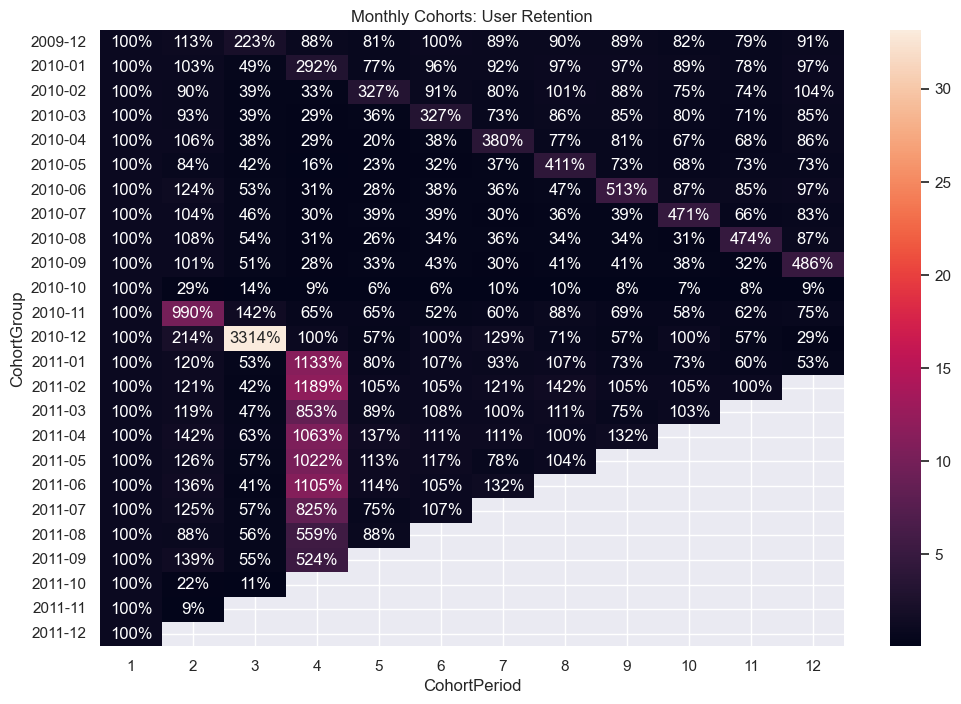

In [350]:
plt.figure(figsize=(12, 8))
plt.title("Monthly Cohorts: User Retention")
sns.heatmap(user_retention.T, mask=user_retention.T.isnull(), annot=True, fmt=".0%")
sns.set()


## COHORT Group  4 of 2011 Witnesses Striking Trend

#### This May be due to High Purchase Capacity New Customers

### Hence Demands TIME-SERIES Models Introspection

In [351]:
sales_yr_cohort


Sales
InvoiceYear CohortYear            
2009        2009         800567.77
2010        2009        4500355.00
            2010        5293089.40
2011        2009        3318000.85
            2010        3215901.01
            2011        2956916.66

In [352]:
c3_sales_yr_cohort = sales_yr_cohort.copy()


In [353]:
c3_sales_yr_cohort = c3_sales_yr_cohort.reset_index()
c3_sales_yr_cohort


,InvoiceYear,CohortYear,Sales
0,2009,2009,800567.77
1,2010,2009,4500355.00
2,2010,2010,5293089.40
3,2011,2009,3318000.85
4,2011,2010,3215901.01
5,2011,2011,2956916.66


In [354]:
syears = c3_sales_yr_cohort["InvoiceYear"].unique()
syears


array([2009, 2010, 2011], dtype=int64)

In [355]:
cohort_2009 = c3_sales_yr_cohort[c3_sales_yr_cohort["CohortYear"] == 2009]
sales_2009_cohort = cohort_2009["Sales"].to_list()
sales_2009_cohort


[800567.77, 4500355.0, 3318000.85]

In [356]:
cohort_2010 = c3_sales_yr_cohort[c3_sales_yr_cohort["CohortYear"] == 2010]
sales_2010_cohort = cohort_2010["Sales"].to_list()
sales_2010_cohort


[5293089.4, 3215901.0100000002]

In [357]:
sales_2011_cohort = c3_sales_yr_cohort[c3_sales_yr_cohort["CohortYear"] == 2011][
    "Sales"
].to_list()
sales_2011_cohort


[2956916.66]

In [358]:
c3_sales = {
    "2009 cohort": sales_2009_cohort,
    "2010 cohort": sales_2010_cohort,
    "2011 cohort": sales_2011_cohort,
}
# c3_sales = np.array(c3_sales)
c3_sales


{'2009 cohort': [800567.77, 4500355.0, 3318000.85],
 '2010 cohort': [5293089.4, 3215901.0100000002],
 '2011 cohort': [2956916.66]}

In [359]:
c3_sales_yr = pd.DataFrame(salescsv.groupby("InvoiceYear")["Sales"].sum())
c3_sales_yr


,Sales
InvoiceYear,
2009,800567.77
2010,9793444.40
2011,9490818.52


In [360]:
c3_sales_yr = c3_sales_yr
c3_sales_yr["2009 Cohort"] = [800567, 4500355, 3318001]
c3_sales_yr["2010 Cohort"] = [0, 5293089, 3215901]
c3_sales_yr["2011 Cohort"] = [0, 0, 2956917]


In [361]:
c3_sales_yr.transpose()


InvoiceYear,2009,2010,2011
Sales,800567.77,9793444.4,9490818.52
2009 Cohort,800567.00,4500355.0,3318001.00
2010 Cohort,0.00,5293089.0,3215901.00
2011 Cohort,0.00,0.0,2956917.00


In [362]:
round(cohort_prediction["P2012"], 2).sum()


7702486.03

In [363]:
round(cohort_prediction["P2012"], 2).sum() / 3


2567495.3433333333

In [364]:
(
    round(cohort_prediction["P2012"], 2).sum()
    + round(cohort_prediction["P2012"], 2).sum() / 3
)


10269981.373333333

In [365]:
round(cohort_prediction, 2)


,Unnamed: 0,CohortYear,P2012,percent_of_next_year_sales
0,0,2009,2322148.37,30.15
1,1,2010,3790896.20,49.22
2,2,2011,1589441.46,20.64


### P2012 Maroon Sales Prediction Zone Amounting Â£ 2567495 from to be predicted New Customers
#### is Arithmetic Mean of Cohorts 2010 & 2011 Customers
##### Actual Prediction Demands Time Series Models for Predicting New Customers Acquistions

# CUSTOMER COHORT CHART (C3) Checkpoint

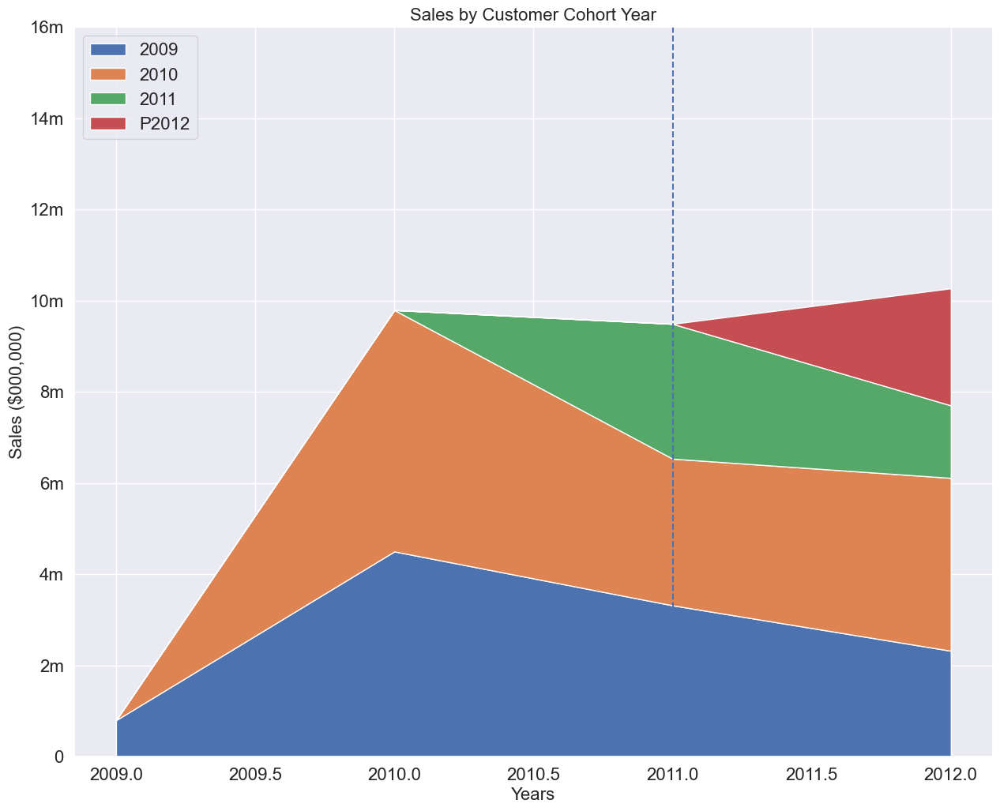

In [366]:
fig, ax = plt.subplots(figsize=(15, 12))
x = [2009, 2010, 2011, 2012]
y1 = [800567, 4500355, 3318001, 2322148]  # 2009
y2 = [0, 5293089, 3215901, 3790896]  # 2010
y3 = [0, 0, 2956917, 1589441]  # 2011
y4 = [0, 0, 0, 2567495]  # 2012

ax.stackplot(x, y1, y2, y3, y4, labels=["2009", "2010", "2011", "P2012"])
ax.legend(loc="upper left", fontsize=16)
ax.set_title("Sales by Customer Cohort Year", fontsize=16)
ax.set_xlabel("Years", fontsize=16)
ax.set_ylabel("Sales ($000,000)", fontsize=16)
plt.yticks(
    np.arange(0, 18000000, 2000000),
    labels=["0", "2m", "4m", "6m", "8m", "10m", "12m", "14m", "16m"],
    fontsize=16,
)
plt.xticks(
    fontsize=16,
)
plt.axvline(x=2011, ls="--", color="b")
plt.show()
sns.set()


In [367]:
session_info.show()


# ---------------------------------------------------------------------------

# Phase 2
## Market Basket Analysis

In [368]:
unique_desc = (
    retail[["StockCode", "Description"]]
    .groupby(by=["StockCode"])
    .apply(pd.DataFrame.mode)
    .reset_index(drop=True)
)


In [369]:
retailsql = retail.copy()


In [372]:
from pysqldf import SQLDF

retail_sqldf = SQLDF(globals())
retail_sqldf.execute("SELECT * FROM retailsql LIMIT 10;").head()


,level_0,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
0,0,13085,2009-12-01 00:00:00,12,6.95,83.40,Invoice,489434,85048,2009,12,15cm christmas glass ball 20 lights,United Kingdom
1,1,15485,2009-12-01 00:00:00,2,8.50,17.00,Invoice,489658,22192,2009,12,blue diner wall clock,United Kingdom
2,2,15485,2009-12-01 00:00:00,50,0.42,21.00,Invoice,489658,21498,2009,12,red spots wrap,United Kingdom
3,3,17246,2009-12-01 00:00:00,7,0.65,4.55,Invoice,489661,15036,2009,12,assorted colours silk fan,United Kingdom
4,4,12758,2009-12-01 00:00:00,16,1.25,20.00,Invoice,489599,20979,2009,12,36 pencils tube red spotty,Portugal


In [371]:
pip install pysqldf

In [373]:
retailsql_distincts = retailsql.apply(lambda x: x.unique().shape[0])


In [374]:
retailsql_distincts


index           1036427
CustomerID         8773
InvoiceDate         604
Quantity            498
UnitPrice           676
Sales              5635
InvoiceType           1
InvoiceNo         39509
StockCode          4874
InvoiceYear           3
InvoiceMonth         12
Description        5356
Country              43
dtype: int64

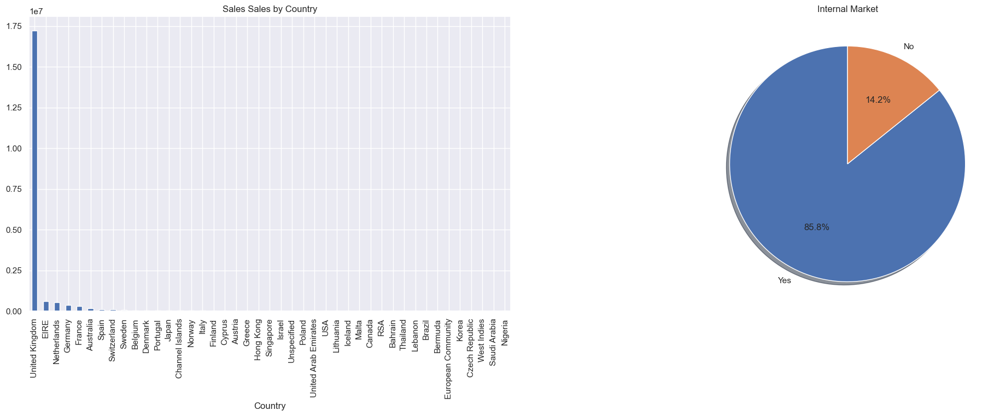

In [375]:
fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
g = (
    retailsql.groupby(["Country"])
    .Sales.sum()
    .sort_values(ascending=False)
    .plot(kind="bar", title="Sales Sales by Country")
)
retailsql["Internal"] = retailsql.Country.apply(
    lambda x: "Yes" if x == "United Kingdom" else "No"
)
f2 = fig.add_subplot(122)
market = retailsql.groupby(["Internal"]).Sales.sum().sort_values(ascending=False)
g = plt.pie(market, labels=market.index, autopct="%1.1f%%", shadow=True, startangle=90)
plt.title("Internal Market")
plt.show()


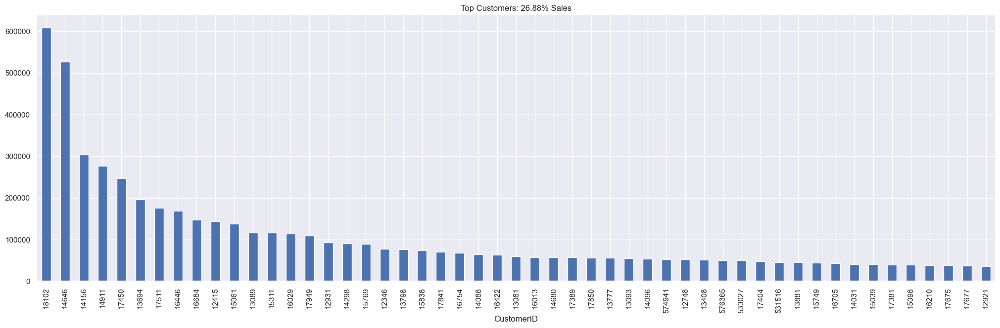

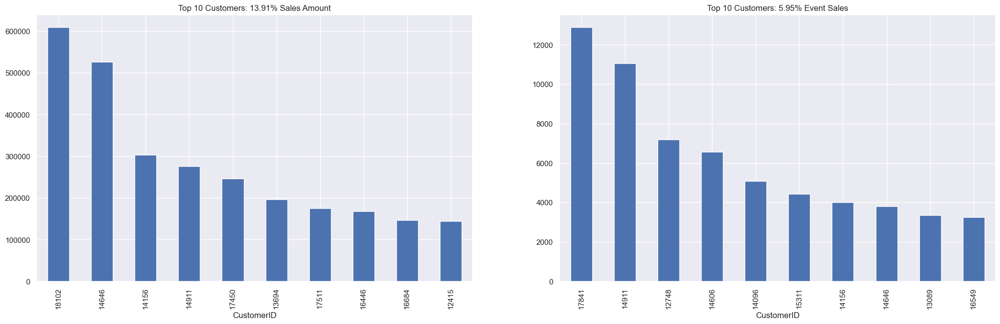

In [376]:
fig = plt.figure(figsize=(25, 7))
PercentSales = np.round(
    (
        retailsql.groupby(["CustomerID"])
        .Sales.sum()
        .sort_values(ascending=False)[:51]
        .sum()
        / retailsql.groupby(["CustomerID"])
        .Sales.sum()
        .sort_values(ascending=False)
        .sum()
    )
    * 100,
    2,
)
g = (
    retailsql.groupby(["CustomerID"])
    .Sales.sum()
    .sort_values(ascending=False)[:51]
    .plot(kind="bar", title="Top Customers: {:3.2f}% Sales".format(PercentSales))
)

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
PercentSales = np.round(
    (
        retailsql.groupby(["CustomerID"])
        .Sales.sum()
        .sort_values(ascending=False)[:10]
        .sum()
        / retailsql.groupby(["CustomerID"])
        .Sales.sum()
        .sort_values(ascending=False)
        .sum()
    )
    * 100,
    2,
)
g = (
    retailsql.groupby(["CustomerID"])
    .Sales.sum()
    .sort_values(ascending=False)[:10]
    .plot(
        kind="bar", title="Top 10 Customers: {:3.2f}% Sales Amount".format(PercentSales)
    )
)
f1 = fig.add_subplot(122)
PercentSales = np.round(
    (
        retailsql.groupby(["CustomerID"])
        .Sales.count()
        .sort_values(ascending=False)[:10]
        .sum()
        / retailsql.groupby(["CustomerID"])
        .Sales.count()
        .sort_values(ascending=False)
        .sum()
    )
    * 100,
    2,
)
g = (
    retailsql.groupby(["CustomerID"])
    .Sales.count()
    .sort_values(ascending=False)[:10]
    .plot(
        kind="bar", title="Top 10 Customers: {:3.2f}% Event Sales".format(PercentSales)
    )
)


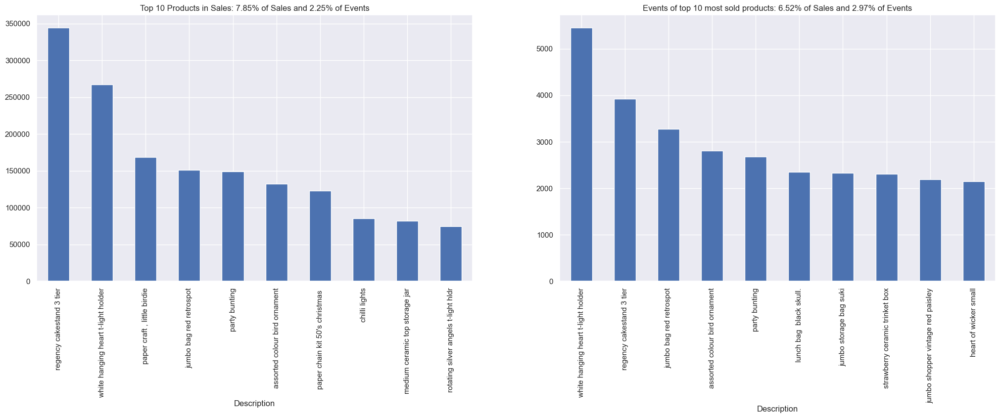

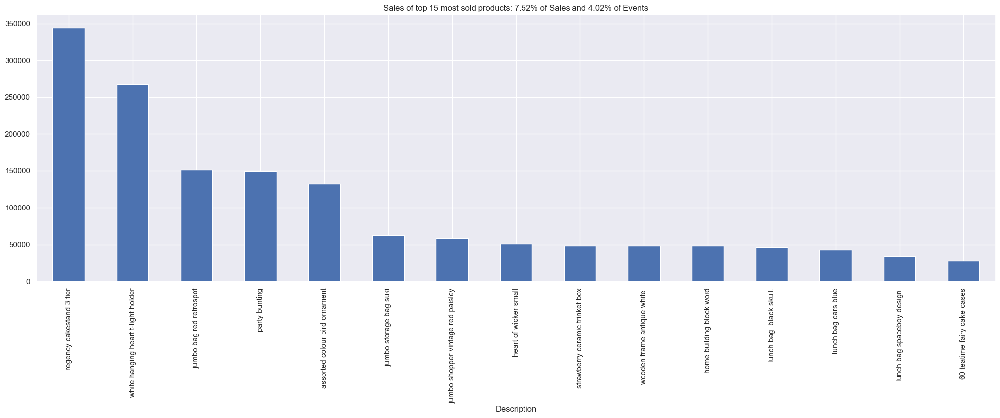

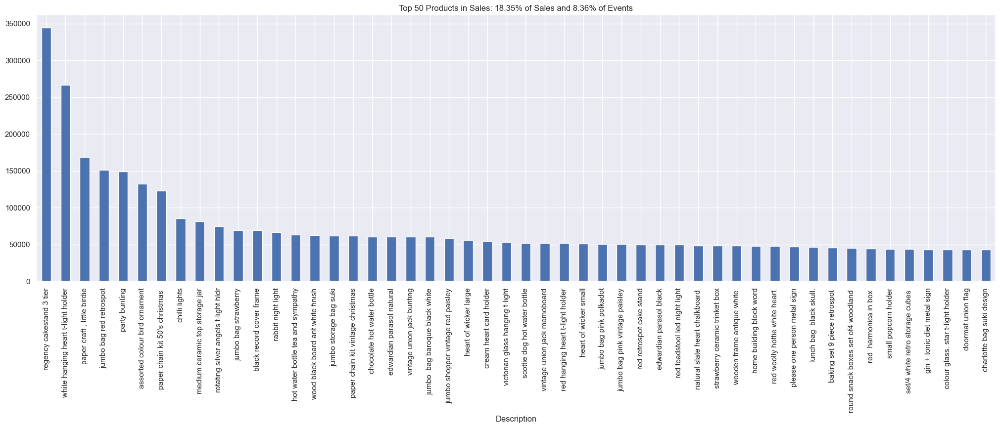

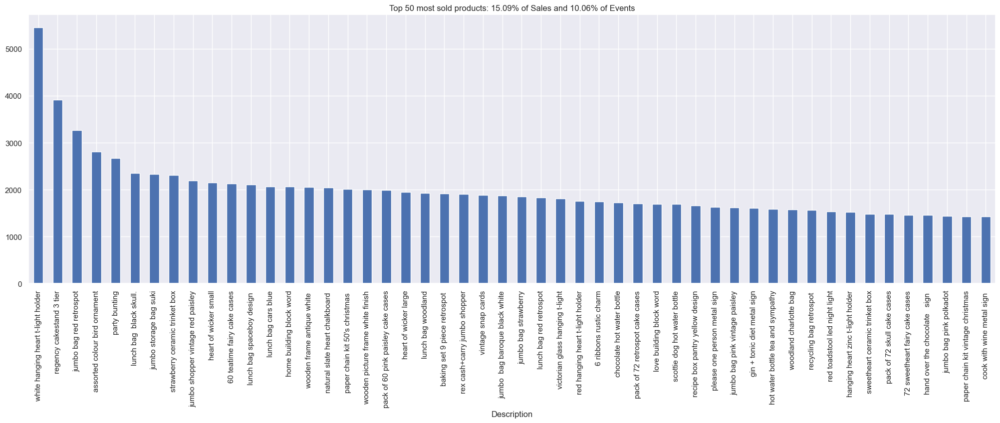

In [377]:
SalesSum = retailsql.groupby(["Description"]).Sales.sum().sort_values(ascending=False)
inv = (
    retailsql[["Description", "InvoiceNo"]]
    .groupby(["Description"])
    .InvoiceNo.unique()
    .agg(np.size)
    .sort_values(ascending=False)
)

fig = plt.figure(figsize=(25, 7))
f1 = fig.add_subplot(121)
Top10 = list(SalesSum[:10].index)
PercentSales = np.round((SalesSum[Top10].sum() / SalesSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10].sum() / inv.sum()) * 100, 2)
g = SalesSum[Top10].plot(
    kind="bar",
    title="Top 10 Products in Sales: {:3.2f}% of Sales and {:3.2f}% of Events".format(
        PercentSales, PercentEvents
    ),
)

f1 = fig.add_subplot(122)
Top10Ev = list(inv[:10].index)
PercentSales = np.round((SalesSum[Top10Ev].sum() / SalesSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top10Ev].sum() / inv.sum()) * 100, 2)
g = inv[Top10Ev].plot(
    kind="bar",
    title="Events of top 10 most sold products: {:3.2f}% of Sales and {:3.2f}% of Events".format(
        PercentSales, PercentEvents
    ),
)


fig = plt.figure(figsize=(25, 7))
Top15ev = list(inv[:15].index)
PercentSales = np.round((SalesSum[Top15ev].sum() / SalesSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top15ev].sum() / inv.sum()) * 100, 2)
g = (
    SalesSum[Top15ev]
    .sort_values(ascending=False)
    .plot(
        kind="bar",
        title="Sales of top 15 most sold products: {:3.2f}% of Sales and {:3.2f}% of Events".format(
            PercentSales, PercentEvents
        ),
    )
)

fig = plt.figure(figsize=(25, 7))
Top50 = list(SalesSum[:50].index)
PercentSales = np.round((SalesSum[Top50].sum() / SalesSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50].sum() / inv.sum()) * 100, 2)
g = SalesSum[Top50].plot(
    kind="bar",
    title="Top 50 Products in Sales: {:3.2f}% of Sales and {:3.2f}% of Events".format(
        PercentSales, PercentEvents
    ),
)

fig = plt.figure(figsize=(25, 7))
Top50Ev = list(inv[:50].index)
PercentSales = np.round((SalesSum[Top50Ev].sum() / SalesSum.sum()) * 100, 2)
PercentEvents = np.round((inv[Top50Ev].sum() / inv.sum()) * 100, 2)
g = inv[Top50Ev].plot(
    kind="bar",
    title="Top 50 most sold products: {:3.2f}% of Sales and {:3.2f}% of Events".format(
        PercentSales, PercentEvents
    ),
)


In [380]:
# Calculate the reference date by adding 1 day to the maximum date in InvoiceDate
reference_date = retailsql.InvoiceDate.max() + dt.timedelta(days=1)
print("Reference Date:", reference_date)

# Calculate the days since the last purchase by subtracting InvoiceDate from reference_date
# and extracting the days component directly
retailsql["days_since_last_purchase"] = (reference_date - retailsql.InvoiceDate).dt.days

# Group by CustomerID and find the minimum days_since_last_purchase (i.e., most recent)
customer_history_df = (
    retailsql[["CustomerID", "days_since_last_purchase"]]
    .groupby("CustomerID")
    .min()
    .reset_index()
)

# Rename the column to 'recency' and describe the DataFrame
customer_history_df.rename(
    columns={"days_since_last_purchase": "recency"}, inplace=True
)
customer_history_df.describe().transpose()


Reference Date: 2011-12-10 00:00:00


,count,mean,std,min,25%,50%,75%,max
CustomerID,8773.0,187424.955773,244061.325654,12346.0,14577.0,16800.0,510361.0,581498.0
recency,8773.0,262.138037,225.900045,1.0,45.0,214.0,436.0,739.0


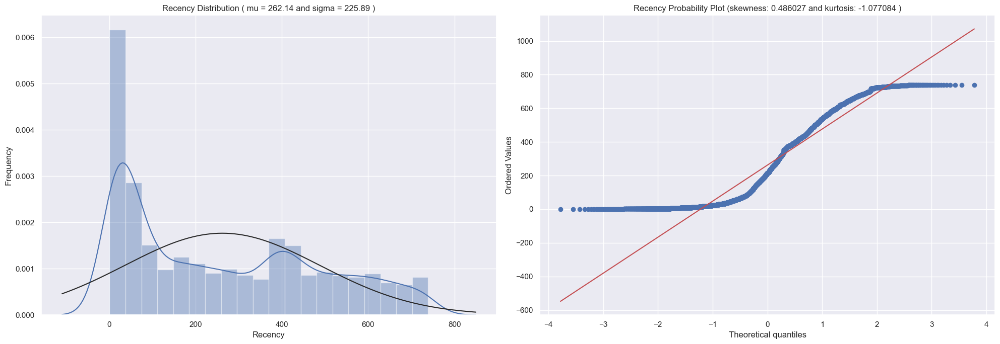

In [381]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20, 7))

    # Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    # Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(
        measure + " Distribution ( mu = {:.2f} and sigma = {:.2f} )".format(mu, sigma),
        loc="center",
    )
    fig1.set_xlabel(measure)
    fig1.set_ylabel("Frequency")

    # QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(
        measure
        + " Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )".format(
            data.skew(), data.kurt()
        ),
        loc="center",
    )

    plt.tight_layout()
    plt.show()


QQ_plot(customer_history_df.recency, "Recency")


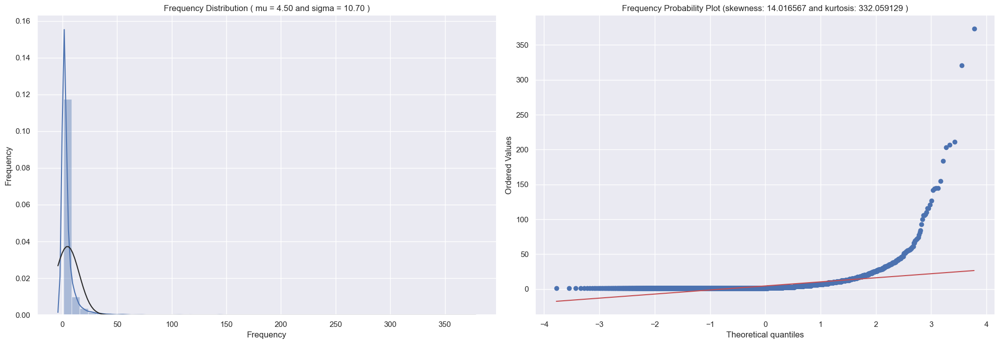

In [382]:
customer_freq = (
    (
        retailsql[["CustomerID", "InvoiceNo"]]
        .groupby(["CustomerID", "InvoiceNo"])
        .count()
        .reset_index()
    )
    .groupby(["CustomerID"])
    .count()
    .reset_index()
)
customer_freq.rename(columns={"InvoiceNo": "frequency"}, inplace=True)
customer_history_df = customer_history_df.merge(customer_freq)
QQ_plot(customer_history_df.frequency, "Frequency")


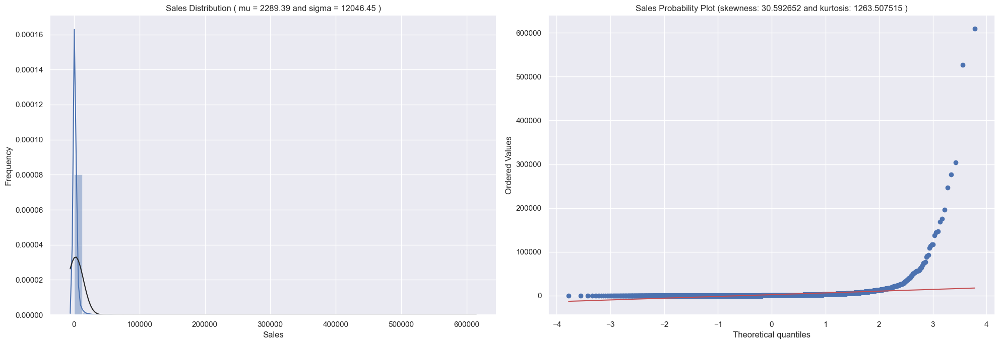

In [387]:
customer_monetary_val = (
    retailsql[["CustomerID", "Sales"]].groupby("CustomerID").sum().reset_index()
)
customer_history_df = customer_history_df.merge(customer_monetary_val)
QQ_plot(customer_history_df.Sales, "Sales")


In [388]:
customer_history_df.describe()


,CustomerID,recency,frequency,Sales
count,8773.000000,8773.000000,8773.000000,8773.000000
mean,187424.955773,262.138037,4.503477,2289.391393
std,244061.325654,225.900045,10.696978,12047.137879
min,12346.000000,1.000000,1.000000,0.190000
25%,14577.000000,45.000000,1.000000,189.500000
50%,16800.000000,214.000000,1.000000,651.400000
75%,510361.000000,436.000000,4.000000,1781.280000
max,581498.000000,739.000000,373.000000,608821.650000


In [389]:
import math

In [390]:
customer_history_df["recency_log"] = customer_history_df["recency"].apply(math.log)
customer_history_df["frequency_log"] = customer_history_df["frequency"].apply(math.log)
customer_history_df["Sales_log"] = customer_history_df["Sales"].apply(math.log)
feature_vector = ["Sales_log", "recency_log", "frequency_log"]
X_subset = customer_history_df[feature_vector]  # .as_matrix()
scaler = preprocessing.StandardScaler().fit(X_subset)
X_scaled = scaler.transform(X_subset)
pd.DataFrame(X_scaled, columns=X_subset.columns).describe().T


,count,mean,std,min,25%,50%,75%,max
Sales_log,8773.0,1.101491e-16,1.000057,-3.905344,-0.463133,0.152384,0.653858,3.562211
recency_log,8773.0,-7.451263e-16,1.000057,-3.154969,-0.674078,0.342164,0.805973,1.149859
frequency_log,8773.0,-8.423167e-17,1.000057,-0.791013,-0.791013,-0.791013,0.579878,5.064770


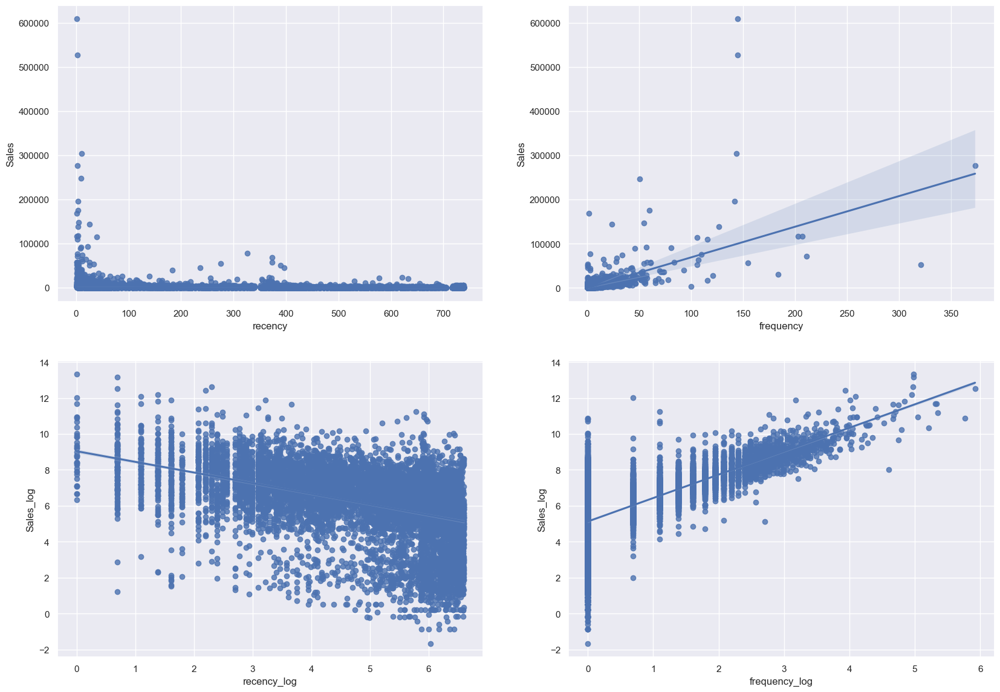

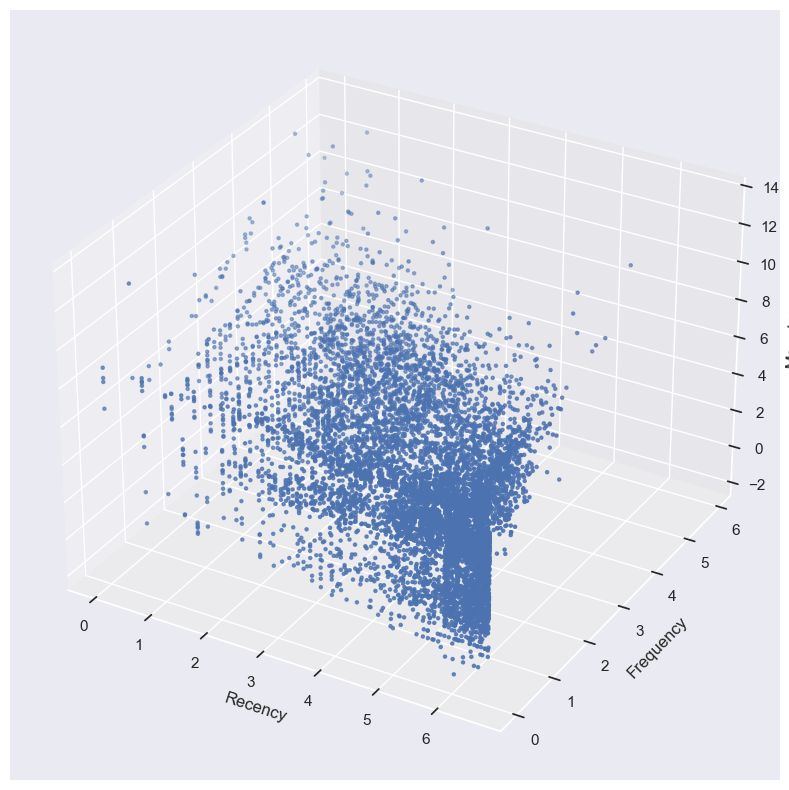

In [391]:
fig = plt.figure(figsize=(20, 14))
f1 = fig.add_subplot(221)
sns.regplot(x="recency", y="Sales", data=customer_history_df)
f1 = fig.add_subplot(222)
sns.regplot(x="frequency", y="Sales", data=customer_history_df)
f1 = fig.add_subplot(223)
sns.regplot(x="recency_log", y="Sales_log", data=customer_history_df)
f1 = fig.add_subplot(224)
sns.regplot(x="frequency_log", y="Sales_log", data=customer_history_df)

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection="3d")

xs = customer_history_df.recency_log
ys = customer_history_df.frequency_log
zs = customer_history_df.Sales_log
ax.scatter(xs, ys, zs, s=5)

ax.set_xlabel("Recency")
ax.set_ylabel("Frequency")
ax.set_zlabel("Monetary")

plt.show()


### K-Means Clustering for Segmentation

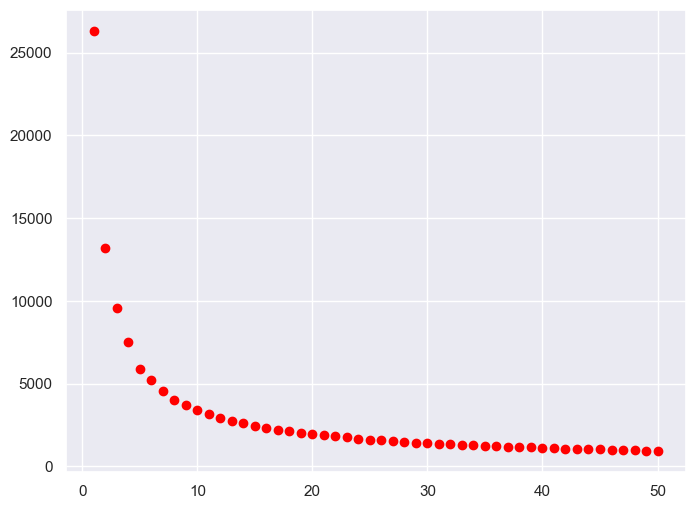

The best K suggests:  8


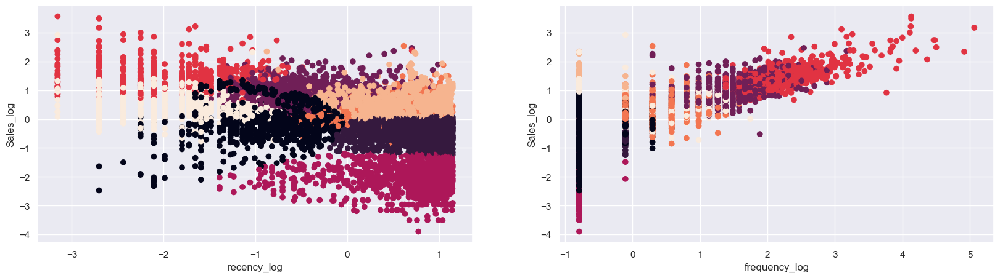

In [392]:
cl = 50
corte = 0.1

anterior = 100000000000000
cost = []
K_best = cl

for k in range(1, cl + 1):
    # Create a kmeans model on our data, using k clusters.  random_state helps ensure that the algorithm returns the same results each time.
    model = KMeans(
        n_clusters=k,
        init="k-means++",  #'random',
        n_init=10,
        max_iter=300,
        tol=1e-04,
        random_state=101,
    )

    model = model.fit(X_scaled)

    # These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
    labels = model.labels_

    # Sum of distances of samples to their closest cluster center
    interia = model.inertia_
    if (K_best == cl) and (((anterior - interia) / anterior) < corte):
        K_best = k - 1
    cost.append(interia)
    anterior = interia

plt.figure(figsize=(8, 6))
plt.scatter(range(1, cl + 1), cost, c="red")
plt.show()

# Create a kmeans model with the best K.
print("The best K suggests: ", K_best)
model = KMeans(
    n_clusters=K_best,
    init="k-means++",
    n_init=10,
    max_iter=300,
    tol=1e-04,
    random_state=101,
)

# Note I'm scaling the data to normalize it! Important for good results.
model = model.fit(X_scaled)

# These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
labels = model.labels_

# And we'll visualize it:
# plt.scatter(X_scaled[:,0], X_scaled[:,1], c=model.labels_.astype(float))
fig = plt.figure(figsize=(20, 5))
ax = fig.add_subplot(121)
plt.scatter(x=X_scaled[:, 1], y=X_scaled[:, 0], c=model.labels_.astype(float))
ax.set_xlabel(feature_vector[1])
ax.set_ylabel(feature_vector[0])
ax = fig.add_subplot(122)
plt.scatter(x=X_scaled[:, 2], y=X_scaled[:, 0], c=model.labels_.astype(float))
ax.set_xlabel(feature_vector[2])
ax.set_ylabel(feature_vector[0])

plt.show()


#### Silhouette analysis on K-Means clustering

In [393]:
import matplotlib.cm as cm


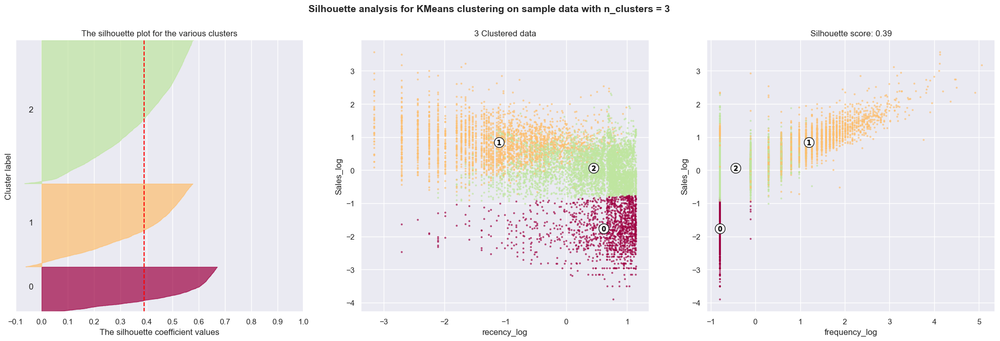

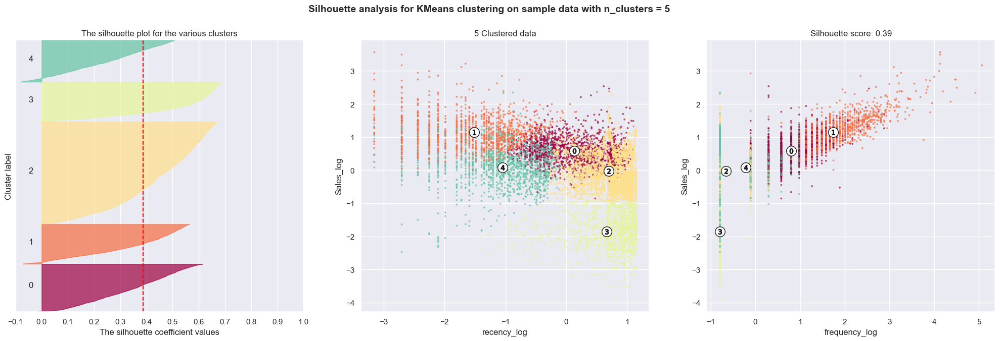

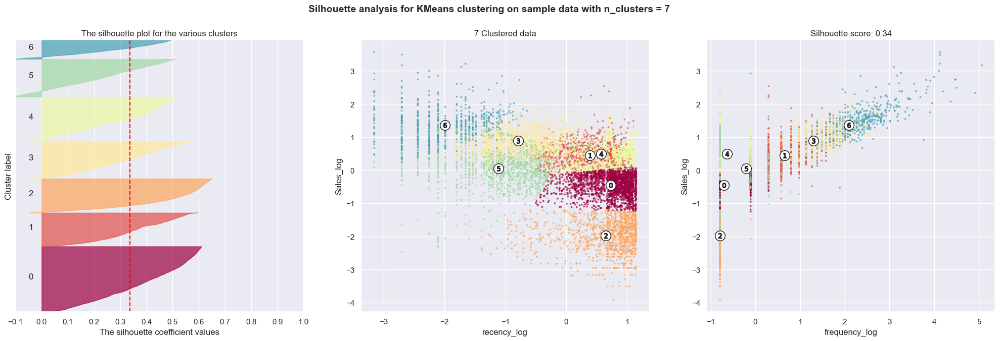

In [394]:
cluster_centers = dict()

for n_clusters in range(3, K_best + 1, 2):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(25, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    clusterer = KMeans(
        n_clusters=n_clusters,
        init="k-means++",
        n_init=10,
        max_iter=300,
        tol=1e-04,
        random_state=101,
    )
    cluster_labels = clusterer.fit_predict(X_scaled)

    silhouette_avg = silhouette_score(X=X_scaled, labels=cluster_labels)
    cluster_centers.update(
        {
            n_clusters: {
                "cluster_center": clusterer.cluster_centers_,
                "silhouette_score": silhouette_avg,
                "labels": cluster_labels,
            }
        }
    )

    sample_silhouette_values = silhouette_samples(X=X_scaled, labels=cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    colors = cm.Spectral(cluster_labels.astype(float) / n_clusters)

    centers = clusterer.cluster_centers_
    y = 0
    x = 1
    ax2.scatter(
        X_scaled[:, x],
        X_scaled[:, y],
        marker=".",
        s=30,
        lw=0,
        alpha=0.7,
        c=colors,
        edgecolor="k",
    )
    ax2.scatter(
        centers[:, x],
        centers[:, y],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )
    for i, c in enumerate(centers):
        ax2.scatter(c[x], c[y], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")
    ax2.set_title("{} Clustered data".format(n_clusters))
    ax2.set_xlabel(feature_vector[x])
    ax2.set_ylabel(feature_vector[y])

    x = 2
    ax3.scatter(
        X_scaled[:, x],
        X_scaled[:, y],
        marker=".",
        s=30,
        lw=0,
        alpha=0.7,
        c=colors,
        edgecolor="k",
    )
    ax3.scatter(
        centers[:, x],
        centers[:, y],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )
    for i, c in enumerate(centers):
        ax3.scatter(c[x], c[y], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")
    ax3.set_title(
        "Silhouette score: {:1.2f}".format(
            cluster_centers[n_clusters]["silhouette_score"]
        )
    )
    ax3.set_xlabel(feature_vector[x])
    ax3.set_ylabel(feature_vector[y])

    plt.suptitle(
        (
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters
        ),
        fontsize=14,
        fontweight="bold",
    )
    plt.show()


In [395]:
features = ["Sales", "recency", "frequency"]
for i in range(3, K_best + 1, 2):
    print(
        "for {} clusters the silhouette score is {:1.2f}".format(
            i, cluster_centers[i]["silhouette_score"]
        )
    )
    print("Centers of each cluster:")
    cent_transformed = scaler.inverse_transform(cluster_centers[i]["cluster_center"])
    print(pd.DataFrame(np.exp(cent_transformed), columns=features))
    print("-" * 50)


for 3 clusters the silhouette score is 0.39
Centers of each cluster:
         Sales     recency  frequency
0    14.130848  327.383204   1.002882
1  2577.907309   23.236250   7.441278
2   543.251575  251.293349   1.417874
--------------------------------------------------
for 5 clusters the silhouette score is 0.39
Centers of each cluster:
         Sales     recency  frequency
0  1525.024499  156.057578   5.019642
1  4751.666093   12.437317  12.988600
2   449.604248  367.455315   1.141204
3    11.640179  349.223733   1.002718
4   568.453638   25.520321   1.790380
--------------------------------------------------
for 7 clusters the silhouette score is 0.34
Centers of each cluster:
         Sales     recency  frequency
0   195.007333  387.054645   1.093602
1  1174.958262  231.877883   4.320627
2     9.082772  341.157055   1.001259
3  2825.970370   37.801842   8.242414
4  1270.216051  304.331217   1.169829
5   536.620509   22.871239   1.815371
6  7335.457771    5.955758  18.511982
-------

,CustomerID,recency,frequency,Sales,recency_log,frequency_log,Sales_log,clusters_3,clusters_5,clusters_7
0,12346,326,3,77352.96,5.786897,1.098612,11.256134,1,0,1
1,12347,3,8,5633.32,1.098612,2.079442,8.636454,1,1,6
2,12348,76,5,1658.40,4.330733,1.609438,7.413609,1,0,3
3,12349,19,3,3678.69,2.944439,1.098612,8.210312,1,4,5
4,12350,311,1,294.40,5.739793,0.000000,5.684939,2,2,0


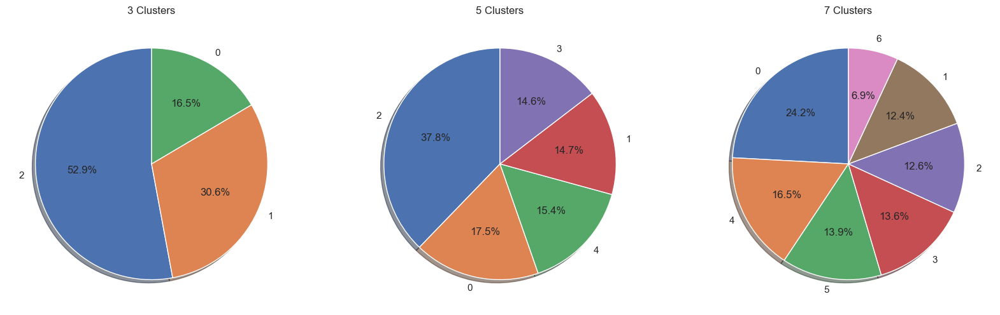

In [396]:
customer_history_df["clusters_3"] = cluster_centers[3]["labels"]
customer_history_df["clusters_5"] = cluster_centers[5]["labels"]
customer_history_df["clusters_7"] = cluster_centers[7]["labels"]
display(customer_history_df.head())

fig = plt.figure(figsize=(20, 7))
f1 = fig.add_subplot(131)
market = customer_history_df.clusters_3.value_counts()
g = plt.pie(market, labels=market.index, autopct="%1.1f%%", shadow=True, startangle=90)
plt.title("3 Clusters")
f1 = fig.add_subplot(132)
market = customer_history_df.clusters_5.value_counts()
g = plt.pie(market, labels=market.index, autopct="%1.1f%%", shadow=True, startangle=90)
plt.title("5 Clusters")
f1 = fig.add_subplot(133)
market = customer_history_df.clusters_7.value_counts()
g = plt.pie(market, labels=market.index, autopct="%1.1f%%", shadow=True, startangle=90)
plt.title("7 Clusters")
plt.show()


## Association Rule-Mining

In [397]:
items = list(retailsql.Description.unique())
grouped = retailsql.groupby("InvoiceNo")
transaction_level = grouped.aggregate(lambda x: tuple(x)).reset_index()[
    ["InvoiceNo", "Description"]
]
transaction_dict = {item: 0 for item in items}
output_dict = dict()
temp = dict()
for rec in transaction_level.to_dict("records"):
    invoice_num = rec["InvoiceNo"]
    items_list = rec["Description"]
    transaction_dict = {item: 0 for item in items}
    transaction_dict.update({item: 1 for item in items if item in items_list})
    temp.update({invoice_num: transaction_dict})

new = [v for k, v in temp.items()]
transaction_df = pd.DataFrame(new)


In [398]:
def prune_dataset(
    input_df,
    length_trans=2,
    total_sales_perc=0.5,
    start_item=None,
    end_item=None,
    TopCols=None,
):
    if "total_items" in input_df.columns:
        del input_df["total_items"]
    item_count = input_df.sum().sort_values(ascending=False).reset_index()
    total_items = sum(input_df.sum().sort_values(ascending=False))
    item_count.rename(
        columns={
            item_count.columns[0]: "item_name",
            item_count.columns[1]: "item_count",
        },
        inplace=True,
    )
    if TopCols:
        input_df["total_items"] = input_df[TopCols].sum(axis=1)
        input_df = input_df[input_df.total_items >= length_trans]
        del input_df["total_items"]
        return input_df[TopCols], item_count[item_count.item_name.isin(TopCols)]
    elif end_item > start_item:
        selected_items = list(item_count[start_item:end_item].item_name)
        input_df["total_items"] = input_df[selected_items].sum(axis=1)
        input_df = input_df[input_df.total_items >= length_trans]
        del input_df["total_items"]
        return input_df[selected_items], item_count[start_item:end_item]
    else:
        item_count["item_perc"] = item_count["item_count"] / total_items
        item_count["total_perc"] = item_count.item_perc.cumsum()
        selected_items = list(
            item_count[item_count.total_perc < total_sales_perc].item_name
        )
        input_df["total_items"] = input_df[selected_items].sum(axis=1)
        input_df = input_df[input_df.total_items >= length_trans]
        del input_df["total_items"]
        return (
            input_df[selected_items],
            item_count[item_count.total_perc < total_sales_perc],
        )


In [399]:
output_df, item_counts = prune_dataset(
    input_df=transaction_df, length_trans=2, start_item=0, end_item=15
)
print(
    "Total Sales by the Top 15 Products in Sales Events (Invoice): {:.2f}".format(
        SalesSum[Top15ev].sum()
    )
)
print("Number of Sales Events:", output_df.shape[0])
print("Number of Products:", output_df.shape[1])

item_counts


Total Sales by the Top 15 Products in Sales Events (Invoice): 1510559.96
Number of Sales Events: 9761
Number of Products: 15


,item_name,item_count
0,white hanging heart t-light holder,5455
1,regency cakestand 3 tier,3918
2,jumbo bag red retrospot,3269
3,assorted colour bird ornament,2807
4,party bunting,2674
5,lunch bag black skull.,2351
6,jumbo storage bag suki,2329
7,strawberry ceramic trinket box,2310
8,jumbo shopper vintage red paisley,2192
9,heart of wicker small,2151


#### Frequent Pattern Growth Algorithm

In [402]:
support = 0.01
print("num of required transactions = ", int(output_df.shape[0] * support))
num_trans = output_df.shape[0] * support

# compute the frequent itemsets using fpgriowth from mlxtend
from mlxtend.frequent_patterns.fpgrowth import fpgrowth

frequent_itemsets = fpgrowth(output_df, min_support=support, use_colnames=True)

# print the frequent itemsets
frequent_itemsets


num of required transactions =  97


,support,itemsets
0,0.193833,(assorted colour bird ornament)
1,0.158078,(home building block word)
2,0.381826,(white hanging heart t-light holder)
3,0.183076,(lunch bag cars blue)
4,0.173958,(strawberry ceramic trinket box)
...,...,...
308,0.010347,"(regency cakestand 3 tier, jumbo storage bag s..."
309,0.016904,"(jumbo storage bag suki, heart of wicker small..."
310,0.010552,"(white hanging heart t-light holder, heart of ..."
311,0.018543,"(white hanging heart t-light holder, heart of ..."


In [401]:
pip install mlxtend

In [403]:
# Compute the association rules based on the frequent itemsets
from mlxtend.frequent_patterns import association_rules

# compute and print the association rules
retail_association = association_rules(
    frequent_itemsets, metric="confidence", min_threshold=0.6
)
retail_association


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,"(lunch bag cars blue, lunch bag black skull.,...",(jumbo storage bag suki),0.016802,0.211044,0.011577,0.689024,3.264838,0.008031,2.537035,0.705561
1,"(jumbo shopper vintage red paisley, lunch bag ...",(jumbo storage bag suki),0.019055,0.211044,0.012294,0.645161,3.057000,0.008272,2.223422,0.685953
2,"(60 teatime fairy cake cases, wooden frame ant...",(white hanging heart t-light holder),0.022436,0.381826,0.013523,0.602740,1.578573,0.004956,1.556094,0.374929
3,"(jumbo storage bag suki, jumbo shopper vintage...",(jumbo bag red retrospot),0.091896,0.260322,0.056142,0.610925,2.346809,0.032219,1.901122,0.631965
4,"(jumbo storage bag suki, white hanging heart t...",(jumbo bag red retrospot),0.022846,0.260322,0.014753,0.645740,2.480546,0.008805,2.087953,0.610818
5,"(jumbo shopper vintage red paisley, lunch bag ...",(jumbo storage bag suki),0.019875,0.211044,0.012089,0.608247,2.882089,0.007894,2.013914,0.666272
6,"(jumbo storage bag suki, lunch bag spaceboy de...",(lunch bag black skull.),0.019568,0.205819,0.012294,0.628272,3.052546,0.008266,2.136459,0.685825
7,"(regency cakestand 3 tier, lunch bag spaceboy ...",(lunch bag black skull.),0.014957,0.205819,0.010040,0.671233,3.261276,0.006961,2.415634,0.703900
8,"(heart of wicker small, jumbo shopper vintage ...",(jumbo bag red retrospot),0.026227,0.260322,0.016084,0.613281,2.355859,0.009257,1.912704,0.591027


In [370]:
retail_association.to_csv("retail_association.csv")


# PHASE 3: TIME SERIES ANALYSIS
## on Online Retail Dataset

In [404]:
import itertools

import scipy.stats as stats
from scipy import signal


In [405]:
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split


In [406]:
# Required datasets: #salescsv  #rfm
tsales = salescsv.copy()
tsales.drop(["CohortYear"], axis=1, inplace=True)
tsarfm = pd.read_csv("rfm.csv")
tsarfm.drop(["Unnamed: 0"], axis=1, inplace=True)
tsaret = merge_dfs(tsales, [tsarfm], key="CustomerID")


In [407]:
# tsaret['InvoiceNo'] = tsaret['InvoiceNo'].map(lambda x: x.lstrip('INV'))
tsaret = tsaret.join(pd.get_dummies(tsaret["Country"]))
# tsaret['InvoiceDate'] = pd.to_numeric(pd.to_datetime(tsaret['InvoiceDate']))
tsaret.drop("Country", axis=1, inplace=True)
tsaret.head()


,CustomerID,Purchases,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,...,Portugal,Singapore,Spain,Sweden,Switzerland,Thailand,USA,United Arab Emirates,United Kingdom,Unspecified
0,13085,8,2009-12-01,12,6.95,83.40,Invoice,489434,85048,2009,...,False,False,False,False,False,False,False,False,True,False
1,15485,7,2009-12-01,2,8.50,17.00,Invoice,489658,22192,2009,...,False,False,False,False,False,False,False,False,True,False
2,15485,7,2009-12-01,50,0.42,21.00,Invoice,489658,21498,2009,...,False,False,False,False,False,False,False,False,True,False
3,17246,2,2009-12-01,7,0.65,4.55,Invoice,489661,15036,2009,...,False,False,False,False,False,False,False,False,True,False
4,12758,7,2009-12-01,16,1.25,20.00,Invoice,489599,20979,2009,...,True,False,False,False,False,False,False,False,False,False


In [408]:
# sns.pairplot(tsarfm, hue="frequency");


In [409]:
def show_scatter(tsarfm):
    pd.plotting.scatter_matrix(tsarfm, figsize=(15, 10))
    plt.show()
    return tsarfm


In [410]:
# scatter_plots = show_scatter(tsarfm)


In [411]:
tsaret_column_headers = list(tsaret.columns.values)
# tsaret_column_headers


In [412]:
# Set feature and target matrix
X = tsaret[
    [  #'CustomerID',
        "Purchases",
        #'InvoiceDate',
        #'InvoiceNo',
        #'InvoiceYear',
        #'InvoiceMonth',
        "frequency",
        "recency",
        "T",
        "monetary_value",
        "probability_alive",
        "predicted_purchases",
        "Australia",
        "Austria",
        "Belgium",
        "Canada",
        "Channel Islands",
        "Cyprus",
        "Czech Republic",
        "Denmark",
        "EIRE",
        "European Community",
        "Finland",
        "France",
        "Germany",
        "Greece",
        "Iceland",
        "Israel",
        "Italy",
        "Japan",
        "Lithuania",
        "Malta",
        "Netherlands",
        "Norway",
        "Poland",
        "Portugal",
        "Singapore",
        "Spain",
        "Sweden",
        "Switzerland",
        "USA",
        #'United Arab Emirates',
        "United Kingdom",
        "Unspecified",
    ]
]
y = tsaret["Sales"]


In [413]:
X.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 764063 entries, 0 to 764062
Data columns (total 38 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Purchases            764063 non-null  int64  
 1   frequency            764063 non-null  float64
 2   recency              764063 non-null  float64
 3   T                    764063 non-null  float64
 4   monetary_value       764063 non-null  float64
 5   probability_alive    764063 non-null  float64
 6   predicted_purchases  764063 non-null  float64
 7   Australia            764063 non-null  bool   
 8   Austria              764063 non-null  bool   
 9   Belgium              764063 non-null  bool   
 10  Canada               764063 non-null  bool   
 11  Channel Islands      764063 non-null  bool   
 12  Cyprus               764063 non-null  bool   
 13  Czech Republic       764063 non-null  bool   
 14  Denmark              764063 non-null  bool   
 15  EIRE             

In [414]:
y.info()


<class 'pandas.core.series.Series'>
RangeIndex: 764063 entries, 0 to 764062
Series name: Sales
Non-Null Count   Dtype  
--------------   -----  
764063 non-null  float64
dtypes: float64(1)
memory usage: 5.8 MB


In [415]:
# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y)


### Ordinary Least Square Model

In [416]:
def LinReg_model(X_train, X_test, y_train, y_test):
    model = LinearRegression()
    model.fit(X_train, y_train)
    yhat = model.predict(X_test)
    print(yhat, "\n\n")
    mse = mean_squared_error(y_test, yhat)
    print("mse = ", mse)
    rmse = np.sqrt(mse)
    print("rmse = ", rmse, "dollars")
    model = sm.OLS(y, X.astype(float))
    results = model.fit()
    print(results.summary())
    ypred = results.predict()
    print("Linear Regression prediction using OLS = ", ypred.sum())
    return results


In [417]:
linreg = LinReg_model(X_train, X_test, y_train, y_test)


[ 17.5717479    2.29114301 -13.68316064 ...  36.01892019  19.15094272
 -36.53490481] 


mse =  10310.924009408214
rmse =  101.5427201201948 dollars
                                 OLS Regression Results                                
Dep. Variable:                  Sales   R-squared (uncentered):                   0.129
Model:                            OLS   Adj. R-squared (uncentered):              0.129
Method:                 Least Squares   F-statistic:                              2989.
Date:                Sun, 27 Oct 2024   Prob (F-statistic):                        0.00
Time:                        23:43:22   Log-Likelihood:                     -5.1676e+06
No. Observations:              764063   AIC:                                  1.034e+07
Df Residuals:                  764025   BIC:                                  1.034e+07
Df Model:                          38                                                  
Covariance Type:            nonrobust                       

In [418]:
def plot_features(X, target):
    X_cols = X[
        [
            "Purchases",
            "frequency",
            "recency",
            "T",
            #'monetary_value',
            "probability_alive",
            "predicted_purchases",
        ]
    ]
    # X.columns
    for col in X_cols:
        tsaret.plot(kind="scatter", y=target, x=col, color="seagreen", figsize=(12, 5))
        plt.xlabel(col)
        plt.ylabel(target)
        plt.ylim(0, 10000)
        plt.show()
    return plt


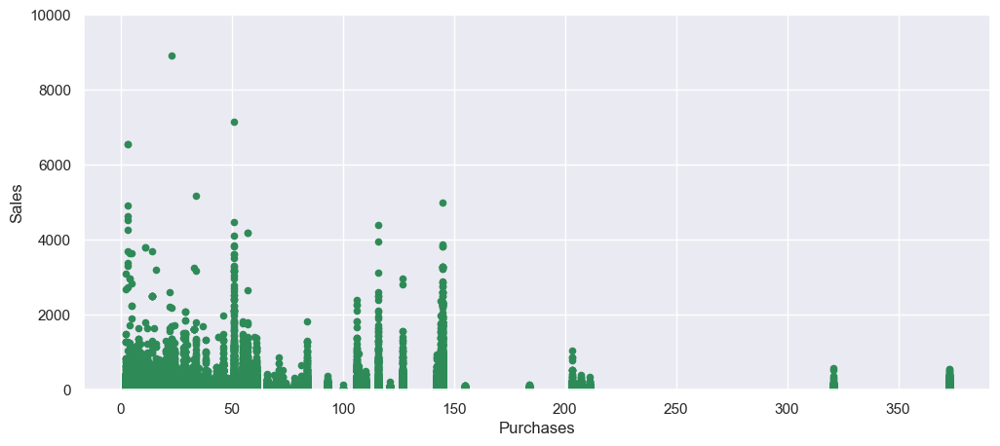

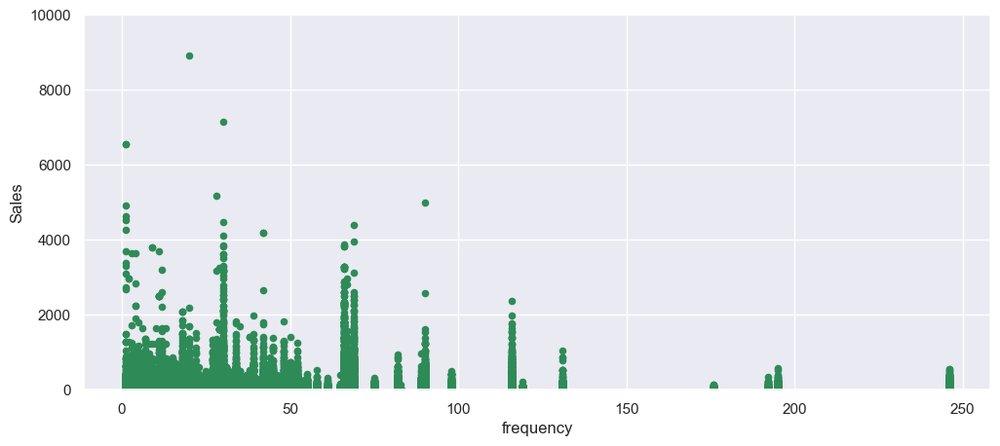

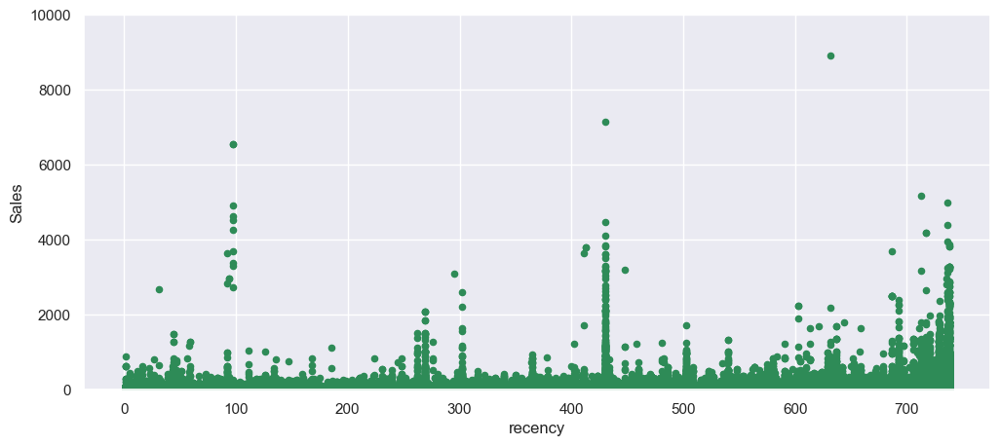

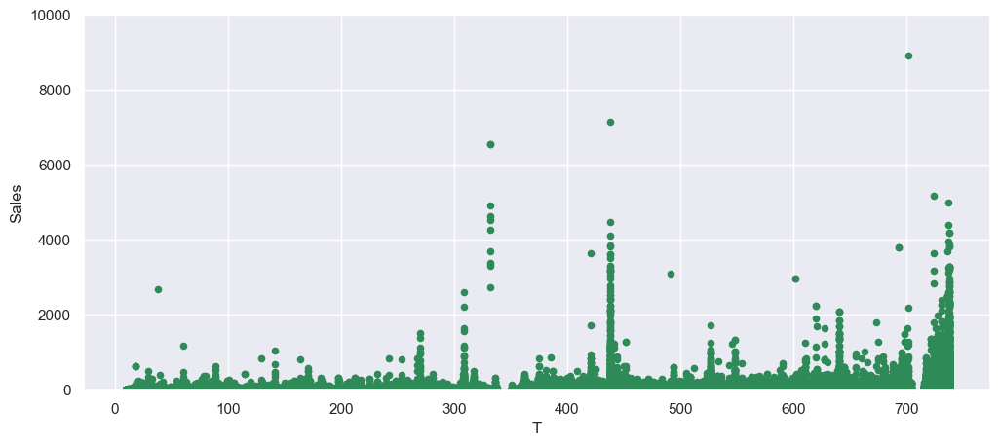

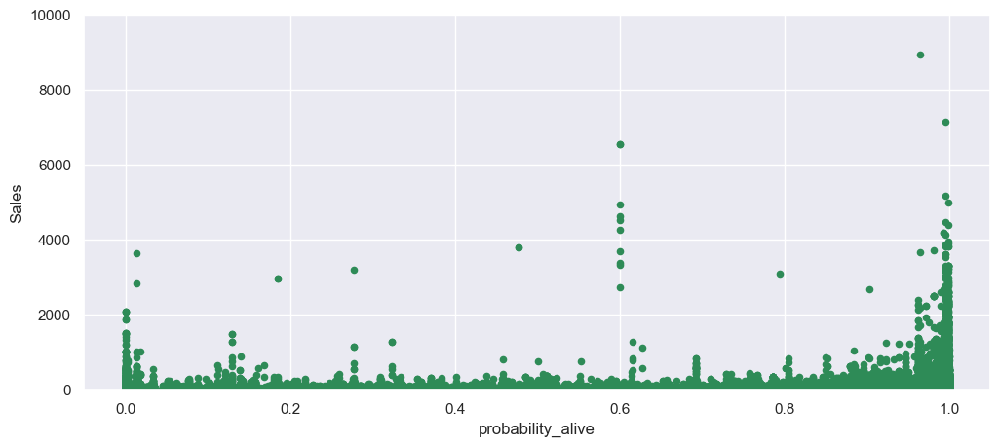

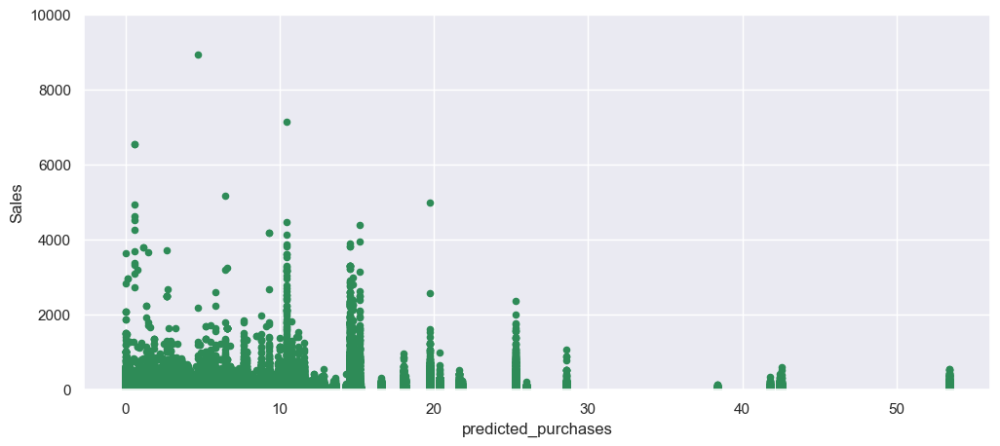

In [419]:
sns.set()
plots_ols = plot_features(X, "Sales")


### Complete ARIMA Model
#### (Pending)
"""
#import statsmodels.api as sm 
from statsmodels.tsa.arima.model import ARIMA, ARIMAResults
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX
"""

In [420]:
tsarima = tsaret.copy()


### Prophet Model's Forecasting

In [423]:
from matplotlib.ticker import PercentFormatter
from prophet import Prophet
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

# import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller


In [422]:
pip install prophet

In [424]:
display(models_on_retail.head())
print(models_on_retail.shape)


,index,CustomerID,InvoiceDate,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
0,0,13085,2009-12-01,12,6.95,83.40,Invoice,489434,85048,2009,12,15cm christmas glass ball 20 lights,United Kingdom
1,2050,15485,2009-12-01,2,8.50,17.00,Invoice,489658,22192,2009,12,blue diner wall clock,United Kingdom
2,2051,15485,2009-12-01,50,0.42,21.00,Invoice,489658,21498,2009,12,red spots wrap,United Kingdom
3,2052,17246,2009-12-01,7,0.65,4.55,Invoice,489661,15036,2009,12,assorted colours silk fan,United Kingdom
4,2053,12758,2009-12-01,16,1.25,20.00,Invoice,489599,20979,2009,12,36 pencils tube red spotty,Portugal


(1036427, 13)


In [425]:
models_on_retail.loc[:, "InvoiceDate"] = pd.to_datetime(
    models_on_retail.loc[:, "InvoiceDate"]
)
print(f"First observation on data is {models_on_retail.InvoiceDate.min()}")
print(f"Last observation on data is {models_on_retail.InvoiceDate.max()}")
print(
    f"We have {(models_on_retail.InvoiceDate.max() - models_on_retail.InvoiceDate.min()).days} days."
)


First observation on data is 2009-12-01 00:00:00
Last observation on data is 2011-12-09 00:00:00
We have 738 days.


In [426]:
prophet_on_retail = models_on_retail.copy()


In [427]:
prophet_on_retail.set_index("InvoiceDate", inplace=True)
prophet_on_retail.head()


,index,CustomerID,Quantity,UnitPrice,Sales,InvoiceType,InvoiceNo,StockCode,InvoiceYear,InvoiceMonth,Description,Country
InvoiceDate,,,,,,,,,,,,
2009-12-01,0,13085,12,6.95,83.40,Invoice,489434,85048,2009,12,15cm christmas glass ball 20 lights,United Kingdom
2009-12-01,2050,15485,2,8.50,17.00,Invoice,489658,22192,2009,12,blue diner wall clock,United Kingdom
2009-12-01,2051,15485,50,0.42,21.00,Invoice,489658,21498,2009,12,red spots wrap,United Kingdom
2009-12-01,2052,17246,7,0.65,4.55,Invoice,489661,15036,2009,12,assorted colours silk fan,United Kingdom
2009-12-01,2053,12758,16,1.25,20.00,Invoice,489599,20979,2009,12,36 pencils tube red spotty,Portugal


In [428]:
prophet_on_retail.shape


(1036427, 12)

##### Weekly Analysis

In [429]:
sales_prophet_on_retail = pd.DataFrame(
    prophet_on_retail.groupby("InvoiceDate").Sales.sum()
)
sales_prophet_on_retail = sales_prophet_on_retail.iloc[:-1]
sales_prophet_on_retail


,Sales
InvoiceDate,
2009-12-01,52581.40
2009-12-02,61999.59
2009-12-03,73088.66
2009-12-04,39491.11
2009-12-05,9794.41
...,...
2011-12-04,24383.43
2011-12-05,80121.36
2011-12-06,55402.09


In [430]:
weekly_sales = sales_prophet_on_retail.resample("W").sum()
weekly_sales.head()


,Sales
InvoiceDate,
2009-12-06,261430.81
2009-12-13,234929.83
2009-12-20,252568.78
2009-12-27,51638.35
2010-01-03,0.00


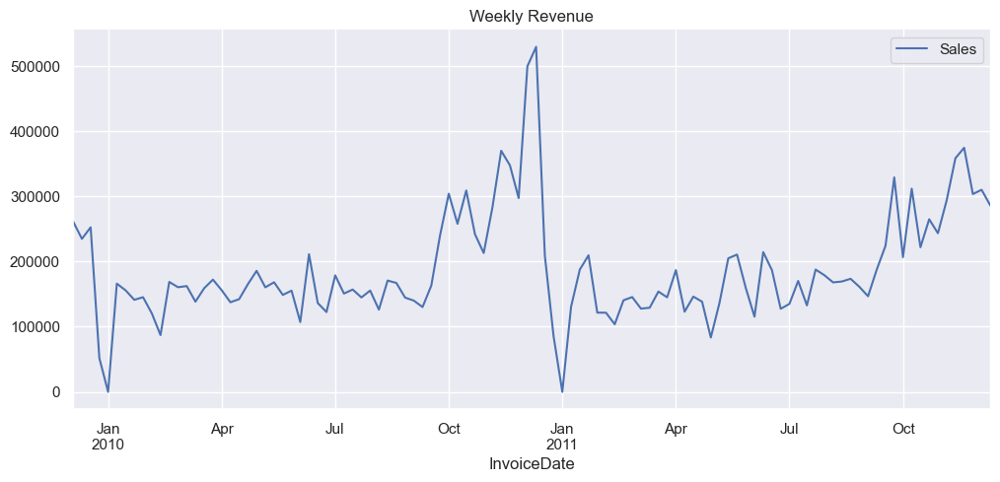

In [431]:
sns.set()
fig, ax = plt.subplots(figsize=(12, 5))
weekly_sales.plot(ax=ax).set_title("Weekly Revenue")
ax.grid(True)
sns.despine()
plt.show()


In [432]:
daily_sales = pd.DataFrame(
    prophet_on_retail.groupby("InvoiceDate").sum().resample("D").sum()["Sales"]
)
daily_sales


,Sales
InvoiceDate,
2009-12-01,52581.40
2009-12-02,61999.59
2009-12-03,73088.66
2009-12-04,39491.11
2009-12-05,9794.41
...,...
2011-12-05,80121.36
2011-12-06,55402.09
2011-12-07,72863.60


In [433]:
daily_sales.loc["2010-12-23":"2011-1-4"]


,Sales
InvoiceDate,
2010-12-23,11226.49
2010-12-24,0.00
2010-12-25,0.00
2010-12-26,0.00
2010-12-27,0.00
2010-12-28,0.00
2010-12-29,0.00
2010-12-30,0.00
2010-12-31,0.00


In [434]:
daily_sales.reset_index(inplace=True)
daily_sales["Closed"] = np.where((daily_sales.Sales == 0), 1, 0)
daily_sales.set_index("InvoiceDate", inplace=True)


In [435]:
daily_sales["weekday"] = daily_sales.index.day_name()
daily_sales


,Sales,Closed,weekday
InvoiceDate,,,
2009-12-01,52581.40,0,Tuesday
2009-12-02,61999.59,0,Wednesday
2009-12-03,73088.66,0,Thursday
2009-12-04,39491.11,0,Friday
2009-12-05,9794.41,0,Saturday
...,...,...,...
2011-12-05,80121.36,0,Monday
2011-12-06,55402.09,0,Tuesday
2011-12-07,72863.60,0,Wednesday


In [436]:
daily_sales[daily_sales.Sales == 0].weekday.value_counts()


weekday
Saturday     104
Monday        11
Friday         7
Sunday         6
Thursday       3
Tuesday        2
Wednesday      2
Name: count, dtype: int64

In [437]:
daily_sales.groupby("weekday").Sales.sum()


weekday
Friday       3216870.07
Monday       3466767.49
Saturday        9794.41
Sunday       1832171.66
Thursday     4111678.24
Tuesday      3968983.28
Wednesday    3478565.54
Name: Sales, dtype: float64

In [438]:
daily_sales_workdays = daily_sales[daily_sales.Sales > 0].copy()
daily_sales.drop("weekday", axis=1, inplace=True)
daily_sales_workdays.drop("weekday", axis=1, inplace=True)


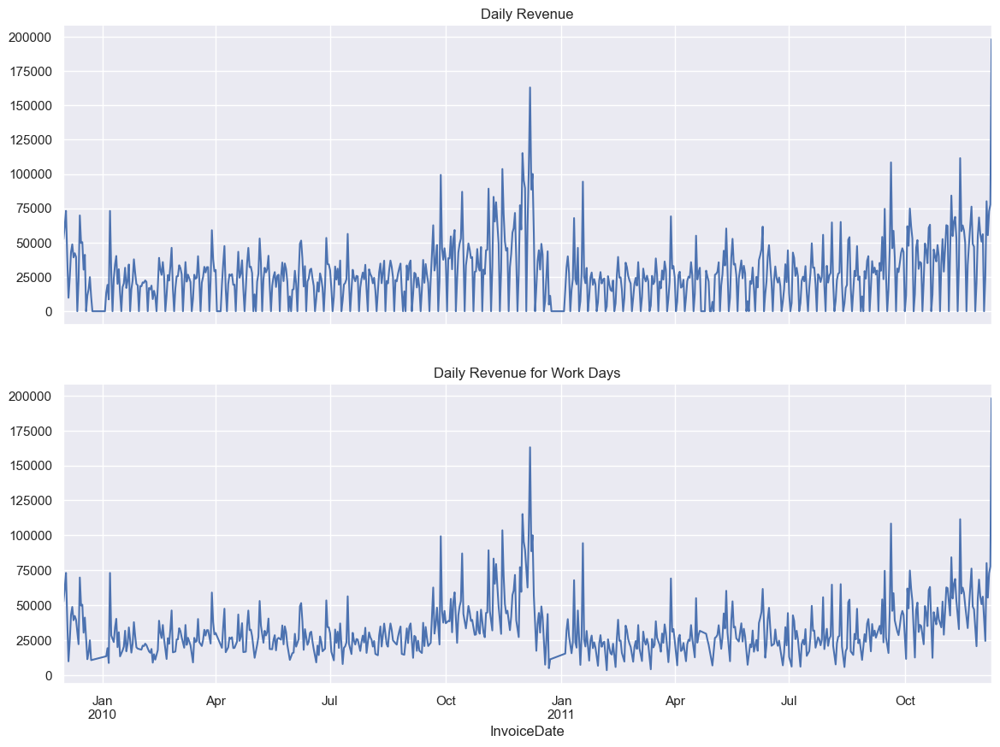

<Figure size 640x480 with 0 Axes>

In [439]:
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(14, 10))
for ax in axes:
    daily_sales.Sales.plot(ax=axes[0]).set_title("Daily Revenue")
    daily_sales_workdays.Sales.plot(ax=axes[1]).set_title("Daily Revenue for Work Days")
    sns.despine()
    plt.show()


#### Stationarity

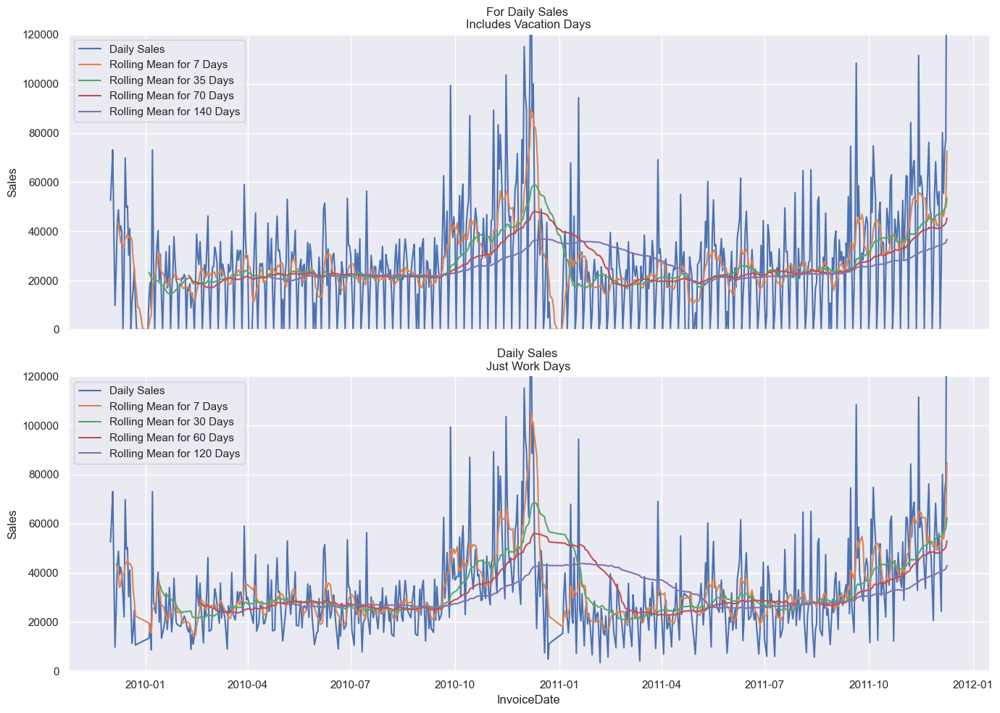

<Figure size 640x480 with 0 Axes>

In [440]:
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(14, 10))
for ax in axes:
    ax.set_ylim(0, 120000)
sns.lineplot(
    x=daily_sales.index, y=daily_sales.Sales, ax=axes[0], label="Daily Sales"
).set_title("For Daily Sales \nIncludes Vacation Days")
sns.lineplot(
    x=daily_sales.index,
    y=daily_sales.Sales.rolling(7).mean(),
    ax=axes[0],
    label="Rolling Mean for 7 Days",
)
sns.lineplot(
    x=daily_sales.index,
    y=daily_sales.Sales.rolling(35).mean(),
    ax=axes[0],
    label="Rolling Mean for 35 Days",
)
sns.lineplot(
    x=daily_sales.index,
    y=daily_sales.Sales.rolling(70).mean(),
    ax=axes[0],
    label="Rolling Mean for 70 Days",
)
sns.lineplot(
    x=daily_sales.index,
    y=daily_sales.Sales.rolling(140).mean(),
    ax=axes[0],
    label="Rolling Mean for 140 Days",
)
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales,
    ax=axes[1],
    label="Daily Sales",
).set_title("Daily Sales \nJust Work Days")
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.rolling(6).mean(),
    ax=axes[1],
    label="Rolling Mean for 7 Days",
)
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.rolling(30).mean(),
    ax=axes[1],
    label="Rolling Mean for 30 Days",
)
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.rolling(60).mean(),
    ax=axes[1],
    label="Rolling Mean for 60 Days",
)
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.rolling(120).mean(),
    ax=axes[1],
    label="Rolling Mean for 120 Days",
)
for ax in axes:
    ax.set_ylim(0, 120000)
    sns.despine()
    plt.tight_layout()
    plt.show()


#### Augmented Dickey-Fuller Test

In [441]:
def check_aprophet_on_retail(series, check=0.05):

    aprophet_on_retail = adfuller(series, autolag="AIC")

    print(f"H0: {series.name} is non-stationary.")
    print(f"H1: {series.name} is stationary.\n")

    test_stat = aprophet_on_retail[0]
    print(f"Aprophet_on_retail test statistic: {aprophet_on_retail[0]}")
    pvalue = aprophet_on_retail[1]
    print(f"p-value: {aprophet_on_retail[1]}")
    print(f"Number of lags: {aprophet_on_retail[2]}")
    print("\nCritical Values : \n")
    for key, item in aprophet_on_retail[4].items():
        print("\t", key, "\t", item)

    print(f"\nFor {check} significance level: \n")
    if pvalue < check:
        print("We can reject null hypothesis. This series is stationary.")
    else:
        print("We can not reject null hypothesis. This series is non-stationary.")


In [442]:
print("Performing Augmented Dickey-Fuller test for Total Price \n")
check_aprophet_on_retail(daily_sales.Sales)
print("\nPerforming Augmented Dickey-Fuller test for Total Price (for workdays)\n")
check_aprophet_on_retail(daily_sales_workdays.Sales)


Performing Augmented Dickey-Fuller test for Total Price 

H0: Sales is non-stationary.
H1: Sales is stationary.

Aprophet_on_retail test statistic: -1.8427664013690808
p-value: 0.3594454309494856
Number of lags: 20

Critical Values : 

	 1% 	 -3.439490435810785
	 5% 	 -2.8655738086413374
	 10% 	 -2.568918067209286

For 0.05 significance level: 

We can not reject null hypothesis. This series is non-stationary.

Performing Augmented Dickey-Fuller test for Total Price (for workdays)

H0: Sales is non-stationary.
H1: Sales is stationary.

Aprophet_on_retail test statistic: -1.2564262546938967
p-value: 0.6488642830459977
Number of lags: 17

Critical Values : 

	 1% 	 -3.4415584920942424
	 5% 	 -2.866484781324317
	 10% 	 -2.569403436033035

For 0.05 significance level: 

We can not reject null hypothesis. This series is non-stationary.


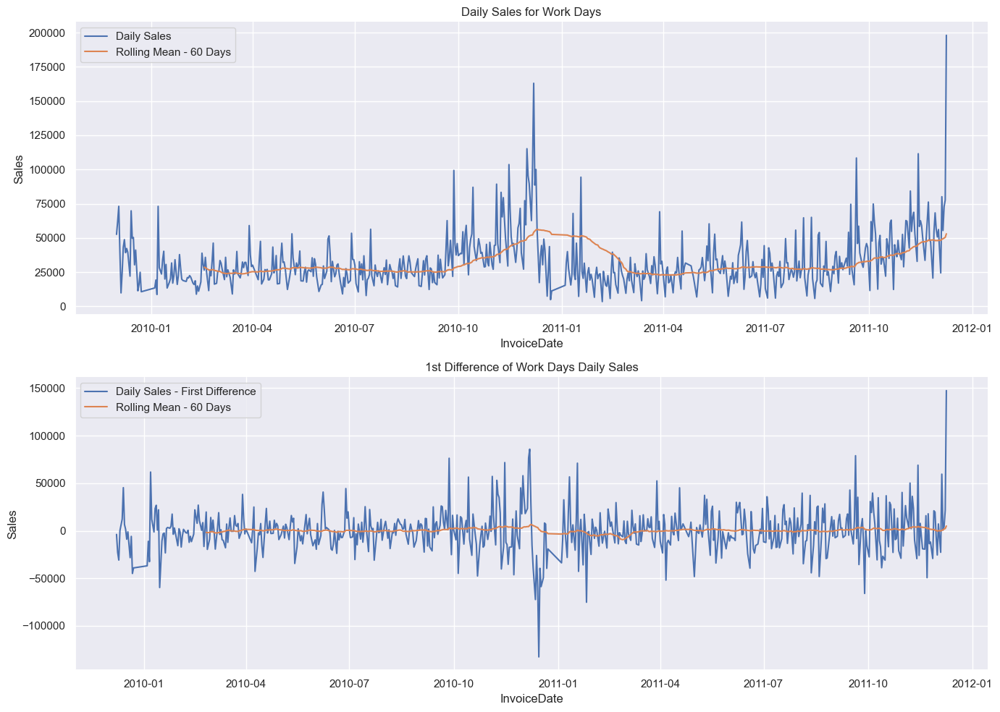

In [443]:
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

for ax in axes:
    ax

sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales,
    ax=axes[0],
    label="Daily Sales",
).set_title("Daily Sales for Work Days")
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.rolling(60).mean(),
    ax=axes[0],
    label="Rolling Mean - 60 Days",
)

sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.diff(7),
    ax=axes[1],
    label="Daily Sales - First Difference",
).set_title("1st Difference of Work Days Daily Sales")
sns.lineplot(
    x=daily_sales_workdays.index,
    y=daily_sales_workdays.Sales.diff(7).rolling(60).mean(),
    ax=axes[1],
    label="Rolling Mean - 60 Days",
)

for ax in axes:
    ax

sns.despine()
plt.tight_layout()
plt.show()


In [444]:
print("Performing Augmented Dickey-Fuller test for 1st Difference Revenue (All Days)")
check_aprophet_on_retail(daily_sales["Sales"].diff(7).dropna())

print("\nPerforming Augmented Dickey-Fuller test for 1st Difference of Work Days Sales")
check_aprophet_on_retail(daily_sales_workdays["Sales"].diff(6).dropna())


Performing Augmented Dickey-Fuller test for 1st Difference Revenue (All Days)
H0: Sales is non-stationary.
H1: Sales is stationary.

Aprophet_on_retail test statistic: -8.636465691074049
p-value: 5.573526871465136e-14
Number of lags: 20

Critical Values : 

	 1% 	 -3.439580754053961
	 5% 	 -2.865613606467485
	 10% 	 -2.568939269723711

For 0.05 significance level: 

We can reject null hypothesis. This series is stationary.

Performing Augmented Dickey-Fuller test for 1st Difference of Work Days Sales
H0: Sales is non-stationary.
H1: Sales is stationary.

Aprophet_on_retail test statistic: -8.088864252533208
p-value: 1.395742220674004e-12
Number of lags: 17

Critical Values : 

	 1% 	 -3.4416749612171467
	 5% 	 -2.8665360672844318
	 10% 	 -2.5694307639714626

For 0.05 significance level: 

We can reject null hypothesis. This series is stationary.


### Seasonality, Trend and Residual Decompostion

In [445]:
decompose = seasonal_decompose(daily_sales["Sales"], period=7)


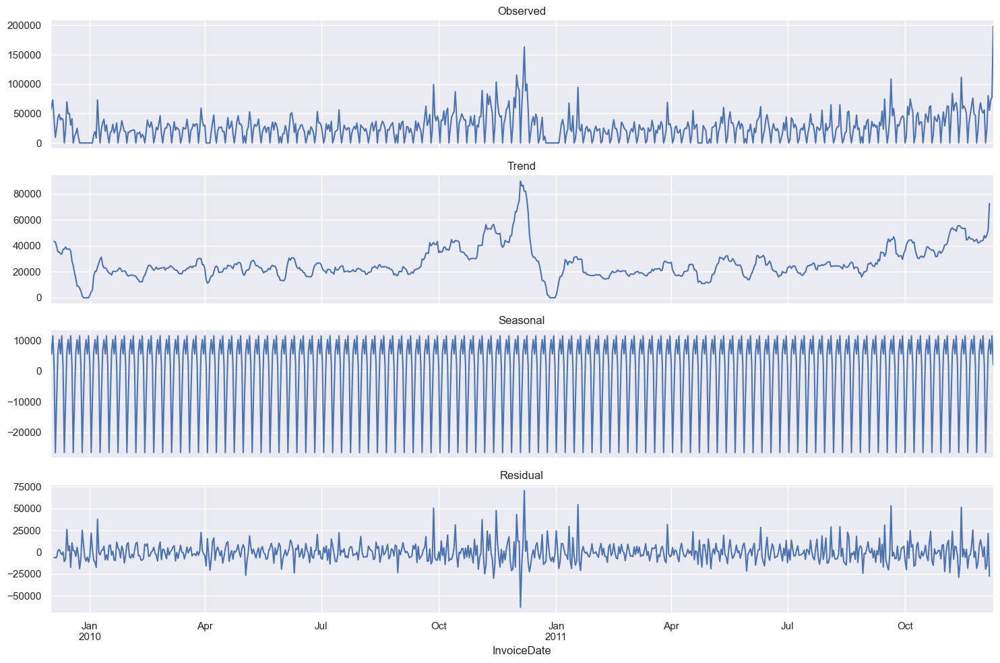

In [446]:
fig, axes = plt.subplots(4, 1, sharex=True, figsize=(15, 10))
for ax in axes:
    ax
decompose.observed.plot(ax=axes[0]).set_title("Observed")
decompose.trend.plot(ax=axes[1]).set_title("Trend")
decompose.seasonal.plot(ax=axes[2]).set_title("Seasonal")
decompose.resid.plot(ax=axes[3]).set_title("Residual")
sns.despine()
plt.tight_layout()
plt.show()


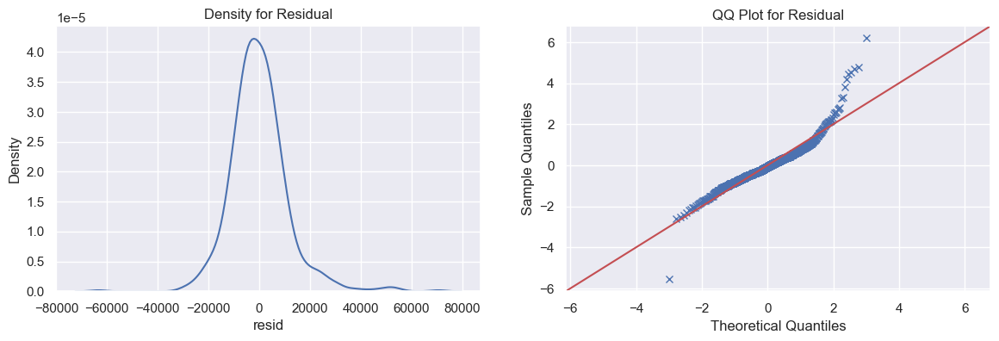

In [447]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for ax in axes:
    ax
sns.kdeplot(decompose.resid, ax=axes[0]).set_title("Density for Residual")
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sm.qqplot(decompose.resid.dropna(), ax=axes[1], marker="x", line="45", fit=True)
    axes[1].set_title("QQ Plot for Residual")
plt.show()


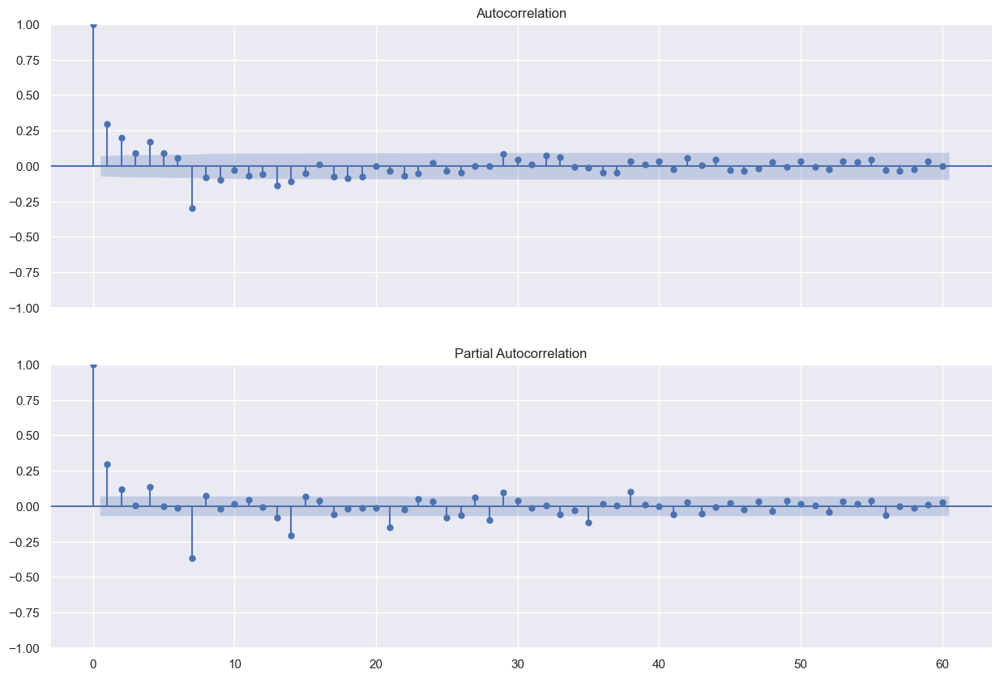

In [448]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(2, 1, sharex=True, figsize=(15, 10))
for ax in axes:
    ax
plot_acf(daily_sales["Sales"].diff(7).dropna(), lags=60, ax=axes[0])
plot_pacf(daily_sales["Sales"].diff(7).dropna(), lags=60, ax=axes[1])
sns.despine()
plt.show()


In [449]:
daily_data = daily_sales[["Sales"]].dropna().reset_index()
daily_data.columns = ["ds", "y"]
train_size = int(0.85 * len(daily_data))
train = daily_data.iloc[:train_size]
val = pd.DataFrame(daily_data.iloc[train_size:])
print(f"Training Days:\t\t{len(train)} \nValidation Days:\t {len(val)}")


Training Days:		628 
Validation Days:	 111


In [450]:
def scores(y_true, y_pred):
    print(f"R2: {r2_score(y_true, y_pred)}")
    print(f"MSE: {mean_squared_error(y_true, y_pred)}")
    print(f"Correlation: {np.corrcoef(y_true, y_pred)[0][1]}")


In [451]:
from prophet import Prophet

prophet_model = Prophet()
prophet_model.fit(train)
val_pred = prophet_model.predict(val)
train_pred = prophet_model.predict(train)


23:50:46 - cmdstanpy - INFO - Chain [1] start processing
23:50:47 - cmdstanpy - INFO - Chain [1] done processing


In [452]:
print("For Training set: \n")
scores(train.y, train_pred.yhat)
print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)


For Training set: 

R2: 0.4057243056016602
MSE: 238075697.3477243
Correlation: 0.6373301047558313

For Validation set: 

R2: -0.23147726547494907
MSE: 989810793.6396264
Correlation: 0.5920448583710637


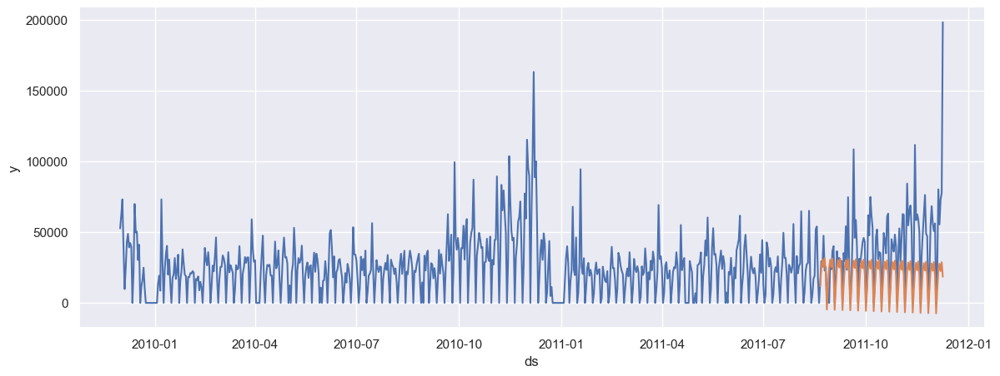

In [453]:
fig, ax = plt.subplots(figsize=(14, 5))
sns.lineplot(x=daily_data.ds, y=daily_data.y, ax=ax)
sns.lineplot(x=val_pred.ds, y=val_pred.yhat, ax=ax)
sns.despine()
plt.show()


In [454]:
black_friday = pd.DataFrame(
    {
        "holiday": "black friday",
        "ds": pd.to_datetime(["2009-11-27", "2010-11-26", "2012-11-23", "2013-11-29"]),
        "lower_window": 0,
        "upper_window": 1,
    }
)


In [455]:
def is_saturday(ds):
    date = pd.to_datetime(ds)
    return date.day_name() == "Saturday"


daily_data["is_saturday"] = daily_data["ds"].apply(is_saturday)
train = daily_data.iloc[:train_size]
val = pd.DataFrame(daily_data.iloc[train_size:])


In [456]:
prophet_model = Prophet(
    holidays=black_friday,
    daily_seasonality=True,
    weekly_seasonality=True,
    holidays_prior_scale=1,
    seasonality_prior_scale=5,
    changepoint_prior_scale=1,
)
prophet_model.add_country_holidays(country_name="UK")
prophet_model.add_regressor("is_saturday")
prophet_model.fit(train)
val_pred = prophet_model.predict(val)
train_pred = prophet_model.predict(train)


23:51:12 - cmdstanpy - INFO - Chain [1] start processing
23:51:12 - cmdstanpy - INFO - Chain [1] done processing


In [457]:
print("For Training set: \n")
scores(train.y, train_pred.yhat)
print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)


For Training set: 

R2: 0.5906950546494909
MSE: 163973659.38186494
Correlation: 0.7687507010710546

For Validation set: 

R2: 0.14387705040219578
MSE: 688116427.2794596
Correlation: 0.6522439885434057


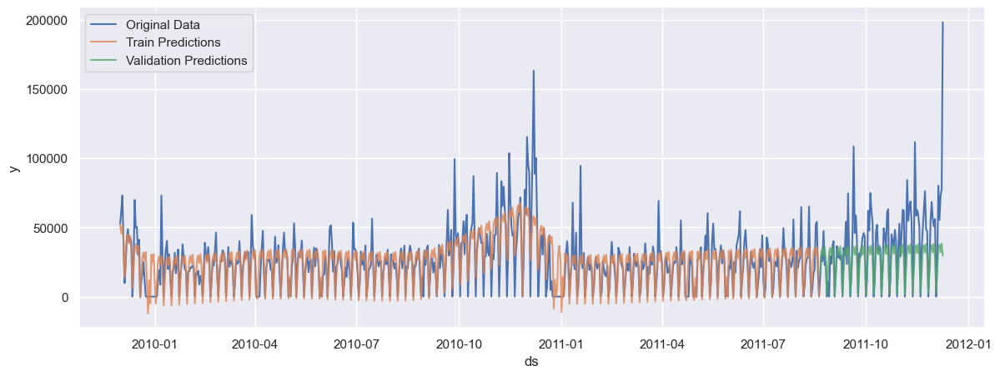

In [458]:
fig, ax = plt.subplots(figsize=(14, 5))
sns.lineplot(x=daily_data.ds, y=daily_data.y, ax=ax, label="Original Data")
sns.lineplot(
    x=train_pred.ds, y=train_pred.yhat, alpha=0.8, ax=ax, label="Train Predictions"
)
sns.lineplot(
    x=val_pred.ds, y=val_pred.yhat, ax=ax, alpha=0.8, label="Validation Predictions"
)
sns.despine()
plt.show()


In [459]:
train_pred["yhat"] = np.where((train_pred.is_saturday == 0), train_pred.yhat, 0)
val_pred["yhat"] = np.where((val_pred.is_saturday == 0), val_pred.yhat, 0)
print("For Training set: \n")
scores(train.y, train_pred.yhat)
print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)


For Training set: 

R2: 0.6123948789259563
MSE: 155280386.4689066
Correlation: 0.7839033030038457

For Validation set: 

R2: 0.1443949833062208
MSE: 687700134.1060835
Correlation: 0.6524677251464976


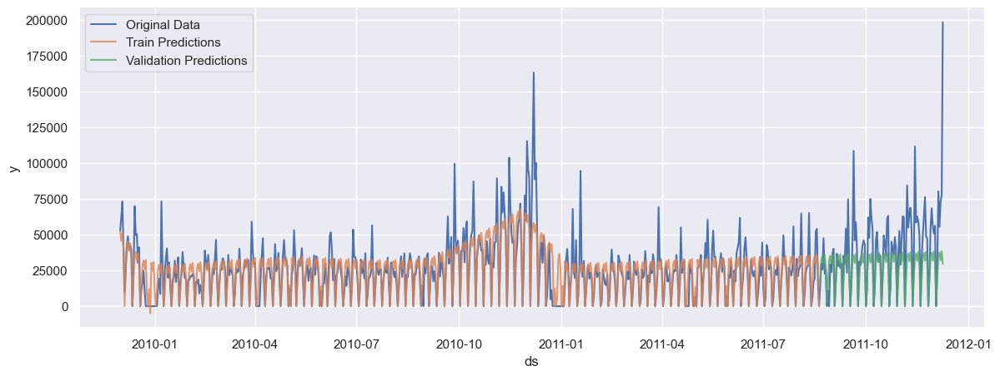

In [460]:
fig, ax = plt.subplots(figsize=(14, 5))
sns.lineplot(x=daily_data.ds, y=daily_data.y, ax=ax, label="Original Data")
sns.lineplot(
    x=train_pred.ds, y=train_pred.yhat, alpha=0.8, ax=ax, label="Train Predictions"
)
sns.lineplot(
    x=val_pred.ds, y=val_pred.yhat, ax=ax, alpha=0.8, label="Validation Predictions"
)
sns.despine()
plt.show()


### P2012 Predictions

In [461]:
prophet_model = Prophet(
    holidays=black_friday,
    daily_seasonality=True,
    weekly_seasonality=True,
    yearly_seasonality=True,
    holidays_prior_scale=1,
    seasonality_prior_scale=5,
    changepoint_prior_scale=1,
)
prophet_model.add_country_holidays(country_name="UK")
prophet_model.add_regressor("is_saturday")
prophet_model.fit(daily_data)


23:51:48 - cmdstanpy - INFO - Chain [1] start processing
23:51:48 - cmdstanpy - INFO - Chain [1] done processing


In [462]:
future = prophet_model.make_future_dataframe(periods=373)
future["is_saturday"] = future["ds"].apply(is_saturday)
future.tail()


,ds,is_saturday
1107,2012-12-12,False
1108,2012-12-13,False
1109,2012-12-14,False
1110,2012-12-15,True
1111,2012-12-16,False


In [463]:
forecast = prophet_model.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()


,ds,yhat,yhat_lower,yhat_upper
1107,2012-12-12,54584.664831,24101.736241,83369.750024
1108,2012-12-13,57766.338820,28076.717092,86755.724446
1109,2012-12-14,47278.403155,18731.180658,76552.967684
1110,2012-12-15,13476.148454,-16135.792956,44175.824576
1111,2012-12-16,27435.653988,-2360.006083,56346.712467


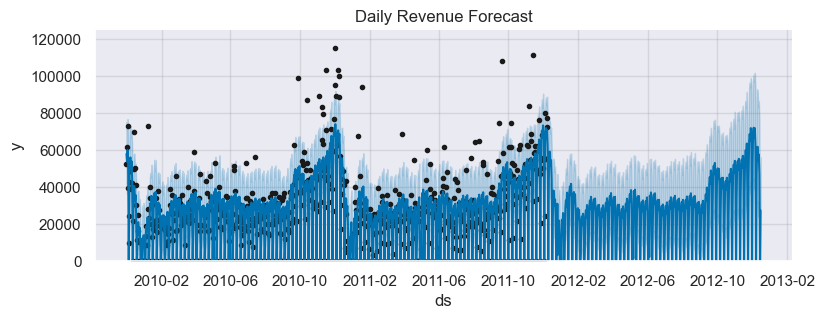

In [464]:
forecast["yhat"] = np.where((forecast.is_saturday == 0), forecast.yhat, 0)
forecast["yhat_lower"] = np.where((forecast.is_saturday == 0), forecast.yhat_lower, 0)
forecast["yhat_upper"] = np.where((forecast.is_saturday == 0), forecast.yhat_upper, 0)
fig, ax = plt.subplots(figsize=(9, 3))
prophet_model.plot(forecast, ax=ax)
ax.set_title("Daily Revenue Forecast")
# ax.grid(False)
ax.set_ylim(0, 125000)
sns.despine()
plt.show()


In [465]:
forecast["yhat_lower"].sum()


12928650.258355841

In [466]:
session_info.show()